In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import datetime as dt
import matplotlib.patches as mpatches
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA 

In [ ]:
import os
from IFEEL import ifeel_transformation, ifeel extraction
os.getcwd()

In [2]:
PV = pd.read_csv('C:\\Users\\HP PC\\Desktop\\Cleaned_154_PV_houses_net_loads.csv', delimiter = None, header = 'infer')
PV

,date_time,0,1,2,3,4,5,6,7,8,...,144,145,146,147,148,149,150,151,152,153
0,2008-07-01 00:00:00,0.04191,0.0742,0.0431,0.0771,0.1411,0.0911,0.0541,0.178,0.073,...,0.1681,0.0131,0.0621,0.0751,0.0576,0.05814,0.13116,0.07301,0.10114,0.0567
1,2008-07-01 00:30:00,0.04991,0.0742,0.0431,0.0661,0.0461,0.0991,0.0271,0.135,0.072,...,0.1121,0.0131,0.0891,0.0551,0.0516,0.05614,0.11516,0.07601,0.10214,0.0442
2,2008-07-01 01:00:00,0.07241,0.0657,0.0401,0.0811,0.0471,0.0591,0.0191,0.149,0.073,...,0.1221,0.0671,0.0661,0.0271,0.0611,0.03614,0.15616,0.07201,0.11914,0.0517
3,2008-07-01 01:30:00,0.04791,0.0617,0.0501,0.0751,0.0401,0.0871,0.0291,0.083,0.074,...,0.1181,0.0341,0.0661,0.0221,0.0421,0.02614,0.13016,0.10001,0.14114,0.0367
4,2008-07-01 02:00:00,0.04741,0.0762,0.0421,0.0881,0.0381,0.0551,0.0821,0.028,0.075,...,0.1071,0.0131,0.0741,0.0381,0.0546,0.07414,0.11016,0.10401,0.10414,0.0452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17515,2009-06-30 21:30:00,0.12991,0.0452,0.1021,0.1601,0.3311,0.1531,0.2061,0.073,0.068,...,0.1441,0.0901,0.2511,0.4351,0.2771,0.30314,0.29516,0.16501,0.05814,0.1572
17516,2009-06-30 22:00:00,0.13091,0.0672,0.1001,0.1911,0.1681,0.1061,0.1591,0.110,0.074,...,0.2071,0.0591,0.2281,0.2701,0.1551,0.30814,0.29516,0.17201,0.05814,0.4342
17517,2009-06-30 22:30:00,0.09091,0.0462,0.0831,0.1041,0.1351,0.0801,0.0701,0.109,0.085,...,0.2461,0.0111,0.1731,0.1911,0.1651,0.24114,0.28316,0.16801,0.05914,0.0982
17518,2009-06-30 23:00:00,0.03491,0.0552,0.0681,0.0991,0.1581,0.0781,0.0101,0.061,0.083,...,0.1201,0.0121,0.1171,0.1461,0.1271,0.19114,0.17816,0.16301,0.09114,0.0852


In [3]:
PV.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17520 entries, 0 to 17519
Columns: 155 entries, date_time to 153
dtypes: float64(154), object(1)
memory usage: 20.7+ MB


In [4]:
PV.describe()

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
count,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,...,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000
mean,-0.125803,-0.333519,-0.268402,-0.216146,-0.139919,-0.070703,-0.149090,-0.430774,-0.492627,-0.029576,...,-0.107284,-0.319483,-0.259309,-0.350552,-0.297683,-0.508809,-0.708381,-0.685597,-0.815677,-0.253635
std,0.749371,0.870958,0.699964,0.685666,0.502834,0.441100,0.496905,0.961687,0.927238,0.743912,...,0.556719,0.750297,0.801170,0.784104,0.740865,1.167940,1.523848,1.402031,1.563881,0.693713
min,-3.516673,-4.743056,-3.847661,-3.822419,-2.274097,-1.701879,-2.248268,-4.297623,-4.302192,-2.637311,...,-2.873625,-3.611111,-3.585397,-3.676165,-3.454662,-5.238196,-6.994813,-6.402079,-8.746975,-3.153676
25%,-0.404646,-0.591805,-0.451541,-0.368096,-0.287219,-0.225258,-0.274329,-0.766709,-0.822092,-0.330972,...,-0.273565,-0.560736,-0.528348,-0.648323,-0.541948,-0.912572,-1.261424,-1.223866,-1.261542,-0.475561
50%,0.076910,0.055200,0.041100,0.072100,0.062100,0.061100,0.048100,0.029000,0.056000,0.163615,...,0.079100,0.024100,0.065100,0.023100,0.041100,0.050118,0.087160,0.002010,0.067140,0.029200
75%,0.235910,0.107200,0.092100,0.143100,0.179100,0.111100,0.129100,0.122000,0.075000,0.352097,...,0.176100,0.110100,0.132100,0.072125,0.131100,0.161140,0.236160,0.162010,0.118140,0.073200
max,3.574316,2.175200,2.519100,3.014100,2.146613,2.337100,1.443833,1.907000,1.009000,6.346200,...,2.721100,1.463100,2.660876,1.914100,1.493100,3.278140,3.304160,2.903010,1.598015,4.254200


In [5]:
NPV = pd.read_csv('C:\\Users\\HP PC\\Desktop\\Cleaned_load_profiles_614_NonPV_houses_20080701_20090630.csv', delimiter = None, header ='infer')
NPV

,date_time,0,1,2,3,4,5,6,7,8,...,604,605,606,607,608,609,610,611,612,613
0,2008-07-01 00:00:00,0.0410,0.0740,0.039,0.073,0.137,0.091,0.050,0.171,0.066,...,0.083,0.162,0.1930,0.155,0.117,0.103,0.129,0.110,0.454,0.150
1,2008-07-01 00:30:00,0.0490,0.0740,0.039,0.062,0.042,0.099,0.023,0.128,0.065,...,0.048,0.185,0.1395,0.180,0.116,0.067,0.137,0.060,0.196,0.116
2,2008-07-01 01:00:00,0.0715,0.0655,0.036,0.077,0.043,0.059,0.015,0.142,0.066,...,0.040,0.206,0.1155,0.154,0.126,0.094,0.110,0.087,0.087,0.130
3,2008-07-01 01:30:00,0.0470,0.0615,0.046,0.071,0.036,0.087,0.025,0.076,0.067,...,0.050,0.147,0.1220,0.152,0.087,0.083,0.110,0.072,0.068,0.095
4,2008-07-01 02:00:00,0.0465,0.0760,0.038,0.084,0.034,0.055,0.078,0.021,0.068,...,0.081,0.205,0.1060,0.104,0.100,0.076,0.112,0.073,0.018,0.018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17515,2009-06-30 21:30:00,0.1290,0.0450,0.098,0.156,0.327,0.153,0.202,0.066,0.061,...,0.177,0.195,0.2020,0.175,0.314,0.101,0.640,0.770,0.213,0.286
17516,2009-06-30 22:00:00,0.1300,0.0670,0.096,0.187,0.164,0.106,0.155,0.103,0.067,...,0.206,0.222,0.2520,0.112,0.256,0.123,0.251,0.294,0.258,0.145
17517,2009-06-30 22:30:00,0.0900,0.0460,0.079,0.100,0.131,0.080,0.066,0.102,0.078,...,0.145,0.206,0.4170,0.127,0.247,0.048,0.184,0.085,0.266,0.305
17518,2009-06-30 23:00:00,0.0340,0.0550,0.064,0.095,0.154,0.078,0.006,0.054,0.076,...,0.069,0.227,0.3930,0.049,0.170,0.061,0.182,0.105,0.401,0.414


In [6]:
NPV.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17520 entries, 0 to 17519
Columns: 615 entries, date_time to 613
dtypes: float64(614), object(1)
memory usage: 82.2+ MB


In [7]:
NPV.describe()

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
count,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,...,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000
mean,0.247381,0.177571,0.120072,0.170921,0.159199,0.172044,0.150046,0.155430,0.093573,0.375792,...,0.162954,0.366770,0.371922,0.149044,0.244545,0.203525,0.340126,0.271536,0.500050,0.241632
std,0.314764,0.200052,0.147146,0.173180,0.133498,0.232710,0.145940,0.202817,0.086968,0.384666,...,0.153127,0.281240,0.374927,0.183623,0.305464,0.265459,0.392232,0.353940,0.430903,0.265161
min,0.031000,0.036000,0.021000,0.028000,0.017000,0.016000,0.000000,0.014000,0.019000,0.000000,...,0.036000,0.039000,0.046000,0.023000,0.024000,0.014000,0.054000,0.012000,0.018000,0.009000
25%,0.065000,0.062000,0.042000,0.074000,0.075000,0.070000,0.049000,0.038000,0.064000,0.181000,...,0.077000,0.158875,0.133000,0.069000,0.093000,0.067000,0.106000,0.079000,0.150000,0.054000
50%,0.105000,0.087000,0.071000,0.114000,0.154000,0.092000,0.102000,0.076000,0.069000,0.268000,...,0.111000,0.279000,0.231000,0.094000,0.140000,0.102000,0.174000,0.131000,0.386000,0.177000
75%,0.293000,0.228000,0.135000,0.195000,0.202000,0.180000,0.203000,0.200000,0.094000,0.417125,...,0.188000,0.491000,0.451000,0.144000,0.276000,0.208000,0.403000,0.326000,0.721000,0.322000
max,3.788000,2.175000,2.515000,3.010000,2.515000,2.442000,1.592000,2.295000,1.270000,6.346000,...,1.852000,2.733000,3.439000,2.144000,3.846000,3.076000,4.185000,3.492000,3.902000,2.588000


In [ ]:
feature_name_global = ifeel_extraction.feature_name_global
feature_name_peak = ifeel_extraction.feature_name_peak

df_test = pd.read_csv('C:\\Users\\HP PC\\Desktop\\Cleaned_154_PV_houses_net_loads.csv', header = 0, index_col = 0, parse_dates = False)
sample_interval_in_30mins = 12/df_test.shape[1]

start_time = 0       #00:00
end_time= 23         #23:00
alphabet_size        7      #alphabet size of SAX representation

In [ ]:
#DATA TRANSFORMATION

[df_raw, df_raw_diff, df_SAX_number, df_SAX_alphabet, df_SAX_number_diff] = ifeel_transformation.feature_transformation(df_test, alphabet_size, start_time, end_time)


In [ ]:
#GLOBAL FEATURE EXTRACTION FOR EACH DAILY PROFILE

feature_global_all_days = pd.DataFrame()
for i in np.arange(0, df_raw.shape[0]):
    ts = df_raw.iloc[i]
    ts_diff = df_raw_diff.iloc[i]
    feature_global_all_each = ifeel_extraction.feature_global(ts, ts_diff, sample_interval_in_30mins).global_all().T
    feature_global_all_days = feature_global_all_days.append(features_global_all_tech, ignore_index=True)
    
    feature_global_all_days.columns = ifeel_extraction.feature_name_global
    feature_global_all_days.head()
    
#Peak feature extraction for each daily profile

feature_peak_period_all_days = pd.DataFrame()
for i in np.arange(0, df_raw.shape[0]):
    ts_sax = df_SAX_number.iloc[i]
    ts_sax_diff = df_SAX_number_diff.iloc[i]
    feature_global_all_each = ifeel_extraction.feature_peak_period(ts_sax, ts_sax_diff, alphabet_size, sample_interval_in_30mins).T
    feature_global_all_days = feature_peak_period_all_days.append(features_peak_all_tech, ignore_index=True)
    
    feature_peak_period_all_days.columns = ifeel_extraction.feature_name_peak
    feature_global_all_days.head()
    
    
    
    

# DATA CLEANING AND ANALYSIS

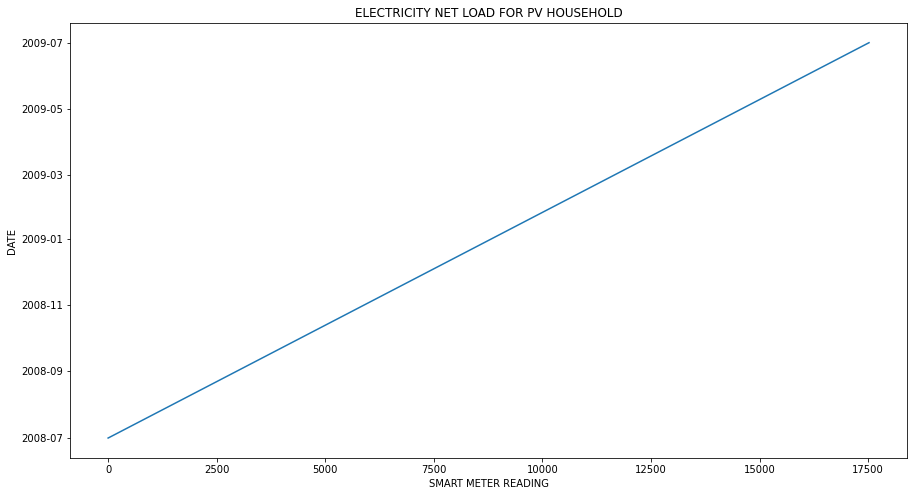

In [8]:
PV['Timestamp'] = pd.to_datetime(PV['date_time'])

plt.figure(num=1, figsize=(15, 8))
PV.Timestamp.plot()
plt.title('ELECTRICITY NET LOAD FOR PV HOUSEHOLD')
plt.xlabel('SMART METER READING')
plt.ylabel('DATE')

plt.show()

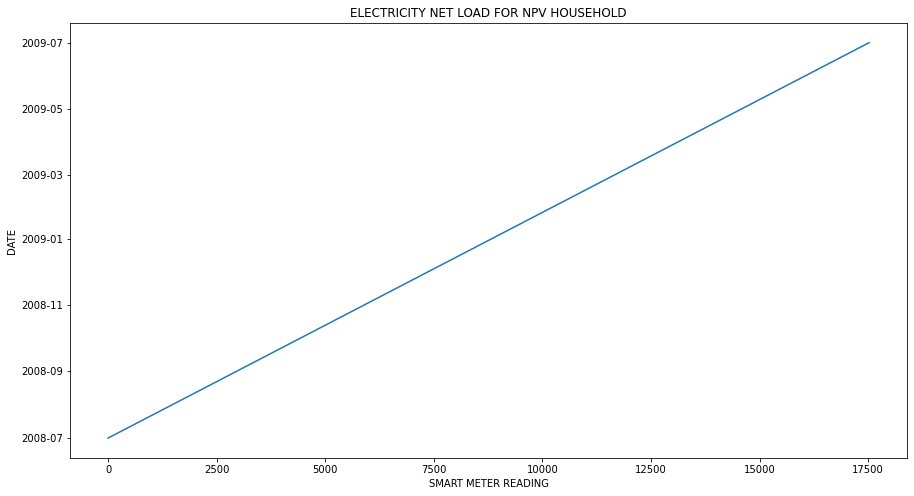

In [9]:
NPV['Timestamp'] = pd.to_datetime(NPV['date_time'])

plt.figure(num=1, figsize=(15, 8))
NPV.Timestamp.plot()
plt.title('ELECTRICITY NET LOAD FOR NPV HOUSEHOLD')
plt.xlabel('SMART METER READING')
plt.ylabel('DATE')

plt.show()

In [10]:
PV = PV.drop(['date_time'], axis=1)
PV

,0,1,2,3,4,5,6,7,8,9,...,145,146,147,148,149,150,151,152,153,Timestamp
0,0.04191,0.0742,0.0431,0.0771,0.1411,0.0911,0.0541,0.178,0.073,0.1742,...,0.0131,0.0621,0.0751,0.0576,0.05814,0.13116,0.07301,0.10114,0.0567,2008-07-01 00:00:00
1,0.04991,0.0742,0.0431,0.0661,0.0461,0.0991,0.0271,0.135,0.072,0.2832,...,0.0131,0.0891,0.0551,0.0516,0.05614,0.11516,0.07601,0.10214,0.0442,2008-07-01 00:30:00
2,0.07241,0.0657,0.0401,0.0811,0.0471,0.0591,0.0191,0.149,0.073,0.2442,...,0.0671,0.0661,0.0271,0.0611,0.03614,0.15616,0.07201,0.11914,0.0517,2008-07-01 01:00:00
3,0.04791,0.0617,0.0501,0.0751,0.0401,0.0871,0.0291,0.083,0.074,0.2042,...,0.0341,0.0661,0.0221,0.0421,0.02614,0.13016,0.10001,0.14114,0.0367,2008-07-01 01:30:00
4,0.04741,0.0762,0.0421,0.0881,0.0381,0.0551,0.0821,0.028,0.075,0.2382,...,0.0131,0.0741,0.0381,0.0546,0.07414,0.11016,0.10401,0.10414,0.0452,2008-07-01 02:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17515,0.12991,0.0452,0.1021,0.1601,0.3311,0.1531,0.2061,0.073,0.068,0.3192,...,0.0901,0.2511,0.4351,0.2771,0.30314,0.29516,0.16501,0.05814,0.1572,2009-06-30 21:30:00
17516,0.13091,0.0672,0.1001,0.1911,0.1681,0.1061,0.1591,0.110,0.074,0.3592,...,0.0591,0.2281,0.2701,0.1551,0.30814,0.29516,0.17201,0.05814,0.4342,2009-06-30 22:00:00
17517,0.09091,0.0462,0.0831,0.1041,0.1351,0.0801,0.0701,0.109,0.085,0.4172,...,0.0111,0.1731,0.1911,0.1651,0.24114,0.28316,0.16801,0.05914,0.0982,2009-06-30 22:30:00
17518,0.03491,0.0552,0.0681,0.0991,0.1581,0.0781,0.0101,0.061,0.083,0.4192,...,0.0121,0.1171,0.1461,0.1271,0.19114,0.17816,0.16301,0.09114,0.0852,2009-06-30 23:00:00


In [11]:
NPV = NPV.drop(['date_time'], axis=1)
NPV

,0,1,2,3,4,5,6,7,8,9,...,605,606,607,608,609,610,611,612,613,Timestamp
0,0.0410,0.0740,0.039,0.073,0.137,0.091,0.050,0.171,0.066,0.174,...,0.162,0.1930,0.155,0.117,0.103,0.129,0.110,0.454,0.150,2008-07-01 00:00:00
1,0.0490,0.0740,0.039,0.062,0.042,0.099,0.023,0.128,0.065,0.283,...,0.185,0.1395,0.180,0.116,0.067,0.137,0.060,0.196,0.116,2008-07-01 00:30:00
2,0.0715,0.0655,0.036,0.077,0.043,0.059,0.015,0.142,0.066,0.244,...,0.206,0.1155,0.154,0.126,0.094,0.110,0.087,0.087,0.130,2008-07-01 01:00:00
3,0.0470,0.0615,0.046,0.071,0.036,0.087,0.025,0.076,0.067,0.204,...,0.147,0.1220,0.152,0.087,0.083,0.110,0.072,0.068,0.095,2008-07-01 01:30:00
4,0.0465,0.0760,0.038,0.084,0.034,0.055,0.078,0.021,0.068,0.238,...,0.205,0.1060,0.104,0.100,0.076,0.112,0.073,0.018,0.018,2008-07-01 02:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17515,0.1290,0.0450,0.098,0.156,0.327,0.153,0.202,0.066,0.061,0.319,...,0.195,0.2020,0.175,0.314,0.101,0.640,0.770,0.213,0.286,2009-06-30 21:30:00
17516,0.1300,0.0670,0.096,0.187,0.164,0.106,0.155,0.103,0.067,0.359,...,0.222,0.2520,0.112,0.256,0.123,0.251,0.294,0.258,0.145,2009-06-30 22:00:00
17517,0.0900,0.0460,0.079,0.100,0.131,0.080,0.066,0.102,0.078,0.417,...,0.206,0.4170,0.127,0.247,0.048,0.184,0.085,0.266,0.305,2009-06-30 22:30:00
17518,0.0340,0.0550,0.064,0.095,0.154,0.078,0.006,0.054,0.076,0.419,...,0.227,0.3930,0.049,0.170,0.061,0.182,0.105,0.401,0.414,2009-06-30 23:00:00


CREATING DATAFRAME FOR 30MINS, 1HR, 2HRS AND 3HRS RESOLUTION

In [12]:
#FOR 30MINS RESOLUTION

PV_30MINS = PV.set_index('Timestamp', drop= True, append= False, inplace= False, verify_integrity= False)
PV_30MINS = PV_30MINS.resample('0.5H').sum()
PV_30MINS

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.04191,0.0742,0.0431,0.0771,0.1411,0.0911,0.0541,0.178,0.073,0.1742,...,0.1681,0.0131,0.0621,0.0751,0.0576,0.05814,0.13116,0.07301,0.10114,0.0567
2008-07-01 00:30:00,0.04991,0.0742,0.0431,0.0661,0.0461,0.0991,0.0271,0.135,0.072,0.2832,...,0.1121,0.0131,0.0891,0.0551,0.0516,0.05614,0.11516,0.07601,0.10214,0.0442
2008-07-01 01:00:00,0.07241,0.0657,0.0401,0.0811,0.0471,0.0591,0.0191,0.149,0.073,0.2442,...,0.1221,0.0671,0.0661,0.0271,0.0611,0.03614,0.15616,0.07201,0.11914,0.0517
2008-07-01 01:30:00,0.04791,0.0617,0.0501,0.0751,0.0401,0.0871,0.0291,0.083,0.074,0.2042,...,0.1181,0.0341,0.0661,0.0221,0.0421,0.02614,0.13016,0.10001,0.14114,0.0367
2008-07-01 02:00:00,0.04741,0.0762,0.0421,0.0881,0.0381,0.0551,0.0821,0.028,0.075,0.2382,...,0.1071,0.0131,0.0741,0.0381,0.0546,0.07414,0.11016,0.10401,0.10414,0.0452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 21:30:00,0.12991,0.0452,0.1021,0.1601,0.3311,0.1531,0.2061,0.073,0.068,0.3192,...,0.1441,0.0901,0.2511,0.4351,0.2771,0.30314,0.29516,0.16501,0.05814,0.1572
2009-06-30 22:00:00,0.13091,0.0672,0.1001,0.1911,0.1681,0.1061,0.1591,0.110,0.074,0.3592,...,0.2071,0.0591,0.2281,0.2701,0.1551,0.30814,0.29516,0.17201,0.05814,0.4342
2009-06-30 22:30:00,0.09091,0.0462,0.0831,0.1041,0.1351,0.0801,0.0701,0.109,0.085,0.4172,...,0.2461,0.0111,0.1731,0.1911,0.1651,0.24114,0.28316,0.16801,0.05914,0.0982


In [13]:
len(PV_30MINS)

17520

In [14]:
NPV_30MINS = NPV.set_index('Timestamp', drop= True, append= False, inplace= False, verify_integrity= False)
NPV_30MINS = NPV_30MINS.resample('0.5H').sum()
NPV_30MINS

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.0410,0.0740,0.039,0.073,0.137,0.091,0.050,0.171,0.066,0.174,...,0.083,0.162,0.1930,0.155,0.117,0.103,0.129,0.110,0.454,0.150
2008-07-01 00:30:00,0.0490,0.0740,0.039,0.062,0.042,0.099,0.023,0.128,0.065,0.283,...,0.048,0.185,0.1395,0.180,0.116,0.067,0.137,0.060,0.196,0.116
2008-07-01 01:00:00,0.0715,0.0655,0.036,0.077,0.043,0.059,0.015,0.142,0.066,0.244,...,0.040,0.206,0.1155,0.154,0.126,0.094,0.110,0.087,0.087,0.130
2008-07-01 01:30:00,0.0470,0.0615,0.046,0.071,0.036,0.087,0.025,0.076,0.067,0.204,...,0.050,0.147,0.1220,0.152,0.087,0.083,0.110,0.072,0.068,0.095
2008-07-01 02:00:00,0.0465,0.0760,0.038,0.084,0.034,0.055,0.078,0.021,0.068,0.238,...,0.081,0.205,0.1060,0.104,0.100,0.076,0.112,0.073,0.018,0.018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 21:30:00,0.1290,0.0450,0.098,0.156,0.327,0.153,0.202,0.066,0.061,0.319,...,0.177,0.195,0.2020,0.175,0.314,0.101,0.640,0.770,0.213,0.286
2009-06-30 22:00:00,0.1300,0.0670,0.096,0.187,0.164,0.106,0.155,0.103,0.067,0.359,...,0.206,0.222,0.2520,0.112,0.256,0.123,0.251,0.294,0.258,0.145
2009-06-30 22:30:00,0.0900,0.0460,0.079,0.100,0.131,0.080,0.066,0.102,0.078,0.417,...,0.145,0.206,0.4170,0.127,0.247,0.048,0.184,0.085,0.266,0.305


In [15]:
#FOR IHR RESOLUTION

PV_1HR = PV.set_index('Timestamp', drop= True, append= False, inplace= False, verify_integrity= False)
PV_1HR = PV_1HR.resample('H').sum()
PV_1HR

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.09182,0.148400,0.086200,0.143200,0.187200,0.190200,0.081200,0.313000,0.145000,0.457400,...,0.280200,0.026200,0.151200,0.130200,0.109200,0.114280,0.246320,0.149020,0.203280,0.100900
2008-07-01 01:00:00,0.12032,0.127400,0.090200,0.156200,0.087200,0.146200,0.048200,0.232000,0.147000,0.448400,...,0.240200,0.101200,0.132200,0.049200,0.103200,0.062280,0.286320,0.172020,0.260280,0.088400
2008-07-01 02:00:00,0.11282,0.138400,0.087200,0.146200,0.079200,0.110200,0.127200,0.095000,0.151000,0.382400,...,0.167200,0.046200,0.151200,0.066200,0.099200,0.128280,0.189320,0.205020,0.206280,0.093400
2008-07-01 03:00:00,0.09332,0.134900,0.087200,0.159200,0.091200,0.152200,0.098200,0.077000,0.151000,0.294400,...,0.155200,0.084200,0.122200,0.045200,0.096200,0.059280,0.185320,0.192020,0.206280,0.085400
2008-07-01 04:00:00,0.10132,0.130900,0.094200,0.149200,0.092200,0.110200,0.119200,0.072000,0.153000,0.317400,...,0.231200,0.062200,0.159200,0.060200,0.096700,0.118280,0.193320,0.146020,0.238280,0.093400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 19:00:00,-0.11079,-0.082012,-0.011686,0.042314,-0.482338,-0.085009,-0.317192,-1.156680,-1.163827,1.326931,...,1.717014,-0.955158,-0.791951,-1.074357,-0.959995,-1.330052,-1.459439,-1.665836,-0.633032,-0.767899
2009-06-30 20:00:00,0.22490,0.090159,0.226200,0.314200,-0.111480,0.091103,0.108437,-0.402695,-0.404551,0.481444,...,0.571308,-0.292810,-0.137671,0.478418,-0.228642,-0.376947,-0.518028,-0.632861,-0.075734,-0.350298
2009-06-30 21:00:00,0.29082,0.134400,0.308200,0.432200,0.503200,0.307200,0.324200,0.127000,0.150000,0.657400,...,0.387200,0.260200,0.520200,1.496200,0.397200,0.537280,0.576320,0.371020,0.117280,0.225400


In [16]:
NPV_1HR = NPV.set_index('Timestamp', drop= True, append= False, inplace= False, verify_integrity= False)
NPV_1HR = NPV_1HR.resample('H').sum()
NPV_1HR

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.0900,0.1480,0.078,0.135,0.179,0.190,0.073,0.299,0.131,0.457,...,0.131,0.347,0.3325,0.335,0.233,0.170,0.266,0.170,0.650,0.266
2008-07-01 01:00:00,0.1185,0.1270,0.082,0.148,0.079,0.146,0.040,0.218,0.133,0.448,...,0.090,0.353,0.2375,0.306,0.213,0.177,0.220,0.159,0.155,0.225
2008-07-01 02:00:00,0.1110,0.1380,0.079,0.138,0.071,0.110,0.119,0.081,0.137,0.382,...,0.122,0.403,0.2010,0.228,0.229,0.169,0.223,0.146,0.096,0.068
2008-07-01 03:00:00,0.0915,0.1345,0.079,0.151,0.083,0.152,0.090,0.063,0.137,0.294,...,0.118,0.344,0.2305,0.225,0.206,0.166,0.212,0.155,0.151,0.044
2008-07-01 04:00:00,0.0995,0.1305,0.086,0.141,0.084,0.110,0.111,0.058,0.139,0.317,...,0.096,0.332,0.2200,0.228,0.148,0.153,0.252,0.156,0.107,0.079
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 19:00:00,0.1650,0.3280,0.196,0.250,0.120,0.455,0.298,0.133,0.120,2.226,...,1.183,0.821,0.8680,0.238,0.222,0.293,0.687,0.147,0.746,0.408
2009-06-30 20:00:00,0.2560,0.1680,0.218,0.306,0.105,0.343,0.334,0.179,0.173,0.904,...,0.434,0.524,0.4140,0.249,0.471,0.167,1.633,3.235,0.680,0.716
2009-06-30 21:00:00,0.2890,0.1340,0.300,0.424,0.495,0.307,0.316,0.113,0.136,0.657,...,0.395,0.454,0.3850,0.299,0.631,0.221,1.491,1.415,0.446,0.593


In [17]:
#FOR 2HRS RESOLUTION

PV_2HR = PV.set_index('Timestamp', drop= True, append= False, inplace= False, verify_integrity= False)
PV_2HR = PV_2HR.resample('2H').sum()
PV_2HR

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.212140,0.275800,0.176400,0.299400,0.274400,0.336400,0.129400,0.545000,0.292000,0.905800,...,0.520400,0.127400,0.283400,0.179400,0.212400,0.176560,0.532640,0.321040,0.463560,0.189300
2008-07-01 02:00:00,0.206140,0.273300,0.174400,0.305400,0.170400,0.262400,0.225400,0.172000,0.302000,0.676800,...,0.322400,0.130400,0.273400,0.111400,0.195400,0.187560,0.374640,0.397040,0.412560,0.178800
2008-07-01 04:00:00,-0.085667,-0.181640,-0.035317,0.163317,-0.031981,0.617548,0.046583,-0.390248,-0.254957,0.325784,...,0.222680,-0.242421,-0.031123,-0.257418,-0.182791,-0.598616,-0.496184,-0.619544,-0.335565,-0.189775
2008-07-01 06:00:00,-1.925303,-4.059591,-3.201173,-2.893035,-2.433084,-1.801315,-1.777894,-4.823539,-5.269884,-3.208856,...,-2.354215,-3.662621,-1.617440,-3.951710,-3.609403,-6.686246,-8.168818,-7.814035,-7.775015,-3.279486
2008-07-01 08:00:00,-5.366704,-7.293035,-5.616859,-5.499373,-4.490832,-2.916453,-4.184816,-9.354048,-9.007145,-5.602510,...,-3.416246,-7.043979,-6.876851,-6.721245,-6.627273,-11.105045,-14.792781,-13.886109,-13.256524,-6.053137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 14:00:00,-2.082006,-2.956142,-2.164529,-1.878373,-2.129063,-1.325987,-2.064370,-4.428909,-4.358771,-0.950783,...,-1.473026,-3.254920,-3.322514,-2.908165,-3.095127,-5.322730,-7.416613,-4.383659,-5.183672,-2.518904
2009-06-30 16:00:00,-1.599126,-2.558869,-1.559942,-1.065921,-1.994695,-1.298310,-1.702551,-3.570596,-4.157936,-1.585010,...,-0.778221,-2.182100,-2.038893,-3.338794,-1.864878,-4.795662,-6.957959,-4.799576,-4.977189,-2.730856
2009-06-30 18:00:00,-0.663377,-0.892115,-0.429373,-0.368373,-1.534540,-0.659852,-1.220186,-3.307854,-3.299819,1.144414,...,1.656467,-2.723557,-2.444503,-2.992149,-2.775120,-3.954196,-4.464085,-4.824746,-2.260500,-2.310849


In [18]:
NPV_2HR = NPV.set_index('Timestamp', drop= True, append= False, inplace= False, verify_integrity= False)
NPV_2HR = NPV_2HR.resample('2H').sum()
NPV_2HR

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.2085,0.2750,0.160,0.283,0.258,0.336,0.113,0.517,0.264,0.905,...,0.221,0.700,0.5700,0.641,0.446,0.347,0.486,0.329,0.805,0.491
2008-07-01 02:00:00,0.2025,0.2725,0.158,0.289,0.154,0.262,0.209,0.144,0.274,0.676,...,0.240,0.747,0.4315,0.453,0.435,0.335,0.435,0.301,0.247,0.112
2008-07-01 04:00:00,0.2135,0.2635,0.181,0.380,0.149,0.851,0.226,0.140,0.276,0.726,...,0.244,0.658,0.4315,0.461,0.863,0.280,0.465,0.297,0.246,0.140
2008-07-01 06:00:00,1.3025,0.4005,0.165,0.474,0.409,0.470,1.048,0.716,0.277,0.600,...,0.233,1.008,0.8445,0.832,1.967,0.368,0.727,0.304,1.250,0.134
2008-07-01 08:00:00,0.2090,0.3490,0.342,0.456,0.548,0.988,0.834,0.195,0.551,0.913,...,0.211,2.062,0.7555,0.548,1.758,3.515,0.979,0.986,2.496,0.875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 14:00:00,0.2170,0.2370,0.176,0.462,0.214,0.584,0.279,0.211,0.281,2.246,...,0.334,2.989,1.7900,0.357,0.284,1.441,0.421,0.337,1.092,1.666
2009-06-30 16:00:00,0.4110,0.2420,0.462,0.956,0.226,0.524,0.524,0.850,0.260,1.462,...,0.486,2.862,5.1460,0.574,0.384,0.248,1.739,0.308,1.706,2.319
2009-06-30 18:00:00,0.2860,0.4680,0.424,0.485,0.220,0.830,0.563,0.278,0.273,3.621,...,1.719,1.562,2.4010,1.036,0.422,0.702,1.889,0.303,1.346,0.862


In [19]:
#FOR 3HRS RESOLUTION

PV_3HR = PV.set_index('Timestamp', drop= True, append= False, inplace= False, verify_integrity= False)
PV_3HR = PV_3HR.resample('3H').sum()
PV_3HR

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.324960,0.414200,0.263600,0.445600,0.353600,0.446600,0.256600,0.640000,0.443000,1.288200,...,0.687600,0.173600,0.434600,0.245600,0.311600,0.304840,0.721960,0.526060,0.669840,0.282700
2008-07-01 03:00:00,0.007653,-0.046740,0.051883,0.322517,0.059219,0.769748,0.144783,-0.313248,-0.103957,0.620184,...,0.377880,-0.158221,0.091077,-0.212218,-0.086591,-0.539336,-0.310864,-0.427524,-0.129285,-0.104375
2008-07-01 06:00:00,-4.447823,-7.458052,-5.900810,-5.383324,-4.424118,-3.404186,-3.594331,-9.077935,-9.525547,-5.820611,...,-4.011038,-6.821120,-4.731673,-6.999275,-6.577096,-11.940775,-14.850605,-14.209699,-13.899979,-6.019634
2008-07-01 09:00:00,-8.065807,-11.000044,-8.394039,-8.161599,-7.460428,-5.037007,-6.342816,-14.948710,-14.173822,-7.826786,...,-4.959467,-11.442629,-11.193553,-11.201465,-10.975278,-18.008296,-23.551698,-22.008398,-20.377679,-9.816307
2008-07-01 12:00:00,-9.771168,-13.152168,-10.520252,-9.794050,-9.016986,-7.075613,-8.289688,-18.428414,-18.259844,-8.477256,...,-7.284756,-14.645412,-13.980761,-14.457371,-14.121465,-22.151862,-28.926536,-27.348897,-24.501196,-12.121772
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 09:00:00,-8.534653,-11.718342,-8.980090,-8.659830,-6.346512,-4.259314,-6.801235,-15.009865,-14.324824,-8.926604,...,-6.839940,-9.044415,-11.102070,-10.765903,-10.695261,-15.272064,-24.303070,-21.900857,-21.401418,-8.926214
2009-06-30 12:00:00,-5.997129,-8.322339,-6.207078,-6.020450,-6.115150,-3.562786,-6.142974,-12.004102,-12.020194,-6.679498,...,-4.747269,-9.107941,-8.780825,-8.891661,-8.932850,-14.635997,-20.002283,-17.432966,-15.140019,-7.072043
2009-06-30 15:00:00,-2.400496,-3.692348,-2.363056,-1.650966,-2.787819,-1.821246,-2.400858,-5.260904,-5.824161,-1.335437,...,-1.239861,-3.373279,-3.315839,-4.532112,-3.043603,-6.881720,-9.797730,-5.356190,-7.043237,-3.791691


In [20]:
NPV_3HR = NPV.set_index('Timestamp', drop= True, append= False, inplace= False, verify_integrity= False)
NPV_3HR = NPV_3HR.resample('3H').sum()
NPV_3HR

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.3195,0.4130,0.239,0.421,0.329,0.446,0.232,0.598,0.401,1.287,...,0.343,1.103,0.7710,0.869,0.675,0.516,0.709,0.475,0.901,0.559
2008-07-01 03:00:00,0.3050,0.3980,0.260,0.531,0.232,1.003,0.316,0.203,0.413,1.020,...,0.362,1.002,0.6620,0.686,1.069,0.446,0.677,0.452,0.397,0.184
2008-07-01 06:00:00,1.4025,0.5990,0.262,0.779,0.725,0.660,1.527,0.847,0.412,0.984,...,0.313,1.594,1.3025,1.160,2.935,1.077,1.332,0.427,2.821,0.305
2008-07-01 09:00:00,0.3125,0.4790,0.560,0.786,0.540,1.158,1.642,0.193,0.975,2.494,...,0.343,3.513,1.0710,0.660,1.001,4.385,0.834,2.261,5.828,2.882
2008-07-01 12:00:00,0.3235,0.6065,0.327,1.029,0.894,0.565,1.636,0.226,0.388,4.203,...,0.344,2.913,1.0040,0.720,0.268,1.102,1.178,2.916,3.750,2.187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 09:00:00,0.3260,0.4130,0.508,0.820,1.704,1.967,1.223,0.216,0.913,1.454,...,0.518,2.235,2.8070,1.390,0.518,1.635,0.995,0.403,3.403,2.140
2009-06-30 12:00:00,0.3250,0.3700,0.476,0.660,0.401,1.536,0.373,0.438,0.422,1.815,...,0.499,3.237,2.2580,0.659,0.515,2.976,1.566,0.546,2.168,1.251
2009-06-30 15:00:00,0.5060,0.3610,0.550,1.262,0.327,0.750,0.720,0.973,0.407,2.968,...,0.631,4.407,6.3130,0.787,0.548,0.358,1.948,0.474,2.234,3.423


In [21]:
PV_30MINS['Hour'] = pd.to_datetime(PV_30MINS.index, format = '%H:%M').time
PV_30MINS['Hour'] = PV_30MINS.Hour.apply(lambda x: x.strftime('%H:%M'))
PV_30MINS

,0,1,2,3,4,5,6,7,8,9,...,145,146,147,148,149,150,151,152,153,Hour
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.04191,0.0742,0.0431,0.0771,0.1411,0.0911,0.0541,0.178,0.073,0.1742,...,0.0131,0.0621,0.0751,0.0576,0.05814,0.13116,0.07301,0.10114,0.0567,00:00
2008-07-01 00:30:00,0.04991,0.0742,0.0431,0.0661,0.0461,0.0991,0.0271,0.135,0.072,0.2832,...,0.0131,0.0891,0.0551,0.0516,0.05614,0.11516,0.07601,0.10214,0.0442,00:30
2008-07-01 01:00:00,0.07241,0.0657,0.0401,0.0811,0.0471,0.0591,0.0191,0.149,0.073,0.2442,...,0.0671,0.0661,0.0271,0.0611,0.03614,0.15616,0.07201,0.11914,0.0517,01:00
2008-07-01 01:30:00,0.04791,0.0617,0.0501,0.0751,0.0401,0.0871,0.0291,0.083,0.074,0.2042,...,0.0341,0.0661,0.0221,0.0421,0.02614,0.13016,0.10001,0.14114,0.0367,01:30
2008-07-01 02:00:00,0.04741,0.0762,0.0421,0.0881,0.0381,0.0551,0.0821,0.028,0.075,0.2382,...,0.0131,0.0741,0.0381,0.0546,0.07414,0.11016,0.10401,0.10414,0.0452,02:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 21:30:00,0.12991,0.0452,0.1021,0.1601,0.3311,0.1531,0.2061,0.073,0.068,0.3192,...,0.0901,0.2511,0.4351,0.2771,0.30314,0.29516,0.16501,0.05814,0.1572,21:30
2009-06-30 22:00:00,0.13091,0.0672,0.1001,0.1911,0.1681,0.1061,0.1591,0.110,0.074,0.3592,...,0.0591,0.2281,0.2701,0.1551,0.30814,0.29516,0.17201,0.05814,0.4342,22:00
2009-06-30 22:30:00,0.09091,0.0462,0.0831,0.1041,0.1351,0.0801,0.0701,0.109,0.085,0.4172,...,0.0111,0.1731,0.1911,0.1651,0.24114,0.28316,0.16801,0.05914,0.0982,22:30


In [22]:
NPV_30MINS['Hour'] = pd.to_datetime(NPV_30MINS.index, format = '%H:%M').time
NPV_30MINS['Hour'] = NPV_30MINS.Hour.apply(lambda x: x.strftime('%H:%M'))
NPV_30MINS

,0,1,2,3,4,5,6,7,8,9,...,605,606,607,608,609,610,611,612,613,Hour
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.0410,0.0740,0.039,0.073,0.137,0.091,0.050,0.171,0.066,0.174,...,0.162,0.1930,0.155,0.117,0.103,0.129,0.110,0.454,0.150,00:00
2008-07-01 00:30:00,0.0490,0.0740,0.039,0.062,0.042,0.099,0.023,0.128,0.065,0.283,...,0.185,0.1395,0.180,0.116,0.067,0.137,0.060,0.196,0.116,00:30
2008-07-01 01:00:00,0.0715,0.0655,0.036,0.077,0.043,0.059,0.015,0.142,0.066,0.244,...,0.206,0.1155,0.154,0.126,0.094,0.110,0.087,0.087,0.130,01:00
2008-07-01 01:30:00,0.0470,0.0615,0.046,0.071,0.036,0.087,0.025,0.076,0.067,0.204,...,0.147,0.1220,0.152,0.087,0.083,0.110,0.072,0.068,0.095,01:30
2008-07-01 02:00:00,0.0465,0.0760,0.038,0.084,0.034,0.055,0.078,0.021,0.068,0.238,...,0.205,0.1060,0.104,0.100,0.076,0.112,0.073,0.018,0.018,02:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 21:30:00,0.1290,0.0450,0.098,0.156,0.327,0.153,0.202,0.066,0.061,0.319,...,0.195,0.2020,0.175,0.314,0.101,0.640,0.770,0.213,0.286,21:30
2009-06-30 22:00:00,0.1300,0.0670,0.096,0.187,0.164,0.106,0.155,0.103,0.067,0.359,...,0.222,0.2520,0.112,0.256,0.123,0.251,0.294,0.258,0.145,22:00
2009-06-30 22:30:00,0.0900,0.0460,0.079,0.100,0.131,0.080,0.066,0.102,0.078,0.417,...,0.206,0.4170,0.127,0.247,0.048,0.184,0.085,0.266,0.305,22:30


In [23]:
PV_1HR['Hour'] = pd.to_datetime(PV_1HR.index, format = '%H:%M').time
PV_1HR['Hour'] = PV_1HR.Hour.apply(lambda x: x.strftime('%H:%M'))
PV_1HR

,0,1,2,3,4,5,6,7,8,9,...,145,146,147,148,149,150,151,152,153,Hour
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.09182,0.148400,0.086200,0.143200,0.187200,0.190200,0.081200,0.313000,0.145000,0.457400,...,0.026200,0.151200,0.130200,0.109200,0.114280,0.246320,0.149020,0.203280,0.100900,00:00
2008-07-01 01:00:00,0.12032,0.127400,0.090200,0.156200,0.087200,0.146200,0.048200,0.232000,0.147000,0.448400,...,0.101200,0.132200,0.049200,0.103200,0.062280,0.286320,0.172020,0.260280,0.088400,01:00
2008-07-01 02:00:00,0.11282,0.138400,0.087200,0.146200,0.079200,0.110200,0.127200,0.095000,0.151000,0.382400,...,0.046200,0.151200,0.066200,0.099200,0.128280,0.189320,0.205020,0.206280,0.093400,02:00
2008-07-01 03:00:00,0.09332,0.134900,0.087200,0.159200,0.091200,0.152200,0.098200,0.077000,0.151000,0.294400,...,0.084200,0.122200,0.045200,0.096200,0.059280,0.185320,0.192020,0.206280,0.085400,03:00
2008-07-01 04:00:00,0.10132,0.130900,0.094200,0.149200,0.092200,0.110200,0.119200,0.072000,0.153000,0.317400,...,0.062200,0.159200,0.060200,0.096700,0.118280,0.193320,0.146020,0.238280,0.093400,04:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 19:00:00,-0.11079,-0.082012,-0.011686,0.042314,-0.482338,-0.085009,-0.317192,-1.156680,-1.163827,1.326931,...,-0.955158,-0.791951,-1.074357,-0.959995,-1.330052,-1.459439,-1.665836,-0.633032,-0.767899,19:00
2009-06-30 20:00:00,0.22490,0.090159,0.226200,0.314200,-0.111480,0.091103,0.108437,-0.402695,-0.404551,0.481444,...,-0.292810,-0.137671,0.478418,-0.228642,-0.376947,-0.518028,-0.632861,-0.075734,-0.350298,20:00
2009-06-30 21:00:00,0.29082,0.134400,0.308200,0.432200,0.503200,0.307200,0.324200,0.127000,0.150000,0.657400,...,0.260200,0.520200,1.496200,0.397200,0.537280,0.576320,0.371020,0.117280,0.225400,21:00


In [24]:
NPV_1HR['Hour'] = pd.to_datetime(NPV_1HR.index, format = '%H:%M').time
NPV_1HR['Hour'] = NPV_1HR.Hour.apply(lambda x: x.strftime('%H:%M'))
NPV_1HR

,0,1,2,3,4,5,6,7,8,9,...,605,606,607,608,609,610,611,612,613,Hour
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.0900,0.1480,0.078,0.135,0.179,0.190,0.073,0.299,0.131,0.457,...,0.347,0.3325,0.335,0.233,0.170,0.266,0.170,0.650,0.266,00:00
2008-07-01 01:00:00,0.1185,0.1270,0.082,0.148,0.079,0.146,0.040,0.218,0.133,0.448,...,0.353,0.2375,0.306,0.213,0.177,0.220,0.159,0.155,0.225,01:00
2008-07-01 02:00:00,0.1110,0.1380,0.079,0.138,0.071,0.110,0.119,0.081,0.137,0.382,...,0.403,0.2010,0.228,0.229,0.169,0.223,0.146,0.096,0.068,02:00
2008-07-01 03:00:00,0.0915,0.1345,0.079,0.151,0.083,0.152,0.090,0.063,0.137,0.294,...,0.344,0.2305,0.225,0.206,0.166,0.212,0.155,0.151,0.044,03:00
2008-07-01 04:00:00,0.0995,0.1305,0.086,0.141,0.084,0.110,0.111,0.058,0.139,0.317,...,0.332,0.2200,0.228,0.148,0.153,0.252,0.156,0.107,0.079,04:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 19:00:00,0.1650,0.3280,0.196,0.250,0.120,0.455,0.298,0.133,0.120,2.226,...,0.821,0.8680,0.238,0.222,0.293,0.687,0.147,0.746,0.408,19:00
2009-06-30 20:00:00,0.2560,0.1680,0.218,0.306,0.105,0.343,0.334,0.179,0.173,0.904,...,0.524,0.4140,0.249,0.471,0.167,1.633,3.235,0.680,0.716,20:00
2009-06-30 21:00:00,0.2890,0.1340,0.300,0.424,0.495,0.307,0.316,0.113,0.136,0.657,...,0.454,0.3850,0.299,0.631,0.221,1.491,1.415,0.446,0.593,21:00


In [25]:
PV_2HR['Hour'] = pd.to_datetime(PV_2HR.index, format = '%H:%M').time
PV_2HR['Hour'] = PV_2HR.Hour.apply(lambda x: x.strftime('%H:%M'))
PV_2HR

,0,1,2,3,4,5,6,7,8,9,...,145,146,147,148,149,150,151,152,153,Hour
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.212140,0.275800,0.176400,0.299400,0.274400,0.336400,0.129400,0.545000,0.292000,0.905800,...,0.127400,0.283400,0.179400,0.212400,0.176560,0.532640,0.321040,0.463560,0.189300,00:00
2008-07-01 02:00:00,0.206140,0.273300,0.174400,0.305400,0.170400,0.262400,0.225400,0.172000,0.302000,0.676800,...,0.130400,0.273400,0.111400,0.195400,0.187560,0.374640,0.397040,0.412560,0.178800,02:00
2008-07-01 04:00:00,-0.085667,-0.181640,-0.035317,0.163317,-0.031981,0.617548,0.046583,-0.390248,-0.254957,0.325784,...,-0.242421,-0.031123,-0.257418,-0.182791,-0.598616,-0.496184,-0.619544,-0.335565,-0.189775,04:00
2008-07-01 06:00:00,-1.925303,-4.059591,-3.201173,-2.893035,-2.433084,-1.801315,-1.777894,-4.823539,-5.269884,-3.208856,...,-3.662621,-1.617440,-3.951710,-3.609403,-6.686246,-8.168818,-7.814035,-7.775015,-3.279486,06:00
2008-07-01 08:00:00,-5.366704,-7.293035,-5.616859,-5.499373,-4.490832,-2.916453,-4.184816,-9.354048,-9.007145,-5.602510,...,-7.043979,-6.876851,-6.721245,-6.627273,-11.105045,-14.792781,-13.886109,-13.256524,-6.053137,08:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 14:00:00,-2.082006,-2.956142,-2.164529,-1.878373,-2.129063,-1.325987,-2.064370,-4.428909,-4.358771,-0.950783,...,-3.254920,-3.322514,-2.908165,-3.095127,-5.322730,-7.416613,-4.383659,-5.183672,-2.518904,14:00
2009-06-30 16:00:00,-1.599126,-2.558869,-1.559942,-1.065921,-1.994695,-1.298310,-1.702551,-3.570596,-4.157936,-1.585010,...,-2.182100,-2.038893,-3.338794,-1.864878,-4.795662,-6.957959,-4.799576,-4.977189,-2.730856,16:00
2009-06-30 18:00:00,-0.663377,-0.892115,-0.429373,-0.368373,-1.534540,-0.659852,-1.220186,-3.307854,-3.299819,1.144414,...,-2.723557,-2.444503,-2.992149,-2.775120,-3.954196,-4.464085,-4.824746,-2.260500,-2.310849,18:00


In [26]:
NPV_2HR['Hour'] = pd.to_datetime(NPV_2HR.index, format = '%H:%M').time
NPV_2HR['Hour'] = NPV_2HR.Hour.apply(lambda x: x.strftime('%H:%M'))
NPV_2HR

,0,1,2,3,4,5,6,7,8,9,...,605,606,607,608,609,610,611,612,613,Hour
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.2085,0.2750,0.160,0.283,0.258,0.336,0.113,0.517,0.264,0.905,...,0.700,0.5700,0.641,0.446,0.347,0.486,0.329,0.805,0.491,00:00
2008-07-01 02:00:00,0.2025,0.2725,0.158,0.289,0.154,0.262,0.209,0.144,0.274,0.676,...,0.747,0.4315,0.453,0.435,0.335,0.435,0.301,0.247,0.112,02:00
2008-07-01 04:00:00,0.2135,0.2635,0.181,0.380,0.149,0.851,0.226,0.140,0.276,0.726,...,0.658,0.4315,0.461,0.863,0.280,0.465,0.297,0.246,0.140,04:00
2008-07-01 06:00:00,1.3025,0.4005,0.165,0.474,0.409,0.470,1.048,0.716,0.277,0.600,...,1.008,0.8445,0.832,1.967,0.368,0.727,0.304,1.250,0.134,06:00
2008-07-01 08:00:00,0.2090,0.3490,0.342,0.456,0.548,0.988,0.834,0.195,0.551,0.913,...,2.062,0.7555,0.548,1.758,3.515,0.979,0.986,2.496,0.875,08:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 14:00:00,0.2170,0.2370,0.176,0.462,0.214,0.584,0.279,0.211,0.281,2.246,...,2.989,1.7900,0.357,0.284,1.441,0.421,0.337,1.092,1.666,14:00
2009-06-30 16:00:00,0.4110,0.2420,0.462,0.956,0.226,0.524,0.524,0.850,0.260,1.462,...,2.862,5.1460,0.574,0.384,0.248,1.739,0.308,1.706,2.319,16:00
2009-06-30 18:00:00,0.2860,0.4680,0.424,0.485,0.220,0.830,0.563,0.278,0.273,3.621,...,1.562,2.4010,1.036,0.422,0.702,1.889,0.303,1.346,0.862,18:00


In [27]:
PV_3HR['Hour'] = pd.to_datetime(PV_3HR.index, format = '%H:%M').time
PV_3HR['Hour'] = PV_3HR.Hour.apply(lambda x: x.strftime('%H:%M'))
PV_3HR

,0,1,2,3,4,5,6,7,8,9,...,145,146,147,148,149,150,151,152,153,Hour
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.324960,0.414200,0.263600,0.445600,0.353600,0.446600,0.256600,0.640000,0.443000,1.288200,...,0.173600,0.434600,0.245600,0.311600,0.304840,0.721960,0.526060,0.669840,0.282700,00:00
2008-07-01 03:00:00,0.007653,-0.046740,0.051883,0.322517,0.059219,0.769748,0.144783,-0.313248,-0.103957,0.620184,...,-0.158221,0.091077,-0.212218,-0.086591,-0.539336,-0.310864,-0.427524,-0.129285,-0.104375,03:00
2008-07-01 06:00:00,-4.447823,-7.458052,-5.900810,-5.383324,-4.424118,-3.404186,-3.594331,-9.077935,-9.525547,-5.820611,...,-6.821120,-4.731673,-6.999275,-6.577096,-11.940775,-14.850605,-14.209699,-13.899979,-6.019634,06:00
2008-07-01 09:00:00,-8.065807,-11.000044,-8.394039,-8.161599,-7.460428,-5.037007,-6.342816,-14.948710,-14.173822,-7.826786,...,-11.442629,-11.193553,-11.201465,-10.975278,-18.008296,-23.551698,-22.008398,-20.377679,-9.816307,09:00
2008-07-01 12:00:00,-9.771168,-13.152168,-10.520252,-9.794050,-9.016986,-7.075613,-8.289688,-18.428414,-18.259844,-8.477256,...,-14.645412,-13.980761,-14.457371,-14.121465,-22.151862,-28.926536,-27.348897,-24.501196,-12.121772,12:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 09:00:00,-8.534653,-11.718342,-8.980090,-8.659830,-6.346512,-4.259314,-6.801235,-15.009865,-14.324824,-8.926604,...,-9.044415,-11.102070,-10.765903,-10.695261,-15.272064,-24.303070,-21.900857,-21.401418,-8.926214,09:00
2009-06-30 12:00:00,-5.997129,-8.322339,-6.207078,-6.020450,-6.115150,-3.562786,-6.142974,-12.004102,-12.020194,-6.679498,...,-9.107941,-8.780825,-8.891661,-8.932850,-14.635997,-20.002283,-17.432966,-15.140019,-7.072043,12:00
2009-06-30 15:00:00,-2.400496,-3.692348,-2.363056,-1.650966,-2.787819,-1.821246,-2.400858,-5.260904,-5.824161,-1.335437,...,-3.373279,-3.315839,-4.532112,-3.043603,-6.881720,-9.797730,-5.356190,-7.043237,-3.791691,15:00


In [28]:
NPV_3HR['Hour'] = pd.to_datetime(NPV_3HR.index, format = '%H:%M').time
NPV_3HR['Hour'] = NPV_3HR.Hour.apply(lambda x: x.strftime('%H:%M'))
NPV_3HR

,0,1,2,3,4,5,6,7,8,9,...,605,606,607,608,609,610,611,612,613,Hour
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.3195,0.4130,0.239,0.421,0.329,0.446,0.232,0.598,0.401,1.287,...,1.103,0.7710,0.869,0.675,0.516,0.709,0.475,0.901,0.559,00:00
2008-07-01 03:00:00,0.3050,0.3980,0.260,0.531,0.232,1.003,0.316,0.203,0.413,1.020,...,1.002,0.6620,0.686,1.069,0.446,0.677,0.452,0.397,0.184,03:00
2008-07-01 06:00:00,1.4025,0.5990,0.262,0.779,0.725,0.660,1.527,0.847,0.412,0.984,...,1.594,1.3025,1.160,2.935,1.077,1.332,0.427,2.821,0.305,06:00
2008-07-01 09:00:00,0.3125,0.4790,0.560,0.786,0.540,1.158,1.642,0.193,0.975,2.494,...,3.513,1.0710,0.660,1.001,4.385,0.834,2.261,5.828,2.882,09:00
2008-07-01 12:00:00,0.3235,0.6065,0.327,1.029,0.894,0.565,1.636,0.226,0.388,4.203,...,2.913,1.0040,0.720,0.268,1.102,1.178,2.916,3.750,2.187,12:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 09:00:00,0.3260,0.4130,0.508,0.820,1.704,1.967,1.223,0.216,0.913,1.454,...,2.235,2.8070,1.390,0.518,1.635,0.995,0.403,3.403,2.140,09:00
2009-06-30 12:00:00,0.3250,0.3700,0.476,0.660,0.401,1.536,0.373,0.438,0.422,1.815,...,3.237,2.2580,0.659,0.515,2.976,1.566,0.546,2.168,1.251,12:00
2009-06-30 15:00:00,0.5060,0.3610,0.550,1.262,0.327,0.750,0.720,0.973,0.407,2.968,...,4.407,6.3130,0.787,0.548,0.358,1.948,0.474,2.234,3.423,15:00


In [29]:
Hourly_PV_30 = PV_30MINS.groupby(['Hour']).mean()
Hourly_PV_30

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.196332,0.080018,0.078471,0.081326,0.143185,0.078156,0.047974,0.114926,0.070295,0.346351,...,0.123023,0.047751,0.091914,0.146047,0.094251,0.122236,0.215746,0.148284,0.099858,0.074779
00:30,0.186976,0.073759,0.055577,0.079186,0.113042,0.082029,0.047564,0.086127,0.069259,0.300056,...,0.100018,0.043404,0.080107,0.120405,0.075652,0.095484,0.194520,0.131781,0.089159,0.060879
01:00,0.180859,0.070399,0.050368,0.082963,0.088199,0.072342,0.047595,0.064559,0.069489,0.262884,...,0.090768,0.040993,0.073892,0.110326,0.060603,0.076267,0.173687,0.126070,0.080651,0.055181
01:30,0.177736,0.068542,0.048441,0.079674,0.077001,0.076344,0.047353,0.051173,0.069716,0.239052,...,0.086408,0.039730,0.071892,0.100732,0.054371,0.064896,0.156344,0.122537,0.078988,0.056925
02:00,0.172828,0.068330,0.047373,0.082334,0.071079,0.068458,0.047086,0.045196,0.069533,0.217460,...,0.087560,0.039571,0.070512,0.092760,0.047770,0.059530,0.143722,0.106847,0.078888,0.053512
02:30,0.171840,0.067979,0.047471,0.079567,0.069119,0.069221,0.046964,0.044534,0.069059,0.196647,...,0.084160,0.040360,0.070707,0.077766,0.047347,0.057325,0.131663,0.101905,0.078310,0.051037
03:00,0.168555,0.067703,0.049579,0.080705,0.067734,0.066045,0.048816,0.043934,0.068810,0.185126,...,0.087948,0.040403,0.069807,0.064751,0.046155,0.056708,0.119789,0.093380,0.079430,0.047885
03:30,0.169189,0.066144,0.049500,0.078226,0.067679,0.065301,0.048056,0.042129,0.068985,0.177582,...,0.084125,0.038725,0.070433,0.049237,0.047121,0.058402,0.114242,0.088142,0.078506,0.040705
04:00,0.168363,0.066879,0.048366,0.078604,0.067537,0.061232,0.048636,0.041433,0.068859,0.173519,...,0.081953,0.041221,0.071048,0.040563,0.045823,0.055137,0.114131,0.081965,0.077565,0.039773


In [30]:
Hourly_NPV_30 = NPV_30MINS.groupby(['Hour']).mean()
Hourly_NPV_30

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.195422,0.079818,0.074371,0.077226,0.139085,0.078056,0.043874,0.107926,0.063295,0.346151,...,0.089166,0.159425,0.346356,0.096500,0.241630,0.084134,0.231767,0.146982,0.263004,0.216133
00:30,0.186066,0.073559,0.051477,0.075086,0.108942,0.081929,0.043464,0.079127,0.062259,0.299856,...,0.080930,0.158936,0.300833,0.088925,0.198911,0.075812,0.179955,0.123734,0.227786,0.147945
01:00,0.179949,0.070199,0.046268,0.078863,0.084099,0.072242,0.043495,0.057559,0.062489,0.262684,...,0.080549,0.154266,0.255071,0.088795,0.179086,0.074259,0.149247,0.116368,0.174595,0.111151
01:30,0.176826,0.068342,0.044341,0.075574,0.072901,0.076244,0.043253,0.044173,0.062716,0.238852,...,0.077927,0.154277,0.207711,0.086104,0.155940,0.068821,0.141210,0.110279,0.146145,0.084919
02:00,0.171918,0.068130,0.043273,0.078234,0.066979,0.068358,0.042986,0.038196,0.062533,0.217260,...,0.077067,0.165247,0.172678,0.089414,0.148982,0.069907,0.130733,0.109859,0.136305,0.060710
02:30,0.170930,0.067779,0.043371,0.075467,0.065019,0.069121,0.042864,0.037534,0.062059,0.196447,...,0.077229,0.162618,0.152204,0.088810,0.144974,0.070230,0.125521,0.106515,0.128337,0.043426
03:00,0.167645,0.067503,0.045479,0.076605,0.063634,0.065945,0.044716,0.036934,0.061810,0.184926,...,0.078886,0.141553,0.143768,0.086051,0.142803,0.069029,0.116404,0.106878,0.125303,0.035379
03:30,0.168279,0.065944,0.045400,0.074126,0.063579,0.065201,0.043956,0.035129,0.061985,0.177382,...,0.077690,0.140629,0.140590,0.086112,0.133177,0.070016,0.111312,0.102975,0.127573,0.035263
04:00,0.167453,0.066679,0.044266,0.074504,0.063437,0.061132,0.044536,0.034433,0.061859,0.173319,...,0.075544,0.138732,0.136434,0.084081,0.121322,0.069768,0.107401,0.100252,0.129179,0.033381


In [31]:
Hourly_PV_1 = PV_1HR.groupby(['Hour']).mean()
Hourly_PV_1

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.383308,0.153777,0.134048,0.160512,0.256227,0.160185,0.095538,0.201053,0.139553,0.646407,...,0.223041,0.091155,0.172021,0.266452,0.169903,0.217720,0.410267,0.280065,0.189017,0.135659
01:00,0.358595,0.138941,0.098810,0.162637,0.165200,0.148686,0.094948,0.115732,0.139205,0.501936,...,0.177177,0.080723,0.145784,0.211058,0.114974,0.141164,0.330031,0.248608,0.159639,0.112105
02:00,0.344668,0.136310,0.094844,0.161901,0.140199,0.137678,0.094051,0.089730,0.138592,0.414107,...,0.171721,0.079932,0.141219,0.170526,0.095116,0.116855,0.275384,0.208752,0.157198,0.104549
03:00,0.337745,0.133847,0.099079,0.158932,0.135414,0.131347,0.096873,0.086063,0.137795,0.362708,...,0.172073,0.079127,0.140240,0.113988,0.093275,0.115110,0.234031,0.181521,0.157936,0.088590
04:00,0.335684,0.133959,0.096366,0.156415,0.134578,0.124608,0.097632,0.083989,0.138336,0.342114,...,0.165604,0.089088,0.141475,0.074838,0.092144,0.113421,0.292820,0.163616,0.155094,0.077838
05:00,0.233650,-0.052960,-0.045278,0.012275,0.049653,0.440909,0.046574,-0.087890,-0.053553,0.200070,...,0.114237,0.025841,0.064272,-0.047278,-0.007808,-0.131569,0.095304,-0.125354,-0.170445,-0.019827
06:00,0.417777,-0.501120,-0.449711,-0.376461,-0.158194,0.282783,-0.039797,-0.408898,-0.485950,-0.052249,...,-0.162047,-0.111810,0.153306,-0.321976,-0.162808,-0.620820,-0.595083,-0.729718,-1.098444,0.172361
07:00,-0.267969,-1.137193,-1.030027,-0.867843,-0.380895,-0.134118,-0.201592,-0.769048,-1.058583,-0.292980,...,-0.538760,-0.375467,-0.037374,-0.725107,-0.423431,-1.237653,-1.543734,-1.485960,-2.499985,-0.069465
08:00,-1.160225,-1.811921,-1.521686,-1.314164,-0.588797,-0.221316,-0.377846,-1.403185,-1.604611,-0.634998,...,-0.882966,-0.885851,-0.709054,-1.163635,-0.894892,-1.923342,-2.527378,-2.323989,-3.795935,-0.772124


In [32]:
Hourly_NPV_1 = NPV_1HR.groupby(['Hour']).mean()
Hourly_NPV_1

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.381488,0.153377,0.125848,0.152312,0.248027,0.159985,0.087338,0.187053,0.125553,0.646007,...,0.170096,0.318360,0.647189,0.185425,0.440541,0.159947,0.411722,0.270716,0.490790,0.364078
01:00,0.356775,0.138541,0.090610,0.154437,0.157000,0.148486,0.086748,0.101732,0.125205,0.501536,...,0.158477,0.308542,0.462782,0.174899,0.335026,0.143079,0.290456,0.226648,0.320740,0.196070
02:00,0.342848,0.135910,0.086644,0.153701,0.131999,0.137478,0.085851,0.075730,0.124592,0.413707,...,0.154296,0.327864,0.324882,0.178223,0.293956,0.140137,0.256253,0.216374,0.264642,0.104136
03:00,0.335925,0.133447,0.090879,0.150732,0.127214,0.131147,0.088673,0.072063,0.123795,0.362308,...,0.156577,0.282182,0.284359,0.172163,0.275979,0.139045,0.227716,0.209853,0.252875,0.070642
04:00,0.333864,0.133559,0.088166,0.148215,0.126378,0.124408,0.089432,0.069989,0.124336,0.341714,...,0.152732,0.278314,0.269373,0.172864,0.234486,0.143385,0.227588,0.200304,0.257314,0.065859
05:00,0.374882,0.150547,0.085684,0.143807,0.126140,0.518914,0.120679,0.088385,0.123792,0.334066,...,0.197593,0.277823,0.260225,0.229384,0.400905,0.139834,0.278796,0.203208,0.256562,0.070493
06:00,0.940173,0.226336,0.085289,0.159177,0.138115,0.535496,0.249558,0.197937,0.124044,0.377715,...,0.369827,0.333597,0.312599,0.426323,1.012186,0.144992,0.379225,0.228533,0.269330,0.098463
07:00,0.804544,0.338236,0.098429,0.259727,0.220241,0.354838,0.389432,0.418726,0.133815,0.533478,...,0.360216,0.637697,0.566501,0.463407,0.745912,0.250988,0.859768,0.332130,0.480651,0.220107
08:00,0.441493,0.378859,0.177759,0.381596,0.340948,0.522232,0.540697,0.408762,0.212458,0.616288,...,0.274945,0.989429,0.806319,0.321478,0.596911,0.685952,0.884277,0.364412,0.890655,0.350911


In [33]:
Hourly_PV_2 = PV_2HR.groupby(['Hour']).mean()
Hourly_PV_2

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.741903,0.292718,0.232858,0.323149,0.421427,0.308871,0.190486,0.316785,0.278759,1.148342,...,0.400218,0.171878,0.317804,0.477510,0.284877,0.358883,0.740298,0.528673,0.348656,0.247764
02:00,0.682413,0.270156,0.193923,0.320833,0.275612,0.269025,0.190923,0.175793,0.276386,0.776815,...,0.343793,0.159059,0.281459,0.284514,0.188392,0.231965,0.509415,0.390273,0.315134,0.193140
04:00,0.569335,0.080999,0.051088,0.168690,0.184231,0.565517,0.144206,-0.003901,0.084782,0.542184,...,0.279842,0.114929,0.205748,0.027560,0.084336,-0.018148,0.388124,0.038262,-0.015351,0.058012
06:00,0.149808,-1.638313,-1.479738,-1.244304,-0.539090,0.148665,-0.241389,-1.177945,-1.544532,-0.345230,...,-0.700807,-0.487277,0.115931,-1.047083,-0.586238,-1.858473,-2.138817,-2.215679,-3.598429,0.102895
08:00,-2.671189,-4.129015,-3.388010,-3.040459,-1.351888,-0.635115,-1.167594,-3.415121,-3.654766,-1.763930,...,-2.131828,-2.236235,-2.004652,-2.714140,-2.298684,-4.447851,-5.780700,-5.473526,-8.548812,-1.941986
10:00,-3.554326,-5.420809,-4.215876,-4.019535,-2.268795,-1.748609,-2.321938,-5.439568,-5.524884,-3.105608,...,-2.874069,-3.954764,-4.039066,-4.173986,-4.012811,-6.364590,-8.487080,-8.412311,-10.814381,-3.279408
12:00,-3.233365,-4.910337,-3.842549,-3.440533,-2.709084,-2.175455,-2.749229,-5.895637,-6.125007,-2.914041,...,-2.649864,-4.610051,-4.558479,-4.843872,-4.491118,-6.818297,-9.479877,-9.000913,-9.933226,-3.720947
14:00,-1.796289,-2.910473,-2.281592,-2.031707,-2.064497,-1.808732,-1.879802,-4.930471,-4.970966,-2.050128,...,-1.491074,-3.984752,-3.665407,-4.104502,-3.819561,-5.737770,-7.780570,-7.411363,-6.171945,-3.418759
16:00,-0.173653,-0.496725,-0.338399,0.288074,-0.833902,-0.496908,-0.930671,-2.198816,-2.633944,-0.097745,...,0.032332,-1.846812,-1.406669,-2.639632,-1.339606,-2.279957,-4.091179,-3.232655,-1.793376,-1.859974


In [34]:
Hourly_NPV_2 = NPV_2HR.groupby(['Hour']).mean()
Hourly_NPV_2

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.738263,0.291918,0.216458,0.306749,0.405027,0.308471,0.174086,0.288785,0.250759,1.147542,...,0.328573,0.626903,1.109971,0.360323,0.775567,0.303026,0.702178,0.497364,0.811530,0.560148
02:00,0.678773,0.269356,0.177523,0.304433,0.259212,0.268625,0.174523,0.147793,0.248386,0.776015,...,0.310873,0.610047,0.609241,0.350386,0.569936,0.279182,0.483970,0.426227,0.517518,0.174778
04:00,0.708747,0.284105,0.173849,0.292022,0.252518,0.643322,0.210111,0.158374,0.248127,0.675779,...,0.350325,0.556137,0.529597,0.402248,0.635392,0.283219,0.506384,0.403512,0.513875,0.136352
06:00,1.744716,0.564571,0.183718,0.418904,0.358356,0.890334,0.638989,0.616663,0.257859,0.911193,...,0.730044,0.971295,0.879100,0.889730,1.758099,0.395979,1.238993,0.560663,0.749981,0.318570
08:00,0.917262,0.770097,0.422105,0.758942,0.801514,1.082485,0.964704,0.771486,0.541490,1.121308,...,0.543937,1.912311,1.631292,0.591914,1.065999,1.661825,1.435411,0.736264,2.176049,0.730870
10:00,0.940255,0.689011,0.544508,0.719264,0.867382,0.746673,0.803097,0.640558,0.560353,1.065864,...,0.531077,1.623704,1.863855,0.530947,0.912832,1.401899,1.116319,0.895799,3.459981,1.367441
12:00,0.876095,0.669016,0.489764,0.868704,0.677867,0.515060,0.640103,0.653386,0.422990,1.569599,...,0.590910,1.686744,1.693582,0.447414,0.672145,1.119097,1.121559,0.732877,3.101674,1.112248
14:00,0.854136,0.720032,0.457556,0.695992,0.718647,0.429821,0.921158,0.499400,0.450881,1.671412,...,0.611027,1.871959,1.554147,0.392948,0.557621,0.833722,0.943616,1.017647,2.881004,1.059637
16:00,0.948093,1.072441,0.768999,1.394490,0.770605,0.823411,0.696830,0.981834,0.536296,2.091137,...,1.167682,2.645222,2.047307,0.513603,0.842299,0.940938,1.360704,1.842696,3.244638,1.681947


In [35]:
Hourly_PV_3 = PV_3HR.groupby(['Hour']).mean()
Hourly_PV_3

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,1.086571,0.429027,0.327701,0.485051,0.561626,0.446549,0.284537,0.406515,0.417351,1.562449,...,0.571938,0.251810,0.459023,0.648036,0.379993,0.475739,1.015682,0.737424,0.505854,0.352314
03:00,0.907080,0.214846,0.150167,0.327621,0.319645,0.696863,0.241078,0.082162,0.222577,0.904892,...,0.451914,0.194056,0.345987,0.141548,0.177612,0.096962,0.622155,0.219783,0.142585,0.146602
06:00,-1.010418,-3.450234,-3.001424,-2.558469,-1.127886,-0.072651,-0.619235,-2.581131,-3.149144,-0.980227,...,-1.583772,-1.373128,-0.593123,-2.210719,-1.481130,-3.781816,-4.666195,-4.539667,-7.394364,-0.669229
09:00,-5.065290,-7.737902,-6.082199,-5.745829,-3.031886,-2.162407,-3.111686,-7.451504,-7.575038,-4.234540,...,-4.122931,-5.305148,-5.334664,-5.724491,-5.416604,-8.889099,-11.740402,-11.561849,-15.567258,-4.449269
12:00,-4.330936,-6.654237,-5.201891,-4.658480,-3.849182,-3.174321,-3.810608,-8.601529,-8.813739,-4.062099,...,-3.559437,-6.751580,-6.562614,-6.984132,-6.538061,-9.967019,-13.665410,-12.999297,-13.609045,-5.529726
15:00,-0.872371,-1.663298,-1.260649,-0.525686,-1.758302,-1.306774,-1.749094,-4.423395,-4.916178,-0.999815,...,-0.549169,-3.690035,-3.067940,-4.603874,-3.112225,-4.869005,-7.686216,-6.645634,-4.289503,-3.469955
18:00,1.624203,1.752474,1.020994,1.167546,0.916323,1.314838,0.847862,0.575429,-0.275921,3.371991,...,1.903594,0.598313,1.118275,0.333813,0.670343,1.048819,0.479315,0.543110,0.215669,0.515316
21:00,1.622637,1.100422,1.164029,1.133222,1.253571,0.864182,0.760847,1.316292,0.443975,3.017705,...,1.738249,0.740516,1.188201,1.573342,1.031284,1.462593,1.638782,1.337464,0.843578,0.929477


In [36]:
Hourly_NPV_3 = NPV_3HR.groupby(['Hour']).mean()
Hourly_NPV_3

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,1.081111,0.427827,0.303101,0.460451,0.537026,0.445949,0.259937,0.364515,0.375351,1.561249,...,0.482868,0.954767,1.434853,0.538547,1.069523,0.443163,0.958432,0.713738,1.076173,0.664284
03:00,1.044671,0.417552,0.264729,0.442753,0.379732,0.774468,0.298784,0.230437,0.371922,1.038088,...,0.506901,0.838319,0.813956,0.574411,0.911371,0.422264,0.734100,0.613366,0.766751,0.206995
06:00,2.186210,0.943430,0.361477,0.800500,0.699304,1.412566,1.179686,1.025425,0.470316,1.527481,...,1.004989,1.960723,1.685419,1.211208,2.355010,1.081932,2.123270,0.925075,1.640636,0.669481
09:00,1.416023,1.080249,0.788855,1.096611,1.327948,1.306926,1.227104,1.003282,0.889386,1.570885,...,0.800068,2.546586,2.688827,0.801382,1.381919,2.377771,1.667453,1.267651,4.745375,1.747400
12:00,1.306614,1.011964,0.716784,1.229684,1.032519,0.716514,1.080412,0.861836,0.645481,2.418636,...,0.890726,2.512342,2.426190,0.650481,0.940781,1.564234,1.611100,1.149726,4.563737,1.622163
15:00,1.371710,1.449525,0.999536,1.729503,1.134600,1.051778,1.177678,1.272785,0.764686,2.913512,...,1.478893,3.691582,2.868845,0.703484,1.131284,1.329523,1.814779,2.443493,4.663579,2.231668
18:00,1.850767,2.093656,1.189527,1.336079,1.301440,1.686341,1.242338,1.428085,0.572382,3.991640,...,1.632947,3.326237,3.264305,1.755503,1.927211,1.595659,4.322408,3.590729,3.777181,2.302704
21:00,1.617177,1.099222,1.139429,1.108622,1.228971,0.863582,0.736247,1.274292,0.401975,3.016505,...,1.024416,1.774422,2.669867,0.919115,2.021070,0.954664,3.094489,2.329941,2.768990,2.153651


# VISUALIZATION OF THE DATA

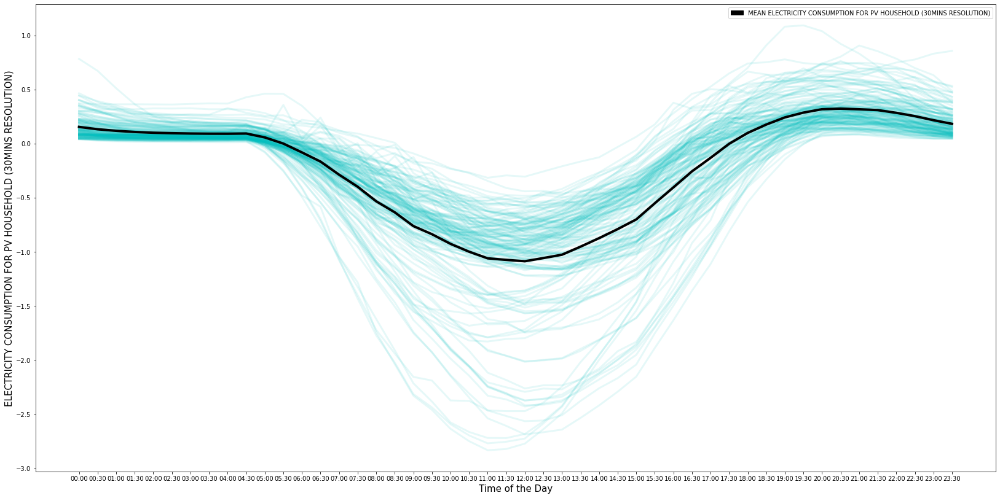

In [37]:
plt.figure(num = 2, figsize = (28, 14))
plt.plot(Hourly_PV_30, color = 'c', alpha = 0.1, linewidth= '3')
plt.plot(Hourly_PV_30.mean(axis =1), color = 'k', alpha = 1, linewidth = '4')
plt.ylabel('ELECTRICITY CONSUMPTION FOR PV HOUSEHOLD (30MINS RESOLUTION)', fontsize = 15)
plt.xticks(Hourly_PV_30.index)
plt.xlabel('Time of the Day', fontsize= 15)
leg = mpatches.Patch(color= 'black', label= 'MEAN ELECTRICITY CONSUMPTION FOR PV HOUSEHOLD (30MINS RESOLUTION)')
plt.legend(handles= [leg])
plt.show()

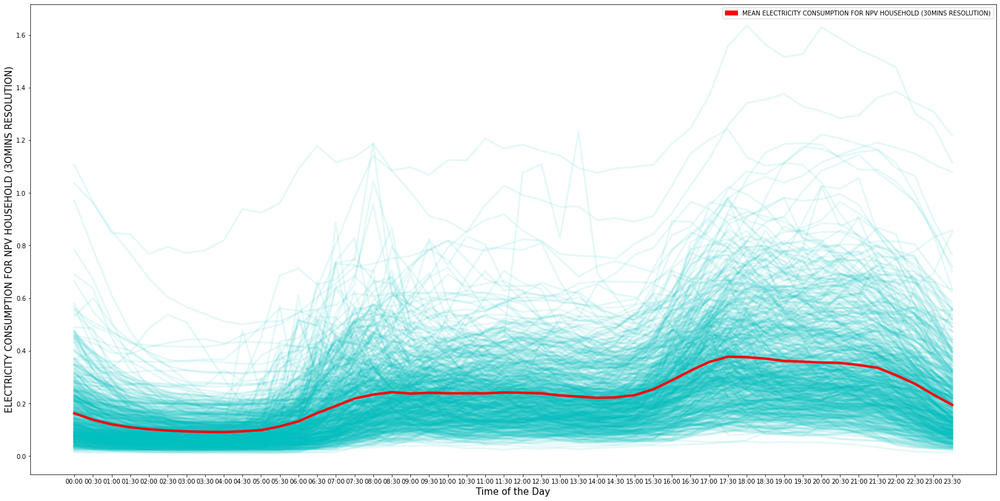

In [38]:
plt.figure(num = 2, figsize = (28, 14))
plt.plot(Hourly_NPV_30, color = 'c', alpha = 0.1, linewidth= '3')
plt.plot(Hourly_NPV_30.mean(axis =1), color = 'r', alpha = 1, linewidth = '4')
plt.ylabel('ELECTRICITY CONSUMPTION FOR NPV HOUSEHOLD (3OMINS RESOLUTION)', fontsize = 15)
plt.xticks(Hourly_NPV_30.index)
plt.xlabel('Time of the Day', fontsize= 15)
leg = mpatches.Patch(color= 'red', label= 'MEAN ELECTRICITY CONSUMPTION FOR NPV HOUSEHOLD (30MINS RESOLUTION)')
plt.legend(handles= [leg])
plt.show()

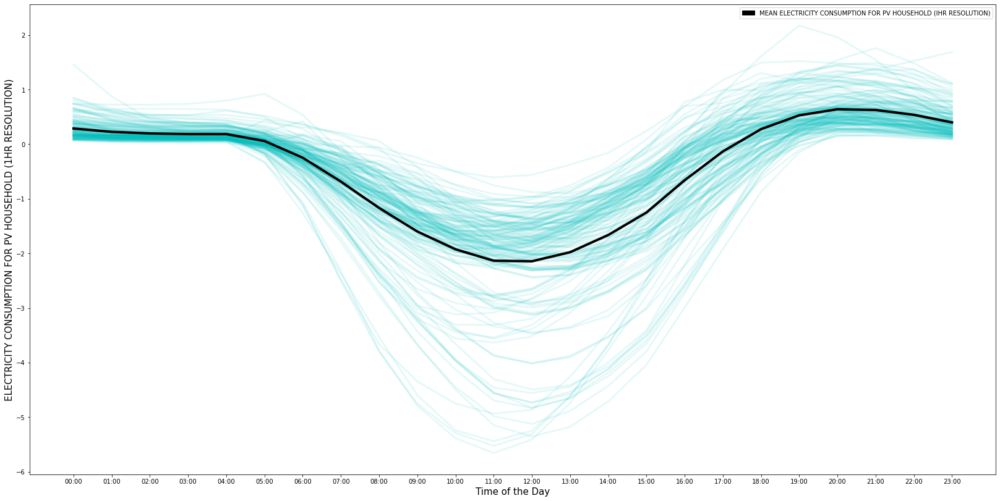

In [39]:
plt.figure(num = 2, figsize = (28, 14))
plt.plot(Hourly_PV_1, color = 'c', alpha = 0.1, linewidth= '3')
plt.plot(Hourly_PV_1.mean(axis =1), color = 'k', alpha = 1, linewidth = '4')
plt.ylabel('ELECTRICITY CONSUMPTION FOR PV HOUSEHOLD (1HR RESOLUTION)', fontsize = 15)
plt.xticks(Hourly_PV_1.index)
plt.xlabel('Time of the Day', fontsize= 15)
leg = mpatches.Patch(color= 'black', label= 'MEAN ELECTRICITY CONSUMPTION FOR PV HOUSEHOLD (IHR RESOLUTION)')
plt.legend(handles= [leg])
plt.show()

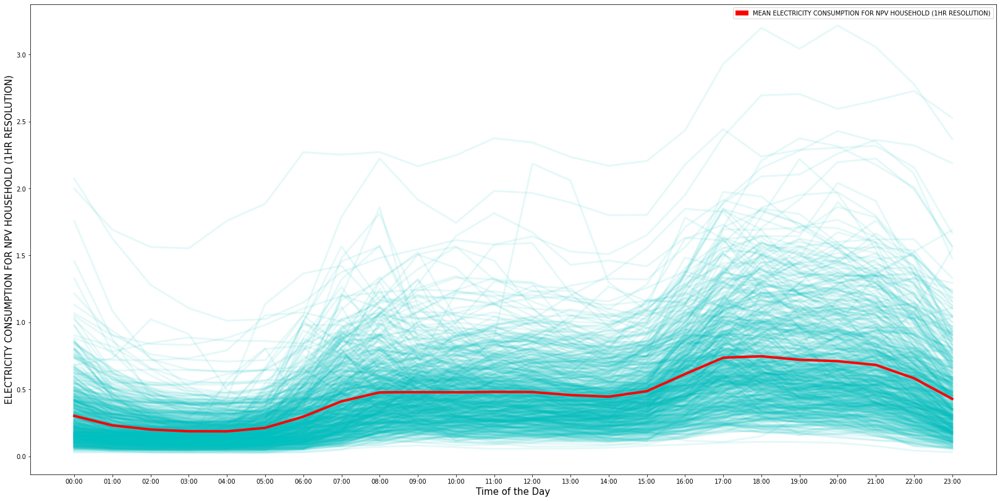

In [40]:
plt.figure(num = 2, figsize = (28, 14))
plt.plot(Hourly_NPV_1, color = 'c', alpha = 0.1, linewidth= '3')
plt.plot(Hourly_NPV_1.mean(axis =1), color = 'r', alpha = 1, linewidth = '4')
plt.ylabel('ELECTRICITY CONSUMPTION FOR NPV HOUSEHOLD (1HR RESOLUTION)', fontsize = 15)
plt.xticks(Hourly_NPV_1.index)
plt.xlabel('Time of the Day', fontsize= 15)
leg = mpatches.Patch(color= 'red', label= 'MEAN ELECTRICITY CONSUMPTION FOR NPV HOUSEHOLD (1HR RESOLUTION)')
plt.legend(handles= [leg])
plt.show()

In [41]:
PV['Month'] = PV['Timestamp'].dt.month

JJA = (PV.Month >= 6) & (PV.Month <= 8)
JJA_df = PV[JJA].reset_index(drop = True)
JJA_df = JJA_df.drop('Month', axis=1) 

SON = (PV.Month >= 9) & (PV.Month <= 11)
SON_df = PV[SON].reset_index(drop = True)
SON_df = SON_df.drop('Month', axis=1)

DJF = (PV.Month <= 2) | (PV.Month== 12)
DJF_df = PV[DJF].reset_index(drop = True)
DJF_df = DJF_df.drop('Month', axis=1)

MAM = (PV.Month >= 3) & (PV.Month <= 5)
MAM_df = PV[MAM].reset_index(drop = True)
MAM_df = MAM_df.drop('Month', axis=1)

print(len(JJA_df))
print(len(SON_df))
print(len(DJF_df))
print(len(MAM_df))

len(JJA_df)+len(SON_df)+len(DJF_df)+len(MAM_df) == len(PV)

4416
4368
4320
4416


True

In [42]:
JJA_df

,0,1,2,3,4,5,6,7,8,9,...,145,146,147,148,149,150,151,152,153,Timestamp
0,0.04191,0.0742,0.0431,0.0771,0.1411,0.0911,0.0541,0.178,0.073,0.1742,...,0.0131,0.0621,0.0751,0.0576,0.05814,0.13116,0.07301,0.10114,0.0567,2008-07-01 00:00:00
1,0.04991,0.0742,0.0431,0.0661,0.0461,0.0991,0.0271,0.135,0.072,0.2832,...,0.0131,0.0891,0.0551,0.0516,0.05614,0.11516,0.07601,0.10214,0.0442,2008-07-01 00:30:00
2,0.07241,0.0657,0.0401,0.0811,0.0471,0.0591,0.0191,0.149,0.073,0.2442,...,0.0671,0.0661,0.0271,0.0611,0.03614,0.15616,0.07201,0.11914,0.0517,2008-07-01 01:00:00
3,0.04791,0.0617,0.0501,0.0751,0.0401,0.0871,0.0291,0.083,0.074,0.2042,...,0.0341,0.0661,0.0221,0.0421,0.02614,0.13016,0.10001,0.14114,0.0367,2008-07-01 01:30:00
4,0.04741,0.0762,0.0421,0.0881,0.0381,0.0551,0.0821,0.028,0.075,0.2382,...,0.0131,0.0741,0.0381,0.0546,0.07414,0.11016,0.10401,0.10414,0.0452,2008-07-01 02:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4411,0.12991,0.0452,0.1021,0.1601,0.3311,0.1531,0.2061,0.073,0.068,0.3192,...,0.0901,0.2511,0.4351,0.2771,0.30314,0.29516,0.16501,0.05814,0.1572,2009-06-30 21:30:00
4412,0.13091,0.0672,0.1001,0.1911,0.1681,0.1061,0.1591,0.110,0.074,0.3592,...,0.0591,0.2281,0.2701,0.1551,0.30814,0.29516,0.17201,0.05814,0.4342,2009-06-30 22:00:00
4413,0.09091,0.0462,0.0831,0.1041,0.1351,0.0801,0.0701,0.109,0.085,0.4172,...,0.0111,0.1731,0.1911,0.1651,0.24114,0.28316,0.16801,0.05914,0.0982,2009-06-30 22:30:00
4414,0.03491,0.0552,0.0681,0.0991,0.1581,0.0781,0.0101,0.061,0.083,0.4192,...,0.0121,0.1171,0.1461,0.1271,0.19114,0.17816,0.16301,0.09114,0.0852,2009-06-30 23:00:00


CREATING DATAFRAME FOR WEEKENDS AND WEEKDAYS FOR THE FOUR SEASONS

In [43]:
JJA_df['WEEKDAY'] = JJA_df['Timestamp'].dt.dayofweek
JJA_df['WEEKEND'] = np.where(JJA_df.Timestamp.dt.dayofweek.isin([5,6]), 1, 0)

In [44]:
JJA_df_WEEKDAY = JJA_df[JJA_df['WEEKEND'] != 1]
JJA_df_WEEKEND = JJA_df[JJA_df['WEEKEND'] == 1]

In [45]:
JJA_df_WEEKDAY

,0,1,2,3,4,5,6,7,8,9,...,147,148,149,150,151,152,153,Timestamp,WEEKDAY,WEEKEND
0,0.04191,0.0742,0.0431,0.0771,0.1411,0.0911,0.0541,0.178,0.073,0.1742,...,0.0751,0.0576,0.05814,0.13116,0.07301,0.10114,0.0567,2008-07-01 00:00:00,1,0
1,0.04991,0.0742,0.0431,0.0661,0.0461,0.0991,0.0271,0.135,0.072,0.2832,...,0.0551,0.0516,0.05614,0.11516,0.07601,0.10214,0.0442,2008-07-01 00:30:00,1,0
2,0.07241,0.0657,0.0401,0.0811,0.0471,0.0591,0.0191,0.149,0.073,0.2442,...,0.0271,0.0611,0.03614,0.15616,0.07201,0.11914,0.0517,2008-07-01 01:00:00,1,0
3,0.04791,0.0617,0.0501,0.0751,0.0401,0.0871,0.0291,0.083,0.074,0.2042,...,0.0221,0.0421,0.02614,0.13016,0.10001,0.14114,0.0367,2008-07-01 01:30:00,1,0
4,0.04741,0.0762,0.0421,0.0881,0.0381,0.0551,0.0821,0.028,0.075,0.2382,...,0.0381,0.0546,0.07414,0.11016,0.10401,0.10414,0.0452,2008-07-01 02:00:00,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4411,0.12991,0.0452,0.1021,0.1601,0.3311,0.1531,0.2061,0.073,0.068,0.3192,...,0.4351,0.2771,0.30314,0.29516,0.16501,0.05814,0.1572,2009-06-30 21:30:00,1,0
4412,0.13091,0.0672,0.1001,0.1911,0.1681,0.1061,0.1591,0.110,0.074,0.3592,...,0.2701,0.1551,0.30814,0.29516,0.17201,0.05814,0.4342,2009-06-30 22:00:00,1,0
4413,0.09091,0.0462,0.0831,0.1041,0.1351,0.0801,0.0701,0.109,0.085,0.4172,...,0.1911,0.1651,0.24114,0.28316,0.16801,0.05914,0.0982,2009-06-30 22:30:00,1,0
4414,0.03491,0.0552,0.0681,0.0991,0.1581,0.0781,0.0101,0.061,0.083,0.4192,...,0.1461,0.1271,0.19114,0.17816,0.16301,0.09114,0.0852,2009-06-30 23:00:00,1,0


In [46]:
JJA_df_WEEKEND

,0,1,2,3,4,5,6,7,8,9,...,147,148,149,150,151,152,153,Timestamp,WEEKDAY,WEEKEND
192,0.09891,0.0482,0.0511,0.0551,0.0691,0.0921,0.0601,0.064,0.076,0.3872,...,0.0181,0.0701,0.05814,0.26316,0.05501,0.06814,0.1192,2008-07-05 00:00:00,5,1
193,0.06091,0.0782,0.0501,0.1101,0.0681,0.1001,0.0531,0.063,0.077,0.2892,...,0.0281,0.0381,0.05514,0.26116,0.09001,0.08814,0.0872,2008-07-05 00:30:00,5,1
194,0.05791,0.0592,0.0441,0.1391,0.0681,0.0711,0.0391,0.027,0.076,0.2082,...,0.0381,0.0711,0.01514,0.25416,0.24001,0.10714,0.0622,2008-07-05 01:00:00,5,1
195,0.05891,0.0652,0.0461,0.1041,0.0671,0.0841,0.0131,0.065,0.077,0.1142,...,0.0171,0.0401,0.05814,0.19316,0.89101,0.07514,0.0452,2008-07-05 01:30:00,5,1
196,0.03691,0.0692,0.0531,0.1161,0.0681,0.0571,0.0141,0.027,0.076,0.1342,...,0.0421,0.0411,0.07314,0.14116,0.13801,0.07014,0.0692,2008-07-05 02:00:00,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4315,0.25691,0.0682,0.1121,0.3151,0.1721,0.1031,0.2131,0.062,0.066,0.2552,...,0.5161,0.1511,0.18614,0.11816,0.32101,0.12814,0.0992,2009-06-28 21:30:00,6,1
4316,0.13391,0.0522,0.0931,0.2051,0.2011,0.0801,0.1681,0.284,0.068,0.5012,...,0.8281,0.2011,0.16714,0.12116,1.07701,0.13114,0.1022,2009-06-28 22:00:00,6,1
4317,0.04691,0.0772,0.1001,0.1041,0.1701,0.0811,0.0191,0.301,0.074,0.4232,...,0.9171,0.0991,0.12114,0.11616,0.64401,0.11414,0.0662,2009-06-28 22:30:00,6,1
4318,0.07691,0.0462,0.1131,0.1071,0.1501,0.0801,0.0101,0.123,0.075,0.3132,...,0.2851,0.0861,0.12214,0.09216,1.12101,0.09714,0.0872,2009-06-28 23:00:00,6,1


In [47]:
SON_df['WEEKDAY'] = SON_df['Timestamp'].dt.dayofweek
SON_df['WEEKEND'] = np.where(SON_df.Timestamp.dt.dayofweek.isin([5,6]), 1, 0)

In [48]:
SON_df_WEEKDAY = SON_df[SON_df['WEEKEND'] != 1]
SON_df_WEEKEND = SON_df[SON_df['WEEKEND'] == 1]

In [49]:
SON_df_WEEKDAY

,0,1,2,3,4,5,6,7,8,9,...,147,148,149,150,151,152,153,Timestamp,WEEKDAY,WEEKEND
0,0.07591,0.0622,0.0461,0.0796,0.1771,0.0721,0.0491,0.1095,0.0545,0.2837,...,0.1111,0.0811,0.10464,0.13566,0.21351,0.10914,0.0712,2008-09-01 00:00:00,0,0
1,0.03491,0.0522,0.0421,0.1461,0.0621,0.0431,0.0501,0.0600,0.0730,0.1712,...,0.1221,0.0641,0.01914,0.17516,0.08101,0.11314,0.0382,2008-09-01 00:30:00,0,0
2,0.07191,0.0442,0.0501,0.1381,0.0621,0.0841,0.0491,0.0520,0.0740,0.1832,...,0.1231,0.0481,0.06614,0.16316,0.10601,0.11414,0.0612,2008-09-01 01:00:00,0,0
3,0.04691,0.0732,0.0521,0.0851,0.0611,0.0911,0.0491,0.0450,0.0730,0.2602,...,0.1301,0.0261,0.07114,0.14216,0.07401,0.11314,0.0322,2008-09-01 01:30:00,0,0
4,0.04091,0.0432,0.0511,0.0581,0.0611,0.0741,0.0541,0.0430,0.0770,0.1182,...,0.1111,0.0711,0.04414,0.13916,0.08301,0.11414,0.0662,2008-09-01 02:00:00,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4267,0.08491,0.1322,0.2191,0.1721,0.3311,0.3061,0.2221,0.0580,0.0710,1.4462,...,0.0761,0.4011,0.21514,0.32516,0.25601,0.08914,0.0002,2008-11-28 21:30:00,4,0
4268,0.11591,0.1252,0.3031,0.1781,0.2131,0.1831,0.2171,0.0820,0.0620,1.2682,...,0.1471,0.1541,0.22414,0.35816,0.29501,0.09614,0.0002,2008-11-28 22:00:00,4,0
4269,0.10491,0.1092,0.2031,0.2691,0.1801,0.0851,0.1771,0.0980,0.0630,0.5102,...,1.1681,0.2291,0.33314,0.26616,0.41601,0.15514,0.0002,2008-11-28 22:30:00,4,0
4270,0.08691,0.1172,0.2771,0.2281,0.1861,0.0311,0.0491,0.0880,0.0730,0.9882,...,0.6271,0.1551,0.21414,0.23816,0.31201,0.12914,0.0002,2008-11-28 23:00:00,4,0


In [50]:
SON_df_WEEKEND

,0,1,2,3,4,5,6,7,8,9,...,147,148,149,150,151,152,153,Timestamp,WEEKDAY,WEEKEND
240,0.12791,0.2732,0.0471,0.0781,0.1111,0.0521,0.0421,0.0270,0.0710,0.4452,...,0.0841,0.0381,0.12014,0.15516,0.11501,0.11314,0.0502,2008-09-06 00:00:00,5,1
241,0.10391,0.0787,0.0426,0.0756,0.1331,0.0821,0.0491,0.0595,0.0555,0.3322,...,0.1116,0.0726,0.13464,0.21916,0.17051,0.09664,0.0702,2008-09-06 00:30:00,5,1
242,0.09791,0.0682,0.0441,0.0746,0.1071,0.0701,0.0436,0.0425,0.0555,0.3132,...,0.1106,0.0501,0.07914,0.22016,0.20201,0.08064,0.0647,2008-09-06 01:00:00,5,1
243,0.10491,0.0557,0.0436,0.0766,0.0921,0.1246,0.0496,0.0540,0.0555,0.2777,...,0.1196,0.0516,0.06914,0.23516,0.19801,0.07964,0.0417,2008-09-06 01:30:00,5,1
244,0.10741,0.0697,0.0461,0.0731,0.0646,0.0741,0.0481,0.0535,0.0560,0.2597,...,0.1161,0.0431,0.05514,0.21216,0.19251,0.08164,0.0527,2008-09-06 02:00:00,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4363,0.10591,0.2082,0.6721,0.1741,0.2061,0.2701,0.2091,0.3670,0.0920,0.4772,...,0.0361,0.2061,0.72814,0.49716,0.25701,0.14314,0.0682,2008-11-30 21:30:00,6,1
4364,0.08791,0.1652,0.6831,0.2011,0.2111,0.1811,0.2141,0.3270,0.0800,0.4342,...,0.0321,0.1701,0.82814,0.16816,0.36901,0.14314,0.0692,2008-11-30 22:00:00,6,1
4365,0.20091,0.1382,0.6981,0.2551,0.2041,0.0901,0.1521,0.3440,0.0610,0.4602,...,0.0311,0.2801,0.99614,0.17916,0.56901,0.13014,0.0692,2008-11-30 22:30:00,6,1
4366,0.26791,0.1092,0.9781,0.2101,0.2091,0.0531,0.0501,0.2300,0.0700,0.6112,...,0.3151,0.0941,0.90614,0.17216,0.30301,0.13014,0.0702,2008-11-30 23:00:00,6,1


In [51]:
DJF_df['WEEKDAY'] = DJF_df['Timestamp'].dt.dayofweek
DJF_df['WEEKEND'] = np.where(DJF_df.Timestamp.dt.dayofweek.isin([5,6]), 1, 0)

In [52]:
DJF_df_WEEKDAY = DJF_df[DJF_df['WEEKEND'] != 1]
DJF_df_WEEKEND = DJF_df[DJF_df['WEEKEND'] == 1]

In [53]:
DJF_df_WEEKDAY

,0,1,2,3,4,5,6,7,8,9,...,147,148,149,150,151,152,153,Timestamp,WEEKDAY,WEEKEND
0,0.27491,0.0482,0.5991,0.1011,0.1921,0.0761,0.0431,0.187,0.075,0.3702,...,0.8371,0.0631,0.18814,0.17716,0.32201,0.13914,0.0252,2008-12-01 00:00:00,0,0
1,0.18791,0.0472,0.0521,0.0971,0.2111,0.0901,0.0391,0.185,0.055,0.9522,...,0.4151,0.0571,0.16614,0.14816,0.13801,0.12614,0.0002,2008-12-01 00:30:00,0,0
2,0.13091,0.0582,0.0281,0.0521,0.1311,0.0491,0.0381,0.035,0.066,0.7742,...,0.2321,0.0331,0.12114,0.10316,0.12601,0.08614,0.0002,2008-12-01 01:00:00,0,0
3,0.09391,0.0852,0.0411,0.0791,0.0601,0.0661,0.0451,0.026,0.076,0.4452,...,0.1481,0.0481,0.03114,0.08316,0.07501,0.07114,0.0772,2008-12-01 01:30:00,0,0
4,0.09391,0.0502,0.0371,0.0571,0.0611,0.0371,0.0481,0.044,0.070,0.2252,...,0.1451,0.0411,0.07914,0.08116,0.09301,0.07214,0.0762,2008-12-01 02:00:00,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4267,0.11391,0.0882,0.2421,0.0911,0.1891,0.2021,0.1801,0.227,0.086,0.5822,...,0.9221,0.3181,0.21414,0.21316,0.00001,0.13114,0.6032,2009-02-27 21:30:00,4,0
4268,0.12991,0.0932,0.3641,0.1081,0.2021,0.1871,0.1821,0.255,0.068,0.5382,...,0.5621,0.1931,0.22614,0.22716,0.00201,0.11914,0.2582,2009-02-27 22:00:00,4,0
4269,0.09591,0.0762,0.2601,0.0941,0.2361,0.0941,0.2051,0.284,0.073,0.4772,...,0.1801,0.1741,0.26714,0.21516,0.00001,0.15514,0.3142,2009-02-27 22:30:00,4,0
4270,0.08591,0.0822,0.2891,0.3921,0.5151,0.0931,0.0891,0.151,0.074,0.4412,...,0.2741,0.1691,0.18614,0.20216,0.00201,0.17514,0.2282,2009-02-27 23:00:00,4,0


In [54]:
DJF_df_WEEKEND

,0,1,2,3,4,5,6,7,8,9,...,147,148,149,150,151,152,153,Timestamp,WEEKDAY,WEEKEND
240,0.13991,0.0502,0.1081,0.0821,0.1811,0.0951,0.0431,0.160,0.064,0.4092,...,0.2521,0.1551,0.26714,0.20816,0.21101,0.19514,0.0252,2008-12-06 00:00:00,5,1
241,0.12091,0.0502,0.0421,0.0641,0.1351,0.1231,0.0371,0.116,0.071,0.3282,...,0.1731,0.1301,0.17514,0.11216,0.11701,0.16814,0.0002,2008-12-06 00:30:00,5,1
242,0.09091,0.0762,0.0441,0.1321,0.1171,0.0881,0.0371,0.092,0.072,0.2572,...,0.1431,0.0461,0.17514,0.18016,0.13601,0.07814,0.0002,2008-12-06 01:00:00,5,1
243,0.09191,0.0462,0.0301,0.1361,0.1071,0.0921,0.0471,0.084,0.072,0.2782,...,0.1281,0.0431,0.05914,0.37616,0.10601,0.07114,0.0772,2008-12-06 01:30:00,5,1
244,0.13491,0.0462,0.0491,0.0841,0.1081,0.0791,0.0481,0.162,0.057,0.1922,...,0.0951,0.0411,0.07414,0.37016,0.11601,0.07214,0.0752,2008-12-06 02:00:00,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4315,0.25591,0.1052,0.1601,0.1931,0.2401,0.2681,0.1751,0.122,0.107,0.5302,...,0.2661,0.2261,0.25414,0.35116,0.00001,0.11514,0.2732,2009-02-28 21:30:00,5,1
4316,0.29691,0.0732,0.2281,0.3651,0.2031,0.2241,0.1721,0.086,0.103,0.4832,...,0.1231,0.1671,0.36414,0.34516,0.00201,0.12914,0.2572,2009-02-28 22:00:00,5,1
4317,0.16891,0.0812,0.1421,0.2291,0.1981,0.2161,0.1661,0.245,0.093,0.4542,...,0.1521,0.1941,0.28914,0.32216,0.00001,0.14514,0.2152,2009-02-28 22:30:00,5,1
4318,0.12891,0.1032,0.1601,0.2371,0.1771,0.2651,0.0891,0.132,0.071,0.3162,...,0.2121,0.1811,0.27114,0.26016,0.00101,0.13214,0.1612,2009-02-28 23:00:00,5,1


In [55]:
MAM_df['WEEKDAY'] = MAM_df['Timestamp'].dt.dayofweek
MAM_df['WEEKEND'] = np.where(MAM_df.Timestamp.dt.dayofweek.isin([5,6]), 1, 0)

In [56]:
MAM_df_WEEKDAY = MAM_df[MAM_df['WEEKEND'] != 1]
MAM_df_WEEKEND = MAM_df[MAM_df['WEEKEND'] == 1]

In [57]:
MAM_df_WEEKDAY

,0,1,2,3,4,5,6,7,8,9,...,147,148,149,150,151,152,153,Timestamp,WEEKDAY,WEEKEND
48,0.11391,0.0552,0.0651,0.0871,0.1901,0.0771,0.0491,0.158,0.064,0.3212,...,0.1491,0.1821,0.09514,0.16116,0.00201,0.10014,0.1572,2009-03-02 00:00:00,0,0
49,0.08691,0.0562,0.0361,0.0641,0.2151,0.0831,0.0491,0.193,0.074,0.1712,...,0.1451,0.1341,0.08114,0.10916,0.00101,0.10114,0.1272,2009-03-02 00:30:00,0,0
50,0.08591,0.0702,0.0321,0.0671,0.0791,0.0831,0.0491,0.076,0.074,0.1092,...,0.1491,0.1141,0.08414,0.09116,0.00101,0.07414,0.1302,2009-03-02 01:00:00,0,0
51,0.09591,0.0622,0.0331,0.0871,0.0351,0.0471,0.0491,0.027,0.075,0.1862,...,0.1281,0.1141,0.06014,0.10216,0.00201,0.07114,0.1162,2009-03-02 01:30:00,0,0
52,0.13191,0.0462,0.0311,0.0561,0.0381,0.0671,0.0491,0.045,0.073,0.1532,...,0.1311,0.0361,0.06014,0.09216,0.00001,0.07114,0.0302,2009-03-02 02:00:00,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4315,0.20991,0.2862,0.0951,0.1441,0.1771,0.1381,0.2221,0.113,0.067,0.4622,...,0.2441,0.1221,0.35114,0.19616,0.74301,0.12814,0.1962,2009-05-29 21:30:00,4,0
4316,0.19491,0.1352,0.0901,0.2061,0.1871,0.0961,0.1401,0.255,0.082,0.5152,...,0.1291,0.1181,0.23214,0.28516,0.25101,0.17714,0.5802,2009-05-29 22:00:00,4,0
4317,0.15491,0.0632,0.0991,0.0781,0.2301,0.0771,0.0621,0.206,0.084,0.6152,...,0.1451,0.1431,0.20014,0.25516,0.13201,0.14314,0.1142,2009-05-29 22:30:00,4,0
4318,0.05191,0.0862,0.0471,0.1001,0.1651,0.0771,0.0511,0.141,0.084,0.5062,...,0.0941,0.1181,0.16514,0.29616,0.12301,0.10614,0.1582,2009-05-29 23:00:00,4,0


In [58]:
MAM_df_WEEKEND

,0,1,2,3,4,5,6,7,8,9,...,147,148,149,150,151,152,153,Timestamp,WEEKDAY,WEEKEND
0,0.08691,0.0422,0.2931,0.0631,0.1961,0.1181,0.0481,0.098,0.091,0.3672,...,0.1651,0.1451,0.08814,0.31816,0.00201,0.07114,0.2012,2009-03-01 00:00:00,6,1
1,0.08691,0.0502,0.0551,0.0801,0.1901,0.0851,0.0481,0.081,0.083,0.1862,...,0.2051,0.1421,0.07314,0.29816,0.00001,0.07214,0.1772,2009-03-01 00:30:00,6,1
2,0.10891,0.0722,0.0781,0.1401,0.1301,0.0851,0.0481,0.145,0.084,0.3352,...,0.2071,0.1181,0.03914,0.26516,0.00101,0.07114,0.1782,2009-03-01 01:00:00,6,1
3,0.12891,0.0472,0.0751,0.0841,0.0941,0.0791,0.0561,0.025,0.068,0.2152,...,0.1641,0.0941,0.04014,0.24116,0.00201,0.08514,0.1742,2009-03-01 01:30:00,6,1
4,0.12791,0.0482,0.0381,0.0971,0.0251,0.0401,0.0521,0.056,0.074,0.1472,...,0.1951,0.0431,0.06514,0.26516,0.00001,0.09214,0.1552,2009-03-01 02:00:00,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4411,0.04491,0.1482,0.1151,0.1541,0.2341,0.1651,0.1921,0.056,0.083,0.4912,...,0.0001,0.1201,0.16214,0.14916,0.16401,0.13514,0.1212,2009-05-31 21:30:00,6,1
4412,0.03391,0.0732,0.2331,0.1191,0.2161,0.1311,0.1751,0.120,0.078,0.6552,...,0.0291,0.1351,0.13014,0.39816,0.09801,0.15514,0.0872,2009-05-31 22:00:00,6,1
4413,0.03491,0.0792,0.0841,0.1331,0.1481,0.0941,0.0531,0.110,0.070,0.3802,...,0.0791,0.1321,0.13814,0.19816,0.24701,0.13114,0.0862,2009-05-31 22:30:00,6,1
4414,0.07891,0.0532,0.0741,0.1201,0.0381,0.0941,0.0751,0.108,0.068,0.4992,...,0.1061,0.0721,0.16114,0.20516,0.29201,0.05014,0.0552,2009-05-31 23:00:00,6,1


In [59]:
NPV['Month'] = NPV['Timestamp'].dt.month

NJJA = (NPV.Month >= 6) & (NPV.Month <= 8)
NJJA_df = NPV[NJJA].reset_index(drop = True)
NJJA_df = NJJA_df.drop('Month', axis=1) 

NSON = (NPV.Month >= 9) & (NPV.Month <= 11)
NSON_df = NPV[NSON].reset_index(drop = True)
NSON_df = NSON_df.drop('Month', axis=1)

NDJF = (NPV.Month <= 2) | (NPV.Month== 12)
NDJF_df = NPV[NDJF].reset_index(drop = True)
NDJF_df = NDJF_df.drop('Month', axis=1)

NMAM = (NPV.Month >= 3) & (NPV.Month <= 5)
NMAM_df = NPV[MAM].reset_index(drop = True)
NMAM_df = NMAM_df.drop('Month', axis=1)

print(len(NJJA_df))
print(len(NSON_df))
print(len(NDJF_df))
print(len(NMAM_df))

len(NJJA_df)+len(NSON_df)+len(NDJF_df)+len(NMAM_df) == len(NPV)

4416
4368
4320
4416


True

In [60]:
NJJA_df

,0,1,2,3,4,5,6,7,8,9,...,605,606,607,608,609,610,611,612,613,Timestamp
0,0.0410,0.0740,0.039,0.073,0.137,0.091,0.050,0.171,0.066,0.174,...,0.162,0.1930,0.155,0.117,0.103,0.129,0.110,0.454,0.150,2008-07-01 00:00:00
1,0.0490,0.0740,0.039,0.062,0.042,0.099,0.023,0.128,0.065,0.283,...,0.185,0.1395,0.180,0.116,0.067,0.137,0.060,0.196,0.116,2008-07-01 00:30:00
2,0.0715,0.0655,0.036,0.077,0.043,0.059,0.015,0.142,0.066,0.244,...,0.206,0.1155,0.154,0.126,0.094,0.110,0.087,0.087,0.130,2008-07-01 01:00:00
3,0.0470,0.0615,0.046,0.071,0.036,0.087,0.025,0.076,0.067,0.204,...,0.147,0.1220,0.152,0.087,0.083,0.110,0.072,0.068,0.095,2008-07-01 01:30:00
4,0.0465,0.0760,0.038,0.084,0.034,0.055,0.078,0.021,0.068,0.238,...,0.205,0.1060,0.104,0.100,0.076,0.112,0.073,0.018,0.018,2008-07-01 02:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4411,0.1290,0.0450,0.098,0.156,0.327,0.153,0.202,0.066,0.061,0.319,...,0.195,0.2020,0.175,0.314,0.101,0.640,0.770,0.213,0.286,2009-06-30 21:30:00
4412,0.1300,0.0670,0.096,0.187,0.164,0.106,0.155,0.103,0.067,0.359,...,0.222,0.2520,0.112,0.256,0.123,0.251,0.294,0.258,0.145,2009-06-30 22:00:00
4413,0.0900,0.0460,0.079,0.100,0.131,0.080,0.066,0.102,0.078,0.417,...,0.206,0.4170,0.127,0.247,0.048,0.184,0.085,0.266,0.305,2009-06-30 22:30:00
4414,0.0340,0.0550,0.064,0.095,0.154,0.078,0.006,0.054,0.076,0.419,...,0.227,0.3930,0.049,0.170,0.061,0.182,0.105,0.401,0.414,2009-06-30 23:00:00


In [61]:
NJJA_df['WEEKDAY'] =NJJA_df['Timestamp'].dt.dayofweek
NJJA_df['WEEKEND'] = np.where(NJJA_df.Timestamp.dt.dayofweek.isin([5,6]), 1, 0)

In [62]:
NJJA_df_WEEKDAY = NJJA_df[MAM_df['WEEKEND'] != 1]
NJJA_df_WEEKEND = NJJA_df[MAM_df['WEEKEND'] == 1]

In [63]:
NJJA_df_WEEKDAY

,0,1,2,3,4,5,6,7,8,9,...,607,608,609,610,611,612,613,Timestamp,WEEKDAY,WEEKEND
48,0.0665,0.0655,0.046,0.089,0.217,0.094,0.044,0.096,0.067,0.138,...,0.181,0.231,0.088,0.091,0.092,0.136,0.122,2008-07-02 00:00:00,2,0
49,0.0510,0.0635,0.031,0.068,0.025,0.103,0.043,0.124,0.068,0.141,...,0.153,0.132,0.087,0.085,0.097,0.127,0.159,2008-07-02 00:30:00,2,0
50,0.0565,0.0635,0.042,0.070,0.025,0.061,0.010,0.107,0.067,0.105,...,0.137,0.122,0.087,0.100,0.133,0.133,0.122,2008-07-02 01:00:00,2,0
51,0.0665,0.0595,0.047,0.084,0.057,0.093,0.010,0.096,0.069,0.177,...,0.097,0.110,0.076,0.085,0.102,0.119,0.048,2008-07-02 01:30:00,2,0
52,0.0510,0.0640,0.038,0.070,0.044,0.058,0.078,0.137,0.067,0.224,...,0.126,0.078,0.097,0.086,0.074,0.134,0.049,2008-07-02 02:00:00,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4315,0.2560,0.0680,0.108,0.311,0.168,0.103,0.209,0.055,0.059,0.255,...,0.071,0.342,0.128,0.275,1.126,0.439,0.425,2009-06-28 21:30:00,6,1
4316,0.1330,0.0520,0.089,0.201,0.197,0.080,0.164,0.277,0.061,0.501,...,0.069,0.392,0.100,0.338,0.225,0.102,0.363,2009-06-28 22:00:00,6,1
4317,0.0460,0.0770,0.096,0.100,0.166,0.081,0.015,0.294,0.067,0.423,...,0.082,0.295,0.035,0.374,0.120,0.095,0.308,2009-06-28 22:30:00,6,1
4318,0.0760,0.0460,0.109,0.103,0.146,0.080,0.006,0.116,0.068,0.313,...,0.051,0.303,0.047,0.256,0.065,0.102,0.365,2009-06-28 23:00:00,6,1


In [64]:
NJJA_df_WEEKEND

,0,1,2,3,4,5,6,7,8,9,...,607,608,609,610,611,612,613,Timestamp,WEEKDAY,WEEKEND
0,0.0410,0.0740,0.039,0.073,0.137,0.091,0.050,0.171,0.066,0.174,...,0.155,0.117,0.103,0.129,0.110,0.454,0.150,2008-07-01 00:00:00,1,0
1,0.0490,0.0740,0.039,0.062,0.042,0.099,0.023,0.128,0.065,0.283,...,0.180,0.116,0.067,0.137,0.060,0.196,0.116,2008-07-01 00:30:00,1,0
2,0.0715,0.0655,0.036,0.077,0.043,0.059,0.015,0.142,0.066,0.244,...,0.154,0.126,0.094,0.110,0.087,0.087,0.130,2008-07-01 01:00:00,1,0
3,0.0470,0.0615,0.046,0.071,0.036,0.087,0.025,0.076,0.067,0.204,...,0.152,0.087,0.083,0.110,0.072,0.068,0.095,2008-07-01 01:30:00,1,0
4,0.0465,0.0760,0.038,0.084,0.034,0.055,0.078,0.021,0.068,0.238,...,0.104,0.100,0.076,0.112,0.073,0.018,0.018,2008-07-01 02:00:00,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4411,0.1290,0.0450,0.098,0.156,0.327,0.153,0.202,0.066,0.061,0.319,...,0.175,0.314,0.101,0.640,0.770,0.213,0.286,2009-06-30 21:30:00,1,0
4412,0.1300,0.0670,0.096,0.187,0.164,0.106,0.155,0.103,0.067,0.359,...,0.112,0.256,0.123,0.251,0.294,0.258,0.145,2009-06-30 22:00:00,1,0
4413,0.0900,0.0460,0.079,0.100,0.131,0.080,0.066,0.102,0.078,0.417,...,0.127,0.247,0.048,0.184,0.085,0.266,0.305,2009-06-30 22:30:00,1,0
4414,0.0340,0.0550,0.064,0.095,0.154,0.078,0.006,0.054,0.076,0.419,...,0.049,0.170,0.061,0.182,0.105,0.401,0.414,2009-06-30 23:00:00,1,0


In [65]:
NSON_df['WEEKDAY']= NSON_df['Timestamp'].dt.dayofweek
NSON_df['WEEKEND'] = np.where(NSON_df.Timestamp.dt.dayofweek.isin([5,6]), 1, 0)

In [66]:
NSON_df_WEEKDAY = NSON_df[SON_df['WEEKEND'] != 1]
NSON_df_WEEKEND = NSON_df[SON_df['WEEKEND'] == 1]

In [67]:
NSON_df_WEEKDAY

,0,1,2,3,4,5,6,7,8,9,...,607,608,609,610,611,612,613,Timestamp,WEEKDAY,WEEKEND
0,0.075,0.062,0.042,0.0755,0.173,0.072,0.045,0.1025,0.0475,0.2835,...,0.066,0.146,0.088,0.1485,0.090,0.1355,0.153,2008-09-01 00:00:00,0,0
1,0.034,0.052,0.038,0.1420,0.058,0.043,0.046,0.0530,0.0660,0.1710,...,0.075,0.107,0.088,0.2190,0.077,0.1130,0.160,2008-09-01 00:30:00,0,0
2,0.071,0.044,0.046,0.1340,0.058,0.084,0.045,0.0450,0.0670,0.1830,...,0.074,0.094,0.071,0.2010,0.076,0.1270,0.111,2008-09-01 01:00:00,0,0
3,0.046,0.073,0.048,0.0810,0.057,0.091,0.045,0.0380,0.0660,0.2600,...,0.121,0.120,0.097,0.3250,0.154,0.1280,0.107,2008-09-01 01:30:00,0,0
4,0.040,0.043,0.047,0.0540,0.057,0.074,0.050,0.0360,0.0700,0.1180,...,0.043,0.134,0.059,0.1710,0.101,0.1280,0.056,2008-09-01 02:00:00,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4267,0.084,0.132,0.215,0.1680,0.327,0.306,0.218,0.0510,0.0640,1.4460,...,0.259,0.931,0.179,0.7060,1.741,0.4710,0.281,2008-11-28 21:30:00,4,0
4268,0.115,0.125,0.299,0.1740,0.209,0.183,0.213,0.0750,0.0550,1.2680,...,0.287,0.454,0.205,1.7240,1.997,0.4800,0.756,2008-11-28 22:00:00,4,0
4269,0.104,0.109,0.199,0.2650,0.176,0.085,0.173,0.0910,0.0560,0.5100,...,0.386,0.407,0.255,1.1590,0.580,0.5280,1.032,2008-11-28 22:30:00,4,0
4270,0.086,0.117,0.273,0.2240,0.182,0.031,0.045,0.0810,0.0660,0.9880,...,0.720,0.280,0.182,0.8370,0.257,0.4400,0.499,2008-11-28 23:00:00,4,0


In [68]:
NSON_df_WEEKEND

,0,1,2,3,4,5,6,7,8,9,...,607,608,609,610,611,612,613,Timestamp,WEEKDAY,WEEKEND
240,0.1270,0.2730,0.0430,0.0740,0.1070,0.0520,0.0380,0.0200,0.0640,0.4450,...,0.0650,0.2530,0.1200,0.1140,0.1490,0.2420,0.1670,2008-09-06 00:00:00,5,1
241,0.1030,0.0785,0.0385,0.0715,0.1290,0.0820,0.0450,0.0525,0.0485,0.3320,...,0.1175,0.2215,0.0840,0.1975,0.1385,0.1605,0.1380,2008-09-06 00:30:00,5,1
242,0.0970,0.0680,0.0400,0.0705,0.1030,0.0700,0.0395,0.0355,0.0485,0.3130,...,0.0770,0.1795,0.0785,0.1895,0.1400,0.1545,0.1230,2008-09-06 01:00:00,5,1
243,0.1040,0.0555,0.0395,0.0725,0.0880,0.1245,0.0455,0.0470,0.0485,0.2775,...,0.0720,0.1500,0.0695,0.1660,0.1350,0.1425,0.0750,2008-09-06 01:30:00,5,1
244,0.1065,0.0695,0.0420,0.0690,0.0605,0.0740,0.0440,0.0465,0.0490,0.2595,...,0.0775,0.1175,0.0805,0.1695,0.1355,0.1285,0.0515,2008-09-06 02:00:00,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4363,0.1050,0.2080,0.6680,0.1700,0.2020,0.2700,0.2050,0.3600,0.0850,0.4770,...,0.1400,0.4410,0.2410,0.5030,0.3270,0.5530,0.3800,2008-11-30 21:30:00,6,1
4364,0.0870,0.1650,0.6790,0.1970,0.2070,0.1810,0.2100,0.3200,0.0730,0.4340,...,0.1060,0.4680,0.1740,0.3100,0.2190,0.4350,0.1480,2008-11-30 22:00:00,6,1
4365,0.2000,0.1380,0.6940,0.2510,0.2000,0.0900,0.1480,0.3370,0.0540,0.4600,...,0.0780,0.3930,0.1780,0.2430,0.1990,0.6790,0.2160,2008-11-30 22:30:00,6,1
4366,0.2670,0.1090,0.9740,0.2060,0.2050,0.0530,0.0460,0.2230,0.0630,0.6110,...,0.1260,0.3550,0.2370,0.1800,0.1500,0.8180,0.3510,2008-11-30 23:00:00,6,1


In [69]:
NDJF_df['WEEKDAY']= NDJF_df['Timestamp'].dt.dayofweek
NDJF_df['WEEKEND'] = np.where(NDJF_df.Timestamp.dt.dayofweek.isin([5,6]), 1, 0)

In [70]:
NDJF_df_WEEKDAY = NDJF_df[NDJF_df['WEEKEND'] != 1]
NDJF_df_WEEKEND = NDJF_df[NDJF_df['WEEKEND'] == 1]

In [71]:
NDJF_df_WEEKDAY

,0,1,2,3,4,5,6,7,8,9,...,607,608,609,610,611,612,613,Timestamp,WEEKDAY,WEEKEND
0,0.274,0.048,0.595,0.097,0.188,0.076,0.039,0.180,0.068,0.370,...,0.106,0.299,0.071,0.093,0.081,0.259,0.351,2008-12-01 00:00:00,0,0
1,0.187,0.047,0.048,0.093,0.207,0.090,0.035,0.178,0.048,0.952,...,0.083,0.125,0.091,0.072,0.073,0.120,0.106,2008-12-01 00:30:00,0,0
2,0.130,0.058,0.024,0.048,0.127,0.049,0.034,0.028,0.059,0.774,...,0.097,0.154,0.073,0.072,0.078,0.127,0.097,2008-12-01 01:00:00,0,0
3,0.093,0.085,0.037,0.075,0.056,0.066,0.041,0.019,0.069,0.445,...,0.081,0.178,0.090,0.073,0.083,0.133,0.040,2008-12-01 01:30:00,0,0
4,0.093,0.050,0.033,0.053,0.057,0.037,0.044,0.037,0.063,0.225,...,0.096,0.153,0.092,0.072,0.068,0.145,0.019,2008-12-01 02:00:00,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4267,0.113,0.088,0.238,0.087,0.185,0.202,0.176,0.220,0.079,0.582,...,0.138,0.361,0.128,0.538,0.413,0.489,0.382,2009-02-27 21:30:00,4,0
4268,0.129,0.093,0.360,0.104,0.198,0.187,0.178,0.248,0.061,0.538,...,0.070,0.354,0.129,0.501,0.539,0.401,0.372,2009-02-27 22:00:00,4,0
4269,0.095,0.076,0.256,0.090,0.232,0.094,0.201,0.277,0.066,0.477,...,0.079,0.337,0.165,0.449,0.423,0.298,0.491,2009-02-27 22:30:00,4,0
4270,0.085,0.082,0.285,0.388,0.511,0.093,0.085,0.144,0.067,0.441,...,0.085,0.319,0.117,0.297,0.481,0.294,0.442,2009-02-27 23:00:00,4,0


In [72]:
NDJF_df_WEEKEND

,0,1,2,3,4,5,6,7,8,9,...,607,608,609,610,611,612,613,Timestamp,WEEKDAY,WEEKEND
240,0.139,0.050,0.104,0.078,0.177,0.095,0.039,0.153,0.057,0.409,...,0.139,0.518,0.048,0.282,0.164,0.129,0.233,2008-12-06 00:00:00,5,1
241,0.120,0.050,0.038,0.060,0.131,0.123,0.033,0.109,0.064,0.328,...,0.106,0.894,0.090,0.181,0.155,0.119,0.156,2008-12-06 00:30:00,5,1
242,0.090,0.076,0.040,0.128,0.113,0.088,0.033,0.085,0.065,0.257,...,0.096,0.215,0.099,0.239,0.156,0.113,0.059,2008-12-06 01:00:00,5,1
243,0.091,0.046,0.026,0.132,0.103,0.092,0.043,0.077,0.065,0.278,...,0.043,0.150,0.067,0.079,0.154,0.126,0.037,2008-12-06 01:30:00,5,1
244,0.134,0.046,0.045,0.080,0.104,0.079,0.044,0.155,0.050,0.192,...,0.090,0.173,0.060,0.137,0.137,0.113,0.063,2008-12-06 02:00:00,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4315,0.255,0.105,0.156,0.189,0.236,0.268,0.171,0.115,0.100,0.530,...,0.283,0.227,0.129,1.347,0.141,0.149,0.396,2009-02-28 21:30:00,5,1
4316,0.296,0.073,0.224,0.361,0.199,0.224,0.168,0.079,0.096,0.483,...,0.480,0.214,0.205,0.777,0.173,0.195,0.317,2009-02-28 22:00:00,5,1
4317,0.168,0.081,0.138,0.225,0.194,0.216,0.162,0.238,0.086,0.454,...,0.333,0.188,0.182,0.368,0.136,0.202,0.458,2009-02-28 22:30:00,5,1
4318,0.128,0.103,0.156,0.233,0.173,0.265,0.085,0.125,0.064,0.316,...,0.203,0.209,0.063,0.353,0.095,0.179,0.272,2009-02-28 23:00:00,5,1


In [73]:
NMAM_df['WEEKDAY']= NMAM_df['Timestamp'].dt.dayofweek
NMAM_df['WEEKEND'] = np.where(NMAM_df.Timestamp.dt.dayofweek.isin([5,6]), 1, 0)

In [74]:
NMAM_df_WEEKDAY = NMAM_df[NMAM_df['WEEKEND'] != 1]
NMAM_df_WEEKEND = NMAM_df[NMAM_df['WEEKEND'] == 1]

In [75]:
NMAM_df_WEEKDAY

,0,1,2,3,4,5,6,7,8,9,...,607,608,609,610,611,612,613,Timestamp,WEEKDAY,WEEKEND
48,0.113,0.055,0.061,0.083,0.186,0.077,0.045,0.151,0.057,0.321,...,0.079,0.154,0.025,0.271,0.107,0.328,0.306,2009-03-02 00:00:00,0,0
49,0.086,0.056,0.032,0.060,0.211,0.083,0.045,0.186,0.067,0.171,...,0.062,0.117,0.047,0.238,0.079,0.342,0.257,2009-03-02 00:30:00,0,0
50,0.085,0.070,0.028,0.063,0.075,0.083,0.045,0.069,0.067,0.109,...,0.092,0.156,0.043,0.214,0.135,0.321,0.177,2009-03-02 01:00:00,0,0
51,0.095,0.062,0.029,0.083,0.031,0.047,0.045,0.020,0.068,0.186,...,0.064,0.127,0.054,0.154,0.107,0.204,0.090,2009-03-02 01:30:00,0,0
52,0.131,0.046,0.027,0.052,0.034,0.067,0.045,0.038,0.066,0.153,...,0.089,0.101,0.026,0.139,0.071,0.195,0.085,2009-03-02 02:00:00,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4315,0.209,0.286,0.091,0.140,0.173,0.138,0.218,0.106,0.060,0.462,...,0.067,0.326,0.172,0.294,0.344,0.173,0.279,2009-05-29 21:30:00,4,0
4316,0.194,0.135,0.086,0.202,0.183,0.096,0.136,0.248,0.075,0.515,...,0.079,0.263,0.162,0.607,0.364,0.143,0.323,2009-05-29 22:00:00,4,0
4317,0.154,0.063,0.095,0.074,0.226,0.077,0.058,0.199,0.077,0.615,...,0.067,0.303,0.029,0.807,0.276,0.136,0.325,2009-05-29 22:30:00,4,0
4318,0.051,0.086,0.043,0.096,0.161,0.077,0.047,0.134,0.077,0.506,...,0.072,0.347,0.055,0.429,1.368,0.129,0.446,2009-05-29 23:00:00,4,0


In [76]:
NMAM_df_WEEKEND

,0,1,2,3,4,5,6,7,8,9,...,607,608,609,610,611,612,613,Timestamp,WEEKDAY,WEEKEND
0,0.086,0.042,0.289,0.059,0.192,0.118,0.044,0.091,0.084,0.367,...,0.144,0.267,0.059,0.346,0.075,0.231,0.314,2009-03-01 00:00:00,6,1
1,0.086,0.050,0.051,0.076,0.186,0.085,0.044,0.074,0.076,0.186,...,0.096,0.196,0.041,0.401,0.073,1.036,0.247,2009-03-01 00:30:00,6,1
2,0.108,0.072,0.074,0.136,0.126,0.085,0.044,0.138,0.077,0.335,...,0.137,0.213,0.042,0.148,0.074,0.758,0.198,2009-03-01 01:00:00,6,1
3,0.128,0.047,0.071,0.080,0.090,0.079,0.052,0.018,0.061,0.215,...,0.105,0.238,0.036,0.125,0.070,0.141,0.170,2009-03-01 01:30:00,6,1
4,0.127,0.048,0.034,0.093,0.021,0.040,0.048,0.049,0.067,0.147,...,0.132,0.143,0.055,0.108,0.070,0.102,0.128,2009-03-01 02:00:00,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4411,0.044,0.148,0.111,0.150,0.230,0.165,0.188,0.049,0.076,0.491,...,0.145,0.251,0.122,0.427,0.553,0.137,0.271,2009-05-31 21:30:00,6,1
4412,0.033,0.073,0.229,0.115,0.212,0.131,0.171,0.113,0.071,0.655,...,0.078,0.231,0.071,0.392,0.376,0.118,0.211,2009-05-31 22:00:00,6,1
4413,0.034,0.079,0.080,0.129,0.144,0.094,0.049,0.103,0.063,0.380,...,0.090,0.237,0.056,0.250,0.194,0.114,0.404,2009-05-31 22:30:00,6,1
4414,0.078,0.053,0.070,0.116,0.034,0.094,0.071,0.101,0.061,0.499,...,0.059,0.289,0.031,0.227,0.093,0.092,0.391,2009-05-31 23:00:00,6,1


# DATA PROCESSING FOR 30MINS RESOLUTION

In [77]:
def process( df):
    df.name = '%s'%df
    df = df.set_index('Timestamp', drop=True, append=False, inplace=False, verify_integrity=False)
    df = df.resample('0.5H').sum()
    df['Hour'] = pd.to_datetime( df.index, format = '%H:%M').time
    df['Hour'] = df.Hour.apply(lambda x: x.strftime('%H:%M'))
    df['Date'] = df.index.date
    
    Hourly = df.groupby(['Hour']).mean()
    
    Hourly_normalized = Hourly.apply(lambda x: (x / (np.max(x))))
    
    return Hourly_normalized

In [79]:
JJA = process(JJA_df)
JJA.name = 'JJA'

DJF = process(DJF_df)
DJF.name = 'DJF'

SON = process(SON_df)
SON.name = 'SON'

MAM = process(MAM_df)
MAM.name = 'MAM'

JJA


,0,1,2,3,4,5,6,7,8,9,...,146,147,148,149,150,151,152,153,WEEKDAY,WEEKEND
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.340043,0.294853,0.314854,0.275057,0.450715,0.171467,0.269701,0.416189,0.870356,0.670379,...,0.386647,0.203284,0.449106,0.322379,0.619332,0.736854,0.517065,0.246689,1.0,1.0
00:30,0.300645,0.257975,0.326814,0.283605,0.344265,0.172179,0.274252,0.309018,0.872434,0.643867,...,0.372987,0.172791,0.338892,0.254102,0.573321,0.704060,0.482686,0.215169,1.0,1.0
01:00,0.307964,0.257620,0.327439,0.288573,0.314071,0.160050,0.262004,0.252173,0.885909,0.582404,...,0.366657,0.147117,0.313374,0.247363,0.539468,0.676503,0.473096,0.187368,1.0,1.0
01:30,0.296243,0.261069,0.316826,0.272407,0.312393,0.204577,0.244727,0.225504,0.886538,0.552534,...,0.371044,0.134637,0.292936,0.250920,0.488837,0.663742,0.501685,0.182560,1.0,1.0
02:00,0.275099,0.259460,0.300495,0.278357,0.302701,0.176855,0.241440,0.216762,0.886097,0.482194,...,0.365269,0.127458,0.274933,0.238612,0.458518,0.515855,0.502831,0.173663,1.0,1.0
02:30,0.297168,0.256094,0.299871,0.275759,0.300138,0.182290,0.240148,0.218589,0.875582,0.440660,...,0.363992,0.125781,0.290081,0.217273,0.413849,0.489379,0.495835,0.183875,1.0,1.0
03:00,0.287494,0.261425,0.308841,0.276690,0.301536,0.175834,0.259504,0.206934,0.869160,0.406236,...,0.360882,0.118871,0.247402,0.242543,0.392388,0.424912,0.492517,0.170191,1.0,1.0
03:30,0.264528,0.248944,0.316760,0.268194,0.299952,0.179584,0.244952,0.209305,0.880368,0.393573,...,0.365658,0.095164,0.262099,0.272166,0.394346,0.388335,0.487994,0.179396,1.0,1.0
04:00,0.275492,0.252101,0.312423,0.275795,0.291751,0.155683,0.253323,0.202489,0.871112,0.399454,...,0.377207,0.075730,0.266998,0.219987,0.394644,0.359489,0.476775,0.176293,1.0,1.0


In [80]:
NJJA = process(NJJA_df)
NJJA.name = 'NJJA'

NDJF = process(NDJF_df)
NDJF.name = 'NDJF'

NSON = process(NSON_df)
NSON.name = 'NSON'

NMAM = process(NMAM_df)
NMAM.name = 'NMAM'

NJJA

,0,1,2,3,4,5,6,7,8,9,...,606,607,608,609,610,611,612,613,WEEKDAY,WEEKEND
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.097315,0.281622,0.249308,0.188155,0.364201,0.129185,0.123751,0.258589,0.363028,0.496100,...,0.578605,0.281042,0.244354,0.178865,0.258451,0.161726,0.182175,0.276203,1.0,1.0
00:30,0.085882,0.246306,0.259588,0.194298,0.274693,0.129722,0.126018,0.186491,0.363984,0.476468,...,0.452743,0.276810,0.195176,0.144589,0.225703,0.145547,0.166468,0.220835,1.0,1.0
01:00,0.088006,0.245966,0.260124,0.197868,0.249305,0.120573,0.119918,0.148249,0.370182,0.430957,...,0.356017,0.282979,0.179225,0.150027,0.188322,0.168233,0.141031,0.174211,1.0,1.0
01:30,0.084605,0.249269,0.251003,0.186250,0.247894,0.154163,0.111315,0.130308,0.370471,0.408839,...,0.299666,0.265037,0.168115,0.144115,0.176591,0.159206,0.129987,0.121505,1.0,1.0
02:00,0.078469,0.247728,0.236967,0.190527,0.239745,0.133250,0.109678,0.124427,0.370268,0.356754,...,0.272714,0.270905,0.145193,0.146812,0.162975,0.150254,0.128624,0.087465,1.0,1.0
02:30,0.084873,0.244505,0.236430,0.188660,0.237590,0.137350,0.109034,0.125656,0.365432,0.325999,...,0.263107,0.269626,0.147710,0.148819,0.156600,0.151048,0.130308,0.068899,1.0,1.0
03:00,0.082066,0.249610,0.244140,0.189328,0.238765,0.132480,0.118673,0.117815,0.362478,0.300509,...,0.279452,0.257852,0.138936,0.143640,0.142877,0.143387,0.129170,0.064552,1.0,1.0
03:30,0.075401,0.237658,0.250946,0.183223,0.237433,0.135309,0.111427,0.119410,0.367633,0.291132,...,0.282374,0.250179,0.128407,0.145151,0.142009,0.145565,0.129918,0.065708,1.0,1.0
04:00,0.078583,0.240681,0.247218,0.188685,0.230537,0.117278,0.115596,0.114825,0.363376,0.295487,...,0.269398,0.252210,0.108123,0.140490,0.143698,0.147208,0.132646,0.064970,1.0,1.0


# DATA PROCESSING FOR 1HR RESOLUTION

In [81]:
def process(df):
    df.name = '%s'%df
    df = df.set_index('Timestamp', drop=True, append=False, inplace=False, verify_integrity=False)
    df = df.resample('H').sum()
    df['Hour'] = pd.to_datetime( df.index, format = '%H:%M').time
    df['Hour'] = df.Hour.apply(lambda x: x.strftime('%H:%M'))
    df['Date'] = df.index.date
    
    Hourly = df.groupby(['Hour']).mean()
    
    Hourly_normalized = Hourly.apply(lambda x: (x / (np.max(x))))
    
    return Hourly_normalized

In [82]:
JJA1 = process(JJA_df)
JJA1.name = 'JJA1'

DJF1 = process(DJF_df)
DJF1.name = 'DJF1'

SON1 = process(SON_df)
SON1.name = 'SON1'

MAM1 = process(MAM_df)
MAM1.name = 'MAM1'

JJA1

,0,1,2,3,4,5,6,7,8,9,...,146,147,148,149,150,151,152,153,WEEKDAY,WEEKEND
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.340907,0.288301,0.325443,0.341212,0.437623,0.311837,0.292089,0.396565,0.905430,0.667439,...,0.387938,0.216242,0.398660,0.303248,0.630349,0.755568,0.500827,0.283294,1.0,1.0
01:00,0.321495,0.270498,0.326760,0.342627,0.344857,0.330877,0.272101,0.261208,0.920837,0.576378,...,0.376737,0.162007,0.306742,0.262113,0.543487,0.702780,0.488318,0.226906,1.0,1.0
02:00,0.304500,0.268862,0.304495,0.338435,0.331852,0.325901,0.258600,0.238063,0.915244,0.468671,...,0.372427,0.145612,0.285849,0.239810,0.461069,0.527111,0.500283,0.219306,1.0,1.0
03:00,0.293728,0.266158,0.317294,0.332796,0.331109,0.322520,0.270879,0.227612,0.908930,0.406182,...,0.371037,0.123069,0.257764,0.270754,0.415810,0.426440,0.491189,0.214429,1.0,1.0
04:00,0.292355,0.261089,0.309062,0.333471,0.322516,0.289007,0.279055,0.233769,0.905790,0.399144,...,0.381926,0.080595,0.266538,0.261301,0.698216,0.375548,0.479012,0.212475,1.0,1.0
05:00,-0.696514,-0.753369,-0.792879,-0.382350,-0.222512,1.000000,-0.047558,-1.040706,-2.251211,0.012887,...,-0.296834,-0.274130,-0.517966,-1.292060,-0.971556,-1.257363,-2.051594,-0.373162,1.0,1.0
06:00,-0.416707,-2.885246,-3.524390,-2.087182,-1.389826,-0.677586,-0.900124,-3.193878,-8.389995,-0.640023,...,-0.504965,-1.058538,-1.815570,-4.004477,-4.408353,-4.236624,-7.984998,-0.697505,1.0,1.0
07:00,-4.863234,-5.131807,-6.499435,-3.807485,-2.458025,-1.157055,-2.222892,-5.437295,-15.146347,-1.354945,...,-2.792613,-2.012084,-3.973987,-6.961949,-8.213528,-7.196623,-14.250083,-2.239339,1.0,1.0
08:00,-6.935885,-6.761126,-8.364583,-5.065778,-3.353333,-1.457021,-3.713741,-8.080939,-20.375149,-2.052387,...,-5.290419,-2.865961,-6.171149,-9.458241,-11.253480,-9.893724,-18.464067,-4.167812,1.0,1.0


In [83]:
NJJA1 = process(NJJA_df)
NJJA1.name = 'NJJA1'

NDJF1 = process(NDJF_df)
NDJF1.name = 'NDJF1'

NSON1 = process(NSON_df)
NSON1.name = 'NSON1'

NMAM1 = process(NMAM_df)
NMAM1.name = 'NMAM1'

NJJA1

,0,1,2,3,4,5,6,7,8,9,...,606,607,608,609,610,611,612,613,WEEKDAY,WEEKEND
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.115947,0.275238,0.308045,0.201202,0.364742,0.214728,0.167498,0.238745,0.405862,0.550490,...,0.517028,0.306612,0.354604,0.163397,0.265828,0.179665,0.183329,0.260618,1.0,1.0
01:00,0.109247,0.258193,0.309395,0.202078,0.283848,0.227855,0.155068,0.149421,0.413478,0.475339,...,0.328702,0.301205,0.280227,0.148589,0.200358,0.191456,0.142512,0.155057,1.0,1.0
02:00,0.103381,0.256628,0.286557,0.199484,0.272508,0.224425,0.146671,0.134147,0.410713,0.386450,...,0.268614,0.297091,0.236308,0.149341,0.175464,0.176173,0.136156,0.081988,1.0,1.0
03:00,0.099662,0.254039,0.299685,0.195993,0.271859,0.222094,0.154308,0.127250,0.407592,0.334879,...,0.281650,0.279228,0.215687,0.145886,0.156418,0.168953,0.136238,0.068301,1.0,1.0
04:00,0.099188,0.249186,0.291241,0.196411,0.264366,0.198987,0.159393,0.131313,0.406040,0.329070,...,0.270059,0.292646,0.163244,0.144185,0.158699,0.173151,0.139603,0.065530,1.0,1.0
05:00,0.111363,0.303440,0.286454,0.192078,0.258125,0.981675,0.339341,0.142185,0.399314,0.321454,...,0.259747,0.377804,0.308386,0.131705,0.177152,0.168867,0.141004,0.072577,1.0,1.0
06:00,1.000000,0.464805,0.282386,0.223049,0.321985,0.388456,0.700296,0.389093,0.404019,0.372362,...,0.352927,0.720978,1.000000,0.130473,0.234623,0.206448,0.151439,0.111339,1.0,1.0
07:00,0.309529,0.630782,0.311976,0.351651,0.654842,0.680922,0.927677,0.753573,0.420559,0.427364,...,0.818918,0.680519,0.568783,0.253218,0.730234,0.291485,0.296455,0.254716,1.0,1.0
08:00,0.202924,0.733206,0.630346,0.435553,0.940345,1.000000,0.893332,0.559579,0.650790,0.392056,...,0.764148,0.561558,0.592548,0.946023,0.384927,0.281739,0.553736,0.208833,1.0,1.0


# DATA PROCESSING FOR 2HRS RESOLUTION

In [84]:
def process(df):
    df.name = '%s'%df
    df = df.set_index('Timestamp', drop=True, append=False, inplace=False, verify_integrity=False)
    df = df.resample('2H').sum()
    df['Hour'] = pd.to_datetime( df.index, format = '%H:%M').time
    df['Hour'] = df.Hour.apply(lambda x: x.strftime('%H:%M'))
    df['Date'] = df.index.date
    
    Hourly = df.groupby(['Hour']).mean()
    
    Hourly_normalized = Hourly.apply(lambda x: (x / (np.max(x))))
    
    return Hourly_normalized

In [85]:
JJA2 = process(JJA_df)
JJA2.name = 'JJA2'

DJF2 = process(DJF_df)
DJF2.name = 'DJF2'

SON2 = process(SON_df)
SON2.name = 'SON2'

MAM2 = process(MAM_df)
MAM2.name = 'MAM2'

JJA2

,0,1,2,3,4,5,6,7,8,9,...,146,147,148,149,150,151,152,153,WEEKDAY,WEEKEND
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.346281,0.312227,0.372972,0.407577,0.396140,0.473419,0.312933,0.390389,0.993399,0.688810,...,0.406350,0.228228,0.384351,0.328482,0.660811,0.735158,0.549887,0.274084,1.0,1.0
02:00,0.312733,0.298941,0.355580,0.400062,0.335632,0.477623,0.293680,0.276379,0.992260,0.484483,...,0.395078,0.162117,0.296198,0.296645,0.493639,0.480689,0.551181,0.233006,1.0,1.0
04:00,-0.211280,-0.275060,-0.276678,-0.029132,0.050628,0.949474,0.128402,-0.478919,-0.731842,0.228178,...,0.045218,-0.116776,-0.136996,-0.598885,-0.153877,-0.444526,-0.874232,-0.086322,1.0,1.0
06:00,-2.760173,-4.479506,-5.732284,-3.513299,-1.948019,-1.351385,-1.732209,-5.122619,-12.802598,-1.104789,...,-1.752340,-1.852751,-3.154549,-6.371642,-7.105488,-5.763542,-12.360958,-1.577698,1.0,1.0
08:00,-7.686053,-8.145260,-10.235625,-6.492458,-3.862721,-2.852342,-5.087345,-10.740756,-24.298269,-2.584330,...,-6.736592,-3.831973,-7.769714,-12.070938,-13.893625,-11.125089,-21.851212,-5.130900,1.0,1.0
10:00,-8.623597,-9.184861,-11.600503,-7.301002,-5.501084,-4.887432,-7.170513,-14.026122,-31.629007,-3.177490,...,-9.982421,-5.137658,-10.689120,-14.869924,-17.700637,-14.308197,-24.368100,-7.406036,1.0,1.0
12:00,-8.281661,-8.680865,-11.088592,-6.899237,-5.971588,-5.561931,-7.857058,-14.946314,-33.432564,-2.909470,...,-10.903009,-5.745989,-11.731409,-15.804097,-18.995492,-14.911233,-23.313148,-8.055899,1.0,1.0
14:00,-6.159253,-6.333960,-8.237530,-5.116684,-5.361811,-5.270192,-6.495161,-13.706653,-30.578689,-2.689439,...,-10.015390,-5.517845,-11.227492,-14.943170,-17.575523,-13.884508,-17.199597,-8.106425,1.0,1.0
16:00,-2.789988,-2.627238,-3.321560,-1.395528,-3.462900,-2.834920,-4.739581,-8.721132,-20.883885,-1.530442,...,-6.440293,-4.146535,-6.869200,-9.599209,-12.025327,-8.685020,-8.267137,-5.816390,1.0,1.0


In [86]:
NJJA2 = process(JJA_df)
NJJA2.name = 'NJJA2'

NDJF2 = process(DJF_df)
NDJF2.name = 'NDJF2'

NSON2 = process(SON_df)
NSON2.name = 'NSON2'

NMAM2 = process(MAM_df)
NMAM2.name = 'NMAM2'

NJJA2

,0,1,2,3,4,5,6,7,8,9,...,146,147,148,149,150,151,152,153,WEEKDAY,WEEKEND
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.346281,0.312227,0.372972,0.407577,0.396140,0.473419,0.312933,0.390389,0.993399,0.688810,...,0.406350,0.228228,0.384351,0.328482,0.660811,0.735158,0.549887,0.274084,1.0,1.0
02:00,0.312733,0.298941,0.355580,0.400062,0.335632,0.477623,0.293680,0.276379,0.992260,0.484483,...,0.395078,0.162117,0.296198,0.296645,0.493639,0.480689,0.551181,0.233006,1.0,1.0
04:00,-0.211280,-0.275060,-0.276678,-0.029132,0.050628,0.949474,0.128402,-0.478919,-0.731842,0.228178,...,0.045218,-0.116776,-0.136996,-0.598885,-0.153877,-0.444526,-0.874232,-0.086322,1.0,1.0
06:00,-2.760173,-4.479506,-5.732284,-3.513299,-1.948019,-1.351385,-1.732209,-5.122619,-12.802598,-1.104789,...,-1.752340,-1.852751,-3.154549,-6.371642,-7.105488,-5.763542,-12.360958,-1.577698,1.0,1.0
08:00,-7.686053,-8.145260,-10.235625,-6.492458,-3.862721,-2.852342,-5.087345,-10.740756,-24.298269,-2.584330,...,-6.736592,-3.831973,-7.769714,-12.070938,-13.893625,-11.125089,-21.851212,-5.130900,1.0,1.0
10:00,-8.623597,-9.184861,-11.600503,-7.301002,-5.501084,-4.887432,-7.170513,-14.026122,-31.629007,-3.177490,...,-9.982421,-5.137658,-10.689120,-14.869924,-17.700637,-14.308197,-24.368100,-7.406036,1.0,1.0
12:00,-8.281661,-8.680865,-11.088592,-6.899237,-5.971588,-5.561931,-7.857058,-14.946314,-33.432564,-2.909470,...,-10.903009,-5.745989,-11.731409,-15.804097,-18.995492,-14.911233,-23.313148,-8.055899,1.0,1.0
14:00,-6.159253,-6.333960,-8.237530,-5.116684,-5.361811,-5.270192,-6.495161,-13.706653,-30.578689,-2.689439,...,-10.015390,-5.517845,-11.227492,-14.943170,-17.575523,-13.884508,-17.199597,-8.106425,1.0,1.0
16:00,-2.789988,-2.627238,-3.321560,-1.395528,-3.462900,-2.834920,-4.739581,-8.721132,-20.883885,-1.530442,...,-6.440293,-4.146535,-6.869200,-9.599209,-12.025327,-8.685020,-8.267137,-5.816390,1.0,1.0


In [87]:
JJA3 = process(JJA_df)
JJA3.name = 'JJA3'

DJF3 = process(DJF_df)
DJF3.name = 'DJF3'

SON3 = process(SON_df)
SON3.name = 'SON3'

MAM3 = process(MAM_df)
MAM3.name = 'MAM3'

JJA3

,0,1,2,3,4,5,6,7,8,9,...,146,147,148,149,150,151,152,153,WEEKDAY,WEEKEND
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.346281,0.312227,0.372972,0.407577,0.396140,0.473419,0.312933,0.390389,0.993399,0.688810,...,0.406350,0.228228,0.384351,0.328482,0.660811,0.735158,0.549887,0.274084,1.0,1.0
02:00,0.312733,0.298941,0.355580,0.400062,0.335632,0.477623,0.293680,0.276379,0.992260,0.484483,...,0.395078,0.162117,0.296198,0.296645,0.493639,0.480689,0.551181,0.233006,1.0,1.0
04:00,-0.211280,-0.275060,-0.276678,-0.029132,0.050628,0.949474,0.128402,-0.478919,-0.731842,0.228178,...,0.045218,-0.116776,-0.136996,-0.598885,-0.153877,-0.444526,-0.874232,-0.086322,1.0,1.0
06:00,-2.760173,-4.479506,-5.732284,-3.513299,-1.948019,-1.351385,-1.732209,-5.122619,-12.802598,-1.104789,...,-1.752340,-1.852751,-3.154549,-6.371642,-7.105488,-5.763542,-12.360958,-1.577698,1.0,1.0
08:00,-7.686053,-8.145260,-10.235625,-6.492458,-3.862721,-2.852342,-5.087345,-10.740756,-24.298269,-2.584330,...,-6.736592,-3.831973,-7.769714,-12.070938,-13.893625,-11.125089,-21.851212,-5.130900,1.0,1.0
10:00,-8.623597,-9.184861,-11.600503,-7.301002,-5.501084,-4.887432,-7.170513,-14.026122,-31.629007,-3.177490,...,-9.982421,-5.137658,-10.689120,-14.869924,-17.700637,-14.308197,-24.368100,-7.406036,1.0,1.0
12:00,-8.281661,-8.680865,-11.088592,-6.899237,-5.971588,-5.561931,-7.857058,-14.946314,-33.432564,-2.909470,...,-10.903009,-5.745989,-11.731409,-15.804097,-18.995492,-14.911233,-23.313148,-8.055899,1.0,1.0
14:00,-6.159253,-6.333960,-8.237530,-5.116684,-5.361811,-5.270192,-6.495161,-13.706653,-30.578689,-2.689439,...,-10.015390,-5.517845,-11.227492,-14.943170,-17.575523,-13.884508,-17.199597,-8.106425,1.0,1.0
16:00,-2.789988,-2.627238,-3.321560,-1.395528,-3.462900,-2.834920,-4.739581,-8.721132,-20.883885,-1.530442,...,-6.440293,-4.146535,-6.869200,-9.599209,-12.025327,-8.685020,-8.267137,-5.816390,1.0,1.0


In [88]:
NJJA3 = process(JJA_df)
NJJA3.name = 'NJJA3'

NDJF3 = process(DJF_df)
NDJF3.name = 'NDJF3'

NSON3 = process(SON_df)
NSON3.name = 'NSON3'

NMAM3 = process(MAM_df)
NMAM3.name = 'NMAM3'

NJJA3

,0,1,2,3,4,5,6,7,8,9,...,146,147,148,149,150,151,152,153,WEEKDAY,WEEKEND
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.346281,0.312227,0.372972,0.407577,0.396140,0.473419,0.312933,0.390389,0.993399,0.688810,...,0.406350,0.228228,0.384351,0.328482,0.660811,0.735158,0.549887,0.274084,1.0,1.0
02:00,0.312733,0.298941,0.355580,0.400062,0.335632,0.477623,0.293680,0.276379,0.992260,0.484483,...,0.395078,0.162117,0.296198,0.296645,0.493639,0.480689,0.551181,0.233006,1.0,1.0
04:00,-0.211280,-0.275060,-0.276678,-0.029132,0.050628,0.949474,0.128402,-0.478919,-0.731842,0.228178,...,0.045218,-0.116776,-0.136996,-0.598885,-0.153877,-0.444526,-0.874232,-0.086322,1.0,1.0
06:00,-2.760173,-4.479506,-5.732284,-3.513299,-1.948019,-1.351385,-1.732209,-5.122619,-12.802598,-1.104789,...,-1.752340,-1.852751,-3.154549,-6.371642,-7.105488,-5.763542,-12.360958,-1.577698,1.0,1.0
08:00,-7.686053,-8.145260,-10.235625,-6.492458,-3.862721,-2.852342,-5.087345,-10.740756,-24.298269,-2.584330,...,-6.736592,-3.831973,-7.769714,-12.070938,-13.893625,-11.125089,-21.851212,-5.130900,1.0,1.0
10:00,-8.623597,-9.184861,-11.600503,-7.301002,-5.501084,-4.887432,-7.170513,-14.026122,-31.629007,-3.177490,...,-9.982421,-5.137658,-10.689120,-14.869924,-17.700637,-14.308197,-24.368100,-7.406036,1.0,1.0
12:00,-8.281661,-8.680865,-11.088592,-6.899237,-5.971588,-5.561931,-7.857058,-14.946314,-33.432564,-2.909470,...,-10.903009,-5.745989,-11.731409,-15.804097,-18.995492,-14.911233,-23.313148,-8.055899,1.0,1.0
14:00,-6.159253,-6.333960,-8.237530,-5.116684,-5.361811,-5.270192,-6.495161,-13.706653,-30.578689,-2.689439,...,-10.015390,-5.517845,-11.227492,-14.943170,-17.575523,-13.884508,-17.199597,-8.106425,1.0,1.0
16:00,-2.789988,-2.627238,-3.321560,-1.395528,-3.462900,-2.834920,-4.739581,-8.721132,-20.883885,-1.530442,...,-6.440293,-4.146535,-6.869200,-9.599209,-12.025327,-8.685020,-8.267137,-5.816390,1.0,1.0


# DATA PROCESSING FOR 3HRS RESOLUTION

In [89]:
def process(df):
    df.name = '%s'%df
    df = df.set_index('Timestamp', drop=True, append=False, inplace=False, verify_integrity=False)
    df = df.resample('3H').sum()
    df['Hour'] = pd.to_datetime( df.index, format = '%H:%M').time
    df['Hour'] = df.Hour.apply(lambda x: x.strftime('%H:%M'))
    df['Date'] = df.index.date
    
    Hourly = df.groupby(['Hour']).mean()
    
    Hourly_normalized = Hourly.apply(lambda x: (x / (np.max(x))))
    
    return Hourly_normalized

In [90]:
JJA3 = process(JJA_df)
JJA3.name = 'JJA3'

DJF3 = process(DJF_df)
DJF3.name = 'DJF3'

SON3 = process(SON_df)
SON3.name = 'SON3'

MAM3 = process(MAM_df)
MAM3.name = 'MAM3'

JJA3

,0,1,2,3,4,5,6,7,8,9,...,146,147,148,149,150,151,152,153,WEEKDAY,WEEKEND
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.447963,0.499460,0.438991,0.535775,0.408096,0.601054,0.476356,0.340698,0.965864,0.635664,...,0.480177,0.278478,0.384210,0.346100,0.612537,0.668203,0.567217,0.367679,1.0,1.0
03:00,-0.051162,-0.136456,-0.076411,0.148802,0.157884,1.000000,0.290852,-0.220325,-0.153780,0.303715,...,0.192615,-0.037459,0.002456,-0.326686,0.053378,-0.153256,-0.411825,0.027087,1.0,1.0
06:00,-5.659559,-8.918031,-8.437722,-5.744389,-2.637250,-2.042574,-3.958153,-6.355827,-15.470488,-1.502350,...,-3.626553,-3.155811,-4.635981,-8.779471,-8.945196,-7.177561,-15.499391,-3.580821,1.0,1.0
09:00,-11.240927,-14.636851,-13.682966,-9.474240,-5.545608,-5.616103,-10.644649,-12.797187,-29.045115,-3.100204,...,-11.051806,-6.378881,-10.739037,-15.865844,-16.810795,-13.649996,-24.630436,-9.661566,1.0,1.0
12:00,-10.370651,-13.211795,-12.545240,-8.559455,-6.320229,-6.966169,-11.522963,-14.115839,-31.850842,-2.879197,...,-12.700332,-7.486783,-12.388018,-17.349712,-18.648718,-14.718786,-22.576711,-11.348880,1.0,1.0
15:00,-4.900104,-5.842026,-5.627091,-3.233849,-4.383262,-4.547375,-8.405014,-9.833265,-23.134830,-1.899469,...,-9.040398,-6.089999,-8.830669,-12.499489,-13.693790,-10.304036,-10.839458,-9.271606,1.0,1.0
18:00,0.391665,0.722448,0.110195,0.584361,0.055171,0.427729,-0.334861,-1.510172,-3.910192,0.424462,...,-1.065219,-0.784273,-1.198417,-1.807758,-1.950112,-1.290248,-1.038486,-1.050065,1.0,1.0
21:00,1.000000,1.000000,1.000000,1.000000,1.000000,0.859240,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.0


# IMPLEMENTING KMEANS CLUSTERING ALGORITHM

FINDING THE APPROPRIATE NUMBER OF CLUSTERS 

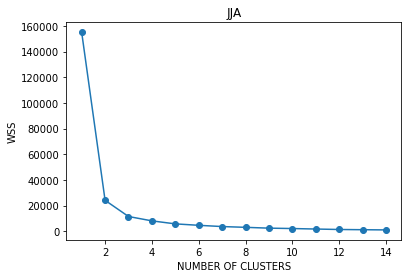

,num_clusters,WSS
0,1,155015.934836
1,2,24109.351454
2,3,11498.604900
3,4,8099.240882
4,5,5756.230414
5,6,4640.045434
6,7,3667.926209
7,8,3064.856295
8,9,2427.643040
9,10,2123.282549


In [91]:
#FOR 30MINS RESOLUTION

#PV HOUSEHOLD:
S =JJA
error_JJA = []
for k in range(1, 15):
    cluster1 = KMeans(n_clusters = k)
    cluster1.fit_predict(S[S.columns[0:]])
    error_JJA.append(cluster1.inertia_)

clusters_JJA= pd.DataFrame( {"num_clusters" : range(1, 15), "WSS" :  error_JJA})

plt.plot(clusters_JJA.num_clusters, clusters_JJA.WSS, marker = "o")
plt.xlabel('NUMBER OF CLUSTERS')
plt.ylabel('WSS')
plt.title('JJA')
plt.show()

clusters_JJA


In [92]:
def elbow(df):
    error = []
    for k in range(1, 15):
        cluster = KMeans(n_clusters = k)
        cluster.fit_predict(df[df.columns[0:]])
        error.append(cluster.inertia_)

    clusters = pd.DataFrame( {"num_clusters" : range(1, 15), "cluster_errors" :  error})

    plt.plot(clusters.num_clusters, clusters.cluster_errors, marker = "o")
    plt.xlabel('NUMBER OF CLUSTERS')
    plt.ylabel('WSS')
    plt.title(df.name)
    plt.show()



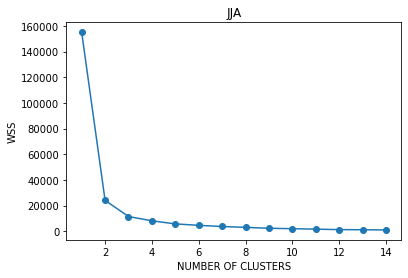

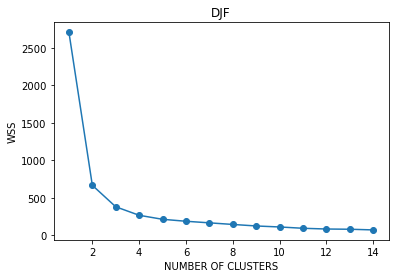

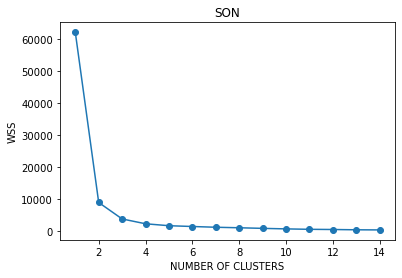

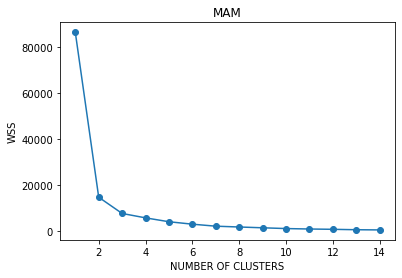

In [93]:
elbow(JJA)
elbow(DJF)
elbow(SON)
elbow(MAM)

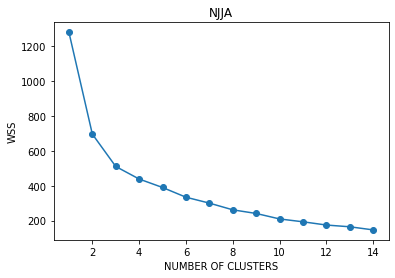

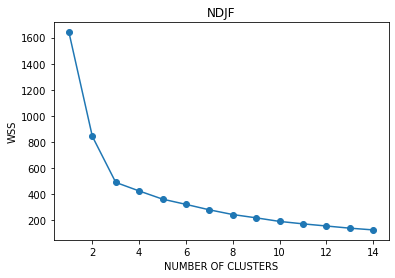

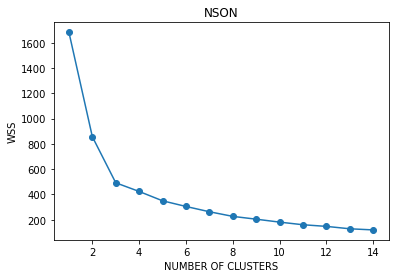

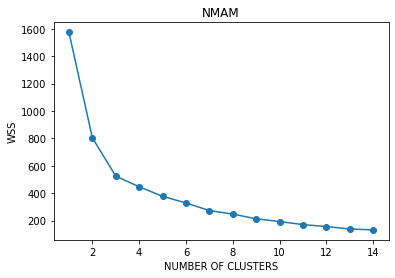

In [94]:
#FOR NPV

elbow(NJJA)
elbow(NDJF)
elbow(NSON)
elbow(NMAM)

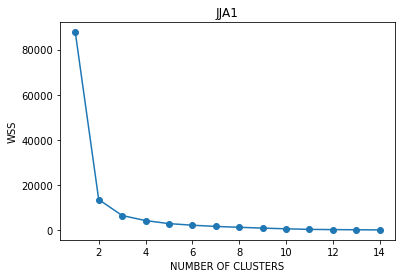

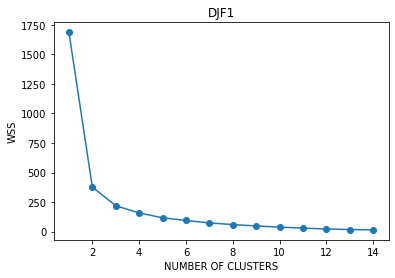

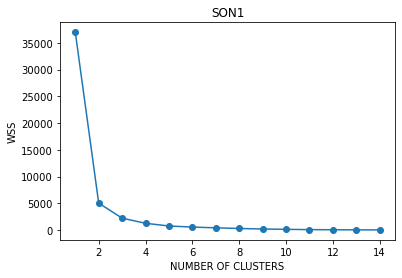

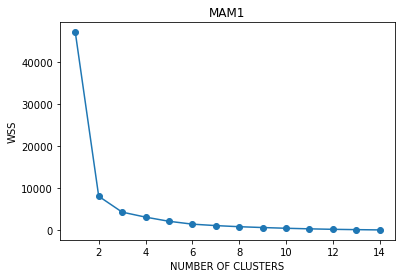

In [95]:
#FOR 1HR RESOLUTION

#FOR PV

elbow(JJA1)
elbow(DJF1)
elbow(SON1)
elbow(MAM1)

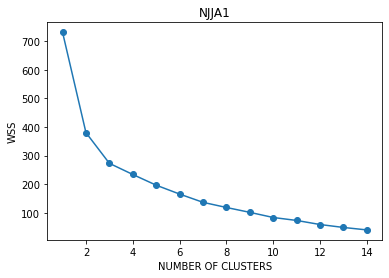

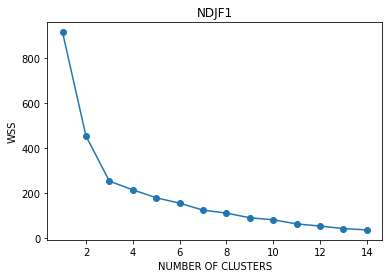

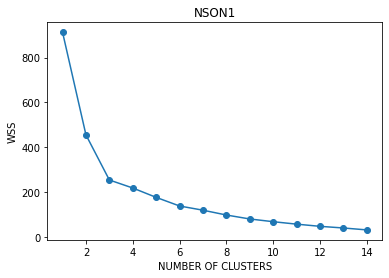

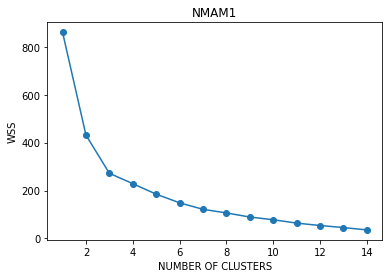

In [96]:
#FOR NPV

elbow(NJJA1)
elbow(NDJF1)
elbow(NSON1)
elbow(NMAM1)

THE APPROPRIATE NUMBER OF CLUSTERS FOR ALGORITHM IS 3

# APPLYING KMEANS CLUSTERING

FOR 30MINS RESOLUTION

In [97]:
def cluster(x):
    y =x.T
    cluster = KMeans(n_clusters = 3)
    y['cluster_number'] = cluster.fit_predict(y[y.columns[0:]])
    y.name = x.name
    return y


In [98]:
#FOR PV

scl = cluster(JJA)
wcl = cluster(DJF)
fcl = cluster(SON)
spcl = cluster(MAM)

In [99]:
#FOR NPV

Nscl = cluster(NJJA)
Nwcl = cluster(NDJF)
Nfcl = cluster(NSON)
Nspcl = cluster(NMAM)

In [100]:
#CLUSTERING RESULTS FOR PV

Assignment_df = pd.DataFrame(data = None, index = scl.index, columns = None, dtype = None, copy = False)
Assignment_df['JJA'] = scl['cluster_number']
Assignment_df['DJF'] = wcl['cluster_number']
Assignment_df['SON'] = fcl['cluster_number']
Assignment_df['MAM'] = spcl['cluster_number']

Assignment_df

,JJA,DJF,SON,MAM
0,0,1,0,0
1,0,1,0,0
2,2,1,0,0
3,0,1,0,1
4,0,1,0,1
...,...,...,...,...
151,2,0,0,0
152,1,0,2,2
153,0,0,0,1
WEEKDAY,0,1,0,1


In [101]:
#CLUSTERING RESULTS FOR NPV

Assignment_df = pd.DataFrame(data = None, index = Nscl.index, columns = None, dtype = None, copy = False)
Assignment_df['NJJA'] = Nscl['cluster_number']
Assignment_df['NDJF'] = Nwcl['cluster_number']
Assignment_df['NSON'] = Nfcl['cluster_number']
Assignment_df['NMAM'] = Nspcl['cluster_number']

Assignment_df

,NJJA,NDJF,NSON,NMAM
0,0,1,0,2
1,1,0,1,1
2,2,0,1,0
3,0,2,0,0
4,1,1,2,0
...,...,...,...,...
611,2,0,1,1
612,2,1,2,0
613,2,2,1,1
WEEKDAY,1,1,2,0


In [102]:
#CLUSTERING VISUALIZATION FOR PV

def cluster_visualization(x):
    x_0 = x[(x.cluster_number == 0)].reset_index(drop = True)
    x_0 = x_0.drop(['cluster_number'], axis = 1)
    x_1 = x[(x.cluster_number == 1)].reset_index(drop = True)
    x_1 = x_1.drop(['cluster_number'], axis = 1)
    x_2 = x[(x.cluster_number == 2)].reset_index(drop = True)
    x_2 = x_2.drop(['cluster_number'], axis = 1)
    
    plt.figure(figsize = (28, 14))
    plt.xlabel = ('TIME OF THE DAY')
    plt.ylabel = ('ELECTRICITY CONSUMPTION FOR PV HOUSEHOLD')
    plt.title = (x.name)
    plt.plot((x_0).mean(), color = 'r')
    plt.plot(x_0.T, color ='r', alpha = 0.03)
    plt.plot((x_1).mean(), color = 'b')
    plt.plot(x_1.T, color ='b', alpha = 0.03)
    plt.plot((x_2).mean(), color = 'g')
    plt.plot(x_2.T, color ='g', alpha = 0.05)
    
    c = mpatches.Patch(color= 'red', label = "Cluster 1")
    d = mpatches.Patch(color= 'blue', label = "Cluster 2")
    e = mpatches.Patch(color= 'green', label = "Cluster 3")
    
    plt.legend(handles = [c,d,e])
    plt.show()

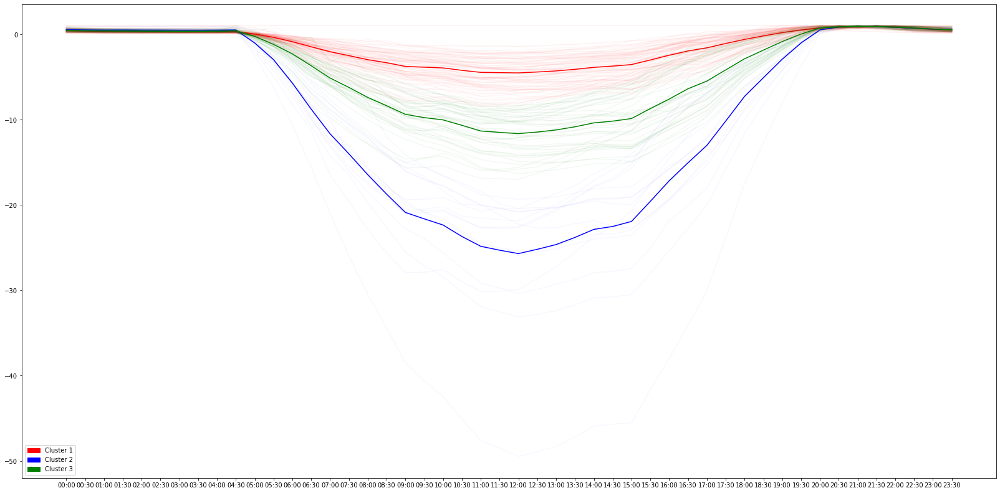

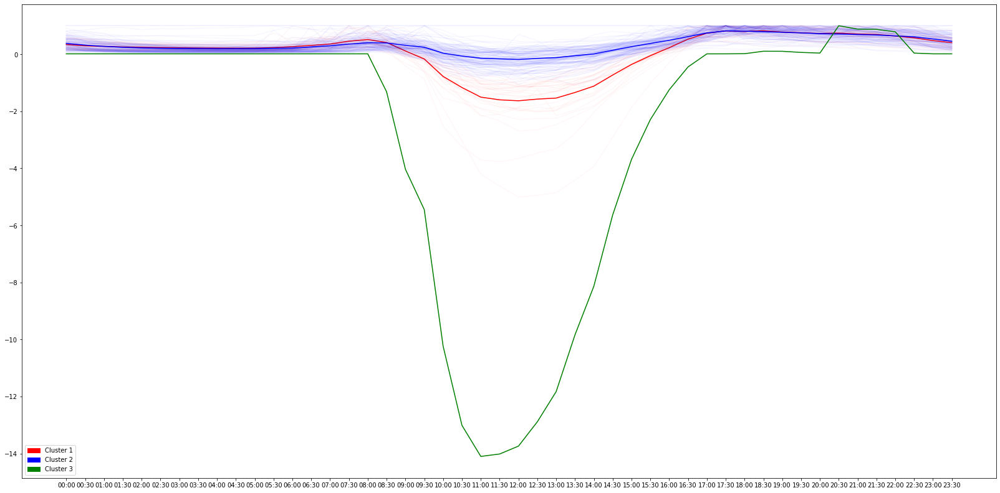

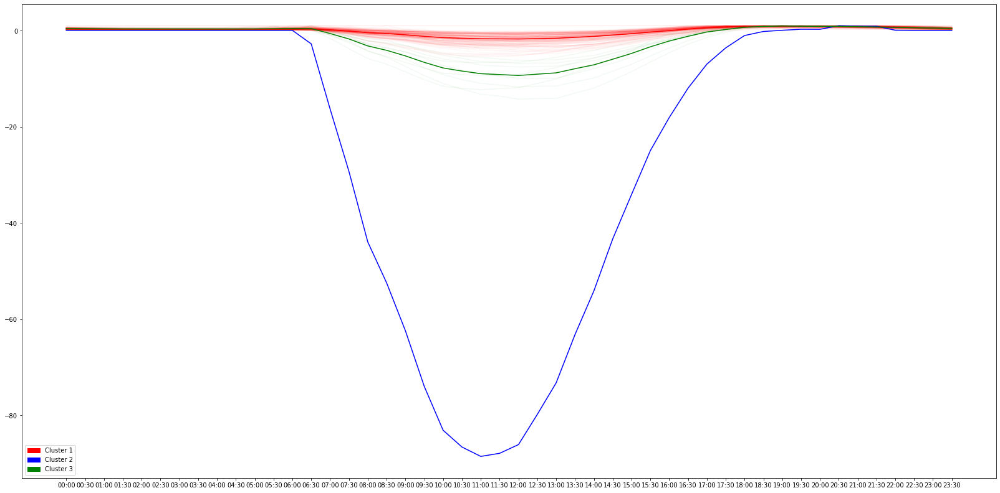

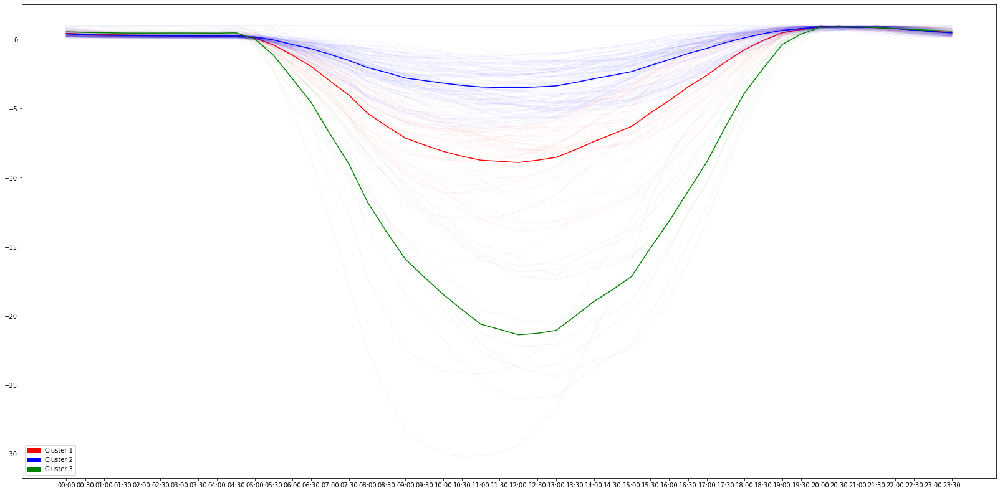

In [103]:
cluster_visualization(scl)
cluster_visualization(wcl)
cluster_visualization(fcl)
cluster_visualization(spcl)

In [104]:
#CLUSTERING VISUALIZATION FOR NPV

def cluster_visualization(x):
    x_0 = x[(x.cluster_number == 0)].reset_index(drop = True)
    x_0 = x_0.drop(['cluster_number'], axis = 1)
    x_1 = x[(x.cluster_number == 1)].reset_index(drop = True)
    x_1 = x_1.drop(['cluster_number'], axis = 1)
    x_2 = x[(x.cluster_number == 2)].reset_index(drop = True)
    x_2 = x_2.drop(['cluster_number'], axis = 1)
    
    plt.figure(figsize = (28, 14))
    plt.xlabel = ('TIME OF THE DAY')
    plt.ylabel = ('ELECTRICITY CONSUMPTION FOR NPV HOUSEHOLD')
    plt.title = (x.name)
    plt.plot((x_0).mean(), color = 'r')
    plt.plot(x_0.T, color ='r', alpha = 0.03)
    plt.plot((x_1).mean(), color = 'b')
    plt.plot(x_1.T, color ='b', alpha = 0.03)
    plt.plot((x_2).mean(), color = 'g')
    plt.plot(x_2.T, color ='g', alpha = 0.05)
    
    c = mpatches.Patch(color= 'red', label = "Cluster 1")
    d = mpatches.Patch(color= 'blue', label = "Cluster 2")
    e = mpatches.Patch(color= 'green', label = "Cluster 3")
    
    plt.legend(handles = [c,d,e])
    plt.show()

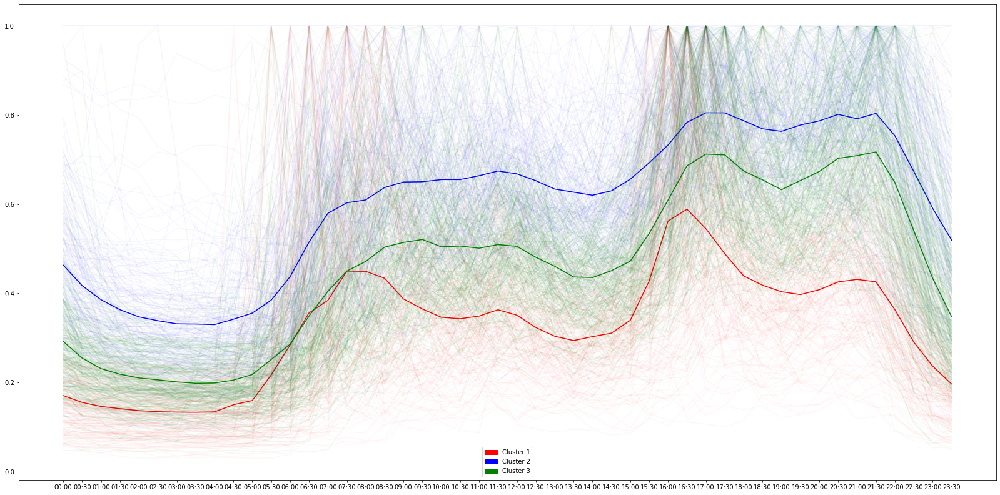

C:\Users\HP PC\anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


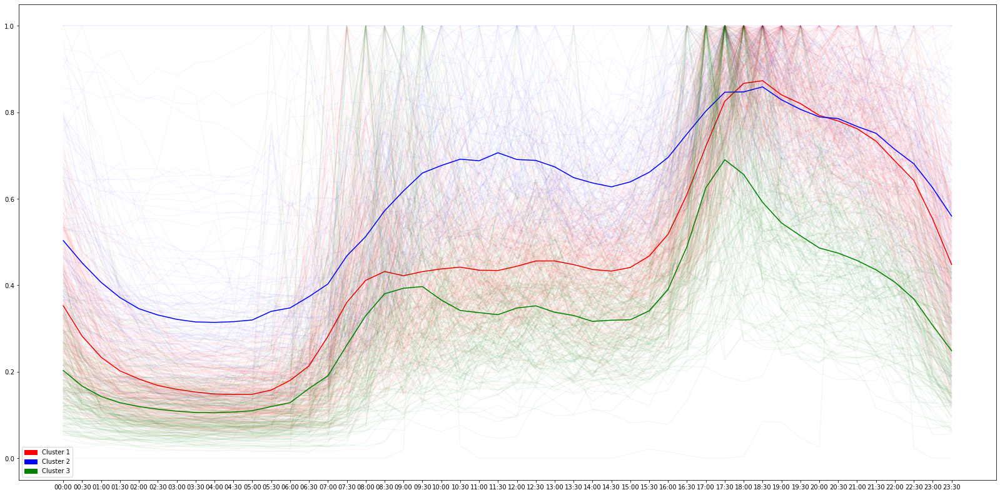

C:\Users\HP PC\anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


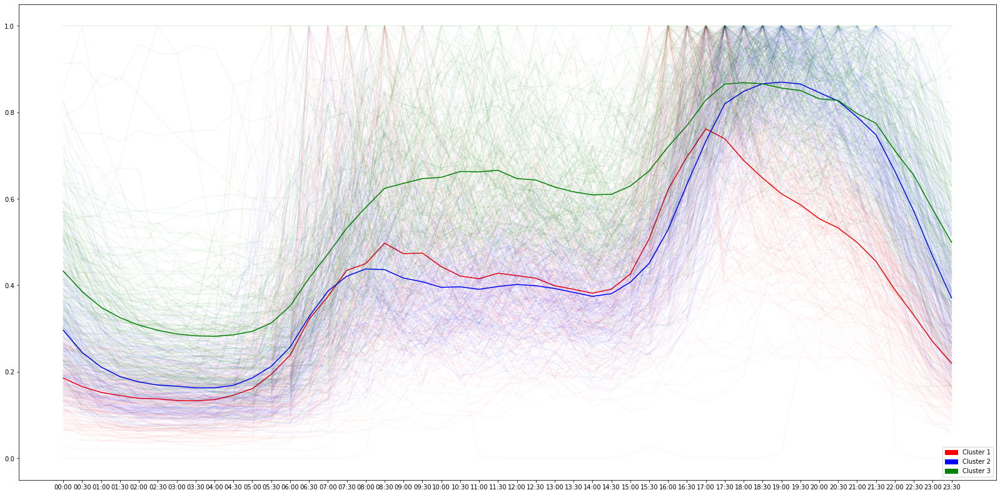

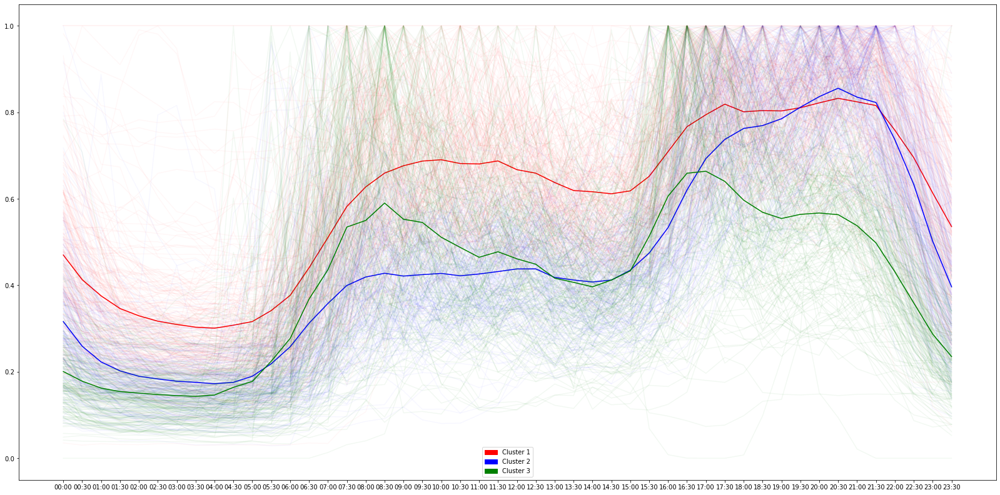

In [105]:
cluster_visualization(Nscl)
cluster_visualization(Nwcl)
cluster_visualization(Nfcl)
cluster_visualization(Nspcl)

FOR 1HR RESOLUTION

In [106]:
def cluster(x):
    y =x.T
    cluster = KMeans(n_clusters = 3)
    y['cluster_number'] = cluster.fit_predict(y[y.columns[0:]])
    y.name = x.name
    return y

In [107]:
#FOR PV

scl1 = cluster(JJA1)
wcl1 = cluster(DJF1)
fcl1 = cluster(SON1)
spcl1 = cluster(MAM1)

In [108]:
#FOR NPV

Nscl1 = cluster(NJJA1)
Nwcl1 = cluster(NDJF1)
Nfcl1 = cluster(NSON1)
Nspcl1 = cluster(NMAM1)

In [109]:
#CLUSTERING RESULTS FOR PV

Assignment_df = pd.DataFrame(data = None, index = scl1.index, columns = None, dtype = None, copy = False)
Assignment_df['JJA1'] = scl1['cluster_number']
Assignment_df['DJF1'] = wcl1['cluster_number']
Assignment_df['SON1'] = fcl1['cluster_number']
Assignment_df['MAM1'] = spcl1['cluster_number']

Assignment_df

,JJA1,DJF1,SON1,MAM1
0,2,0,0,2
1,2,0,0,2
2,2,0,0,2
3,2,0,0,0
4,2,0,0,0
...,...,...,...,...
151,1,2,0,2
152,1,2,2,1
153,2,2,0,0
WEEKDAY,2,0,0,0


In [110]:
#CLUSTERING RESULTS FOR NPV

Assignment_df = pd.DataFrame(data = None, index = Nscl1.index, columns = None, dtype = None, copy = False)
Assignment_df['NJJA1'] = Nscl1['cluster_number']
Assignment_df['NDJF1'] = Nwcl1['cluster_number']
Assignment_df['NSON1'] = Nfcl1['cluster_number']
Assignment_df['NMAM1'] = Nspcl1['cluster_number']

Assignment_df

,NJJA1,NDJF1,NSON1,NMAM1
0,2,1,0,1
1,0,2,0,1
2,1,2,1,2
3,2,0,0,0
4,0,1,2,2
...,...,...,...,...
611,1,2,1,1
612,0,1,2,0
613,1,0,1,1
WEEKDAY,0,1,2,2


In [111]:
#CLUSTERING VISUALIZATION FOR PV

def cluster_visualization(x):
    x_0 = x[(x.cluster_number == 0)].reset_index(drop = True)
    x_0 = x_0.drop(['cluster_number'], axis = 1)
    x_1 = x[(x.cluster_number == 1)].reset_index(drop = True)
    x_1 = x_1.drop(['cluster_number'], axis = 1)
    x_2 = x[(x.cluster_number == 2)].reset_index(drop = True)
    x_2 = x_2.drop(['cluster_number'], axis = 1)
    
    plt.figure(figsize = (15, 8))
    plt.xlabel = ('TIME OF THE DAY')
    plt.ylabel = ('ELECTRICITY CONSUMPTION FOR PV HOUSEHOLD')
    plt.title = (x.name)
    plt.plot((x_0).mean(), color = 'r')
    plt.plot(x_0.T, color ='r', alpha = 0.03)
    plt.plot((x_1).mean(), color = 'b')
    plt.plot(x_1.T, color ='b', alpha = 0.03)
    plt.plot((x_2).mean(), color = 'g')
    plt.plot(x_2.T, color ='g', alpha = 0.05)
    
    c = mpatches.Patch(color= 'red', label = "Cluster 1")
    d = mpatches.Patch(color= 'blue', label = "Cluster 2")
    e = mpatches.Patch(color= 'green', label = "Cluster 3")
    
    plt.legend(handles = [c,d,e])
    plt.show()

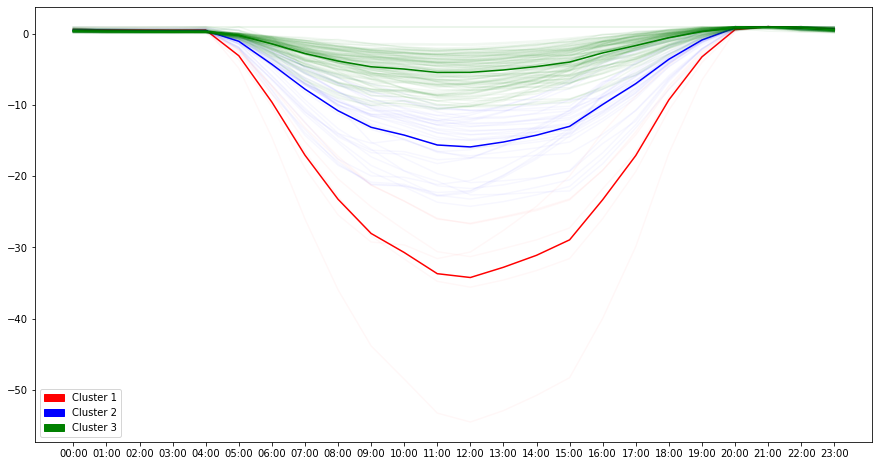

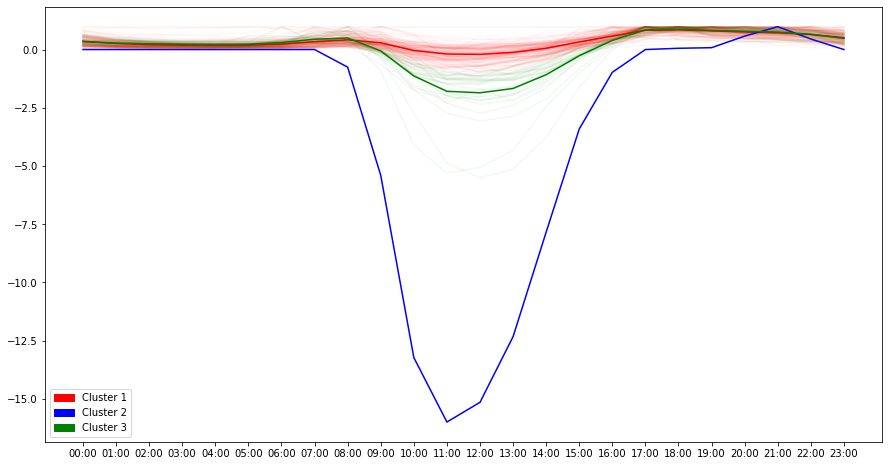

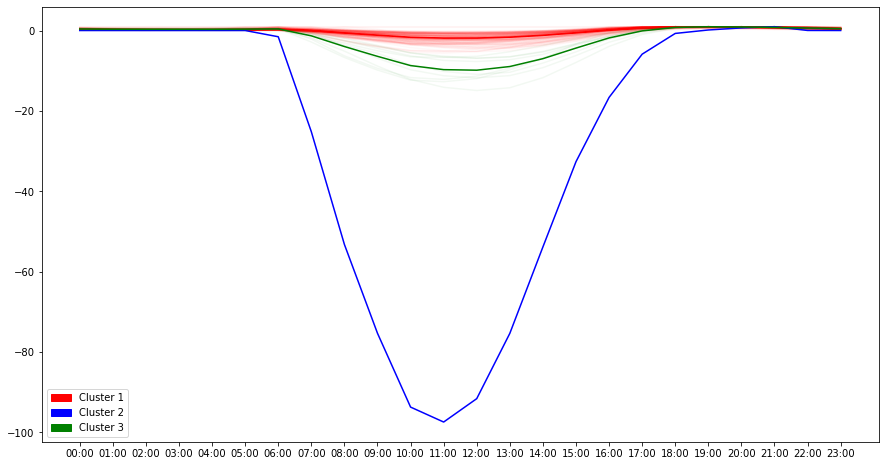

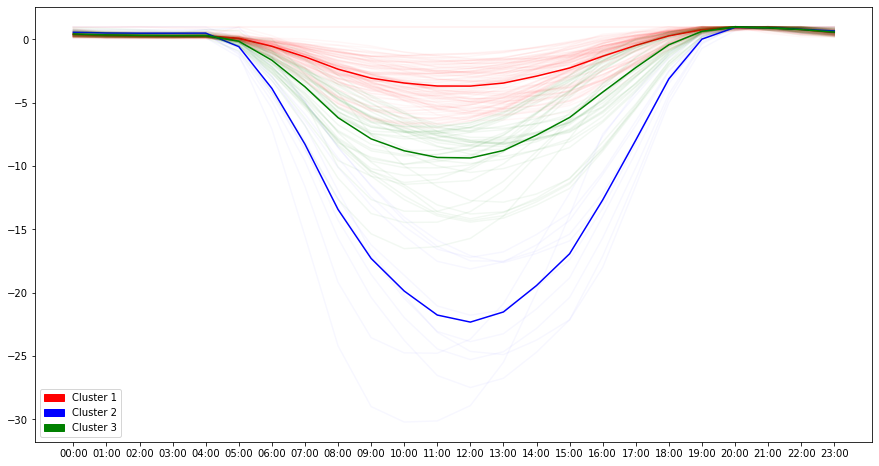

In [112]:
cluster_visualization(scl1)
cluster_visualization(wcl1)
cluster_visualization(fcl1)
cluster_visualization(spcl1)

In [113]:
#CLUSTERING VISUALIZATION FOR NPV

def cluster_visualization(x):
    x_0 = x[(x.cluster_number == 0)].reset_index(drop = True)
    x_0 = x_0.drop(['cluster_number'], axis = 1)
    x_1 = x[(x.cluster_number == 1)].reset_index(drop = True)
    x_1 = x_1.drop(['cluster_number'], axis = 1)
    x_2 = x[(x.cluster_number == 2)].reset_index(drop = True)
    x_2 = x_2.drop(['cluster_number'], axis = 1)
    
    plt.figure(figsize = (15, 8))
    plt.xlabel = ('TIME OF THE DAY')
    plt.ylabel = ('ELECTRICITY CONSUMPTION FOR NPV HOUSEHOLD')
    plt.title = (x.name)
    plt.plot((x_0).mean(), color = 'r')
    plt.plot(x_0.T, color ='r', alpha = 0.03)
    plt.plot((x_1).mean(), color = 'b')
    plt.plot(x_1.T, color ='b', alpha = 0.03)
    plt.plot((x_2).mean(), color = 'g')
    plt.plot(x_2.T, color ='g', alpha = 0.05)
    
    c = mpatches.Patch(color= 'red', label = "Cluster 1")
    d = mpatches.Patch(color= 'blue', label = "Cluster 2")
    e = mpatches.Patch(color= 'green', label = "Cluster 3")
    
    plt.legend(handles = [c,d,e])
    plt.show()

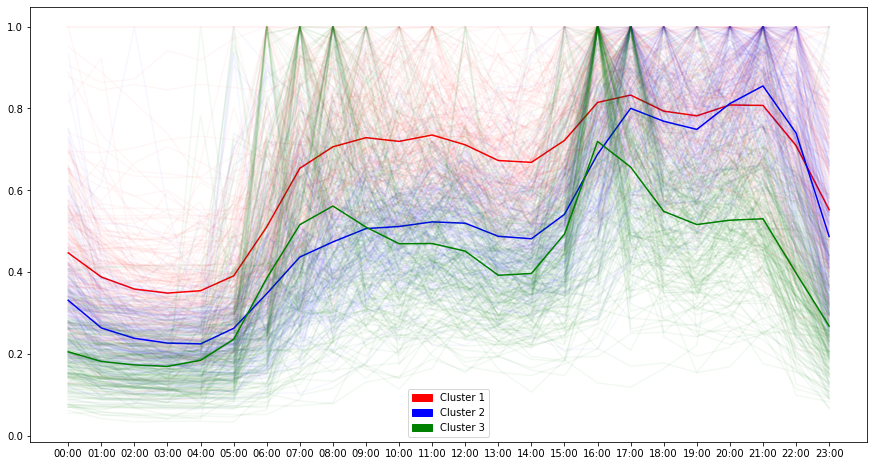

C:\Users\HP PC\anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


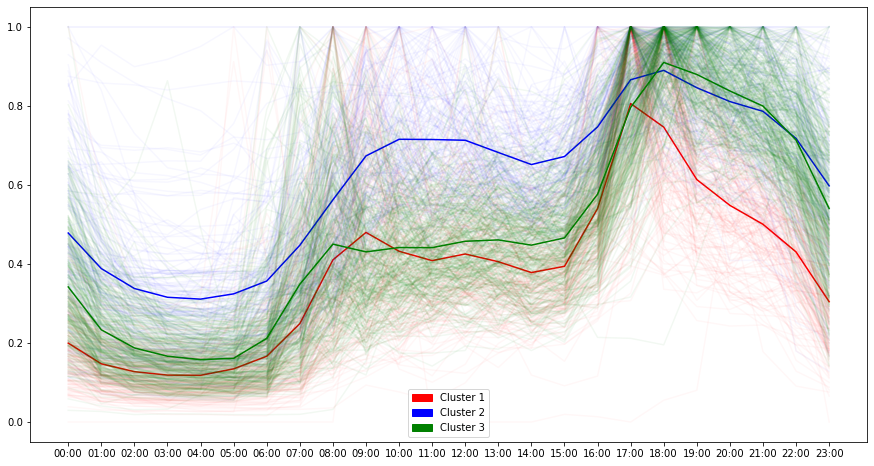

C:\Users\HP PC\anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


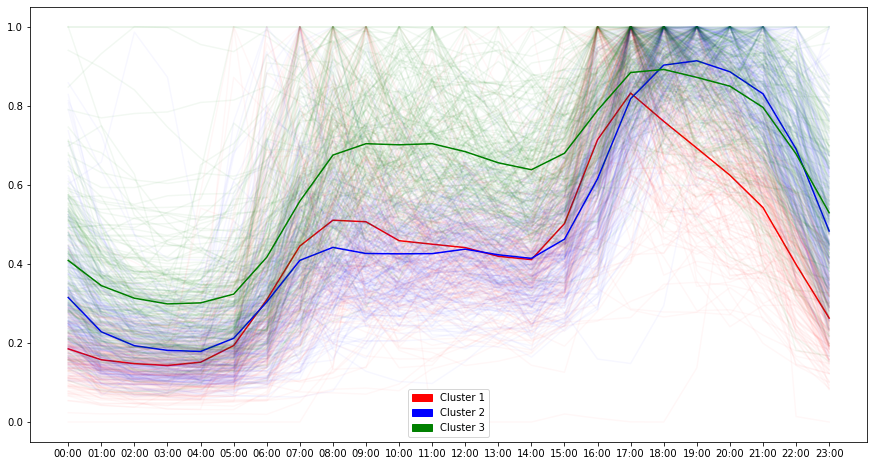

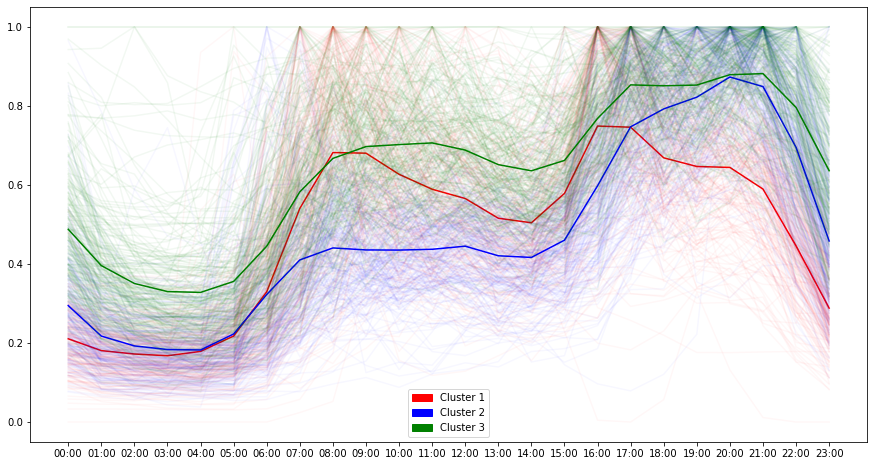

In [114]:
cluster_visualization(Nscl1)
cluster_visualization(Nwcl1)
cluster_visualization(Nfcl1)
cluster_visualization(Nspcl1)

FOR 2HRS RESOLUTION

In [115]:
def cluster(x):
    y =x.T
    cluster = KMeans(n_clusters = 3)
    y['cluster_number'] = cluster.fit_predict(y[y.columns[0:]])
    y.name = x.name
    return y

In [116]:
#FOR PV

scl2 = cluster(JJA2)
wcl2 = cluster(DJF2)
fcl2 = cluster(SON2)
spcl2 = cluster(MAM2)

In [117]:
#FOR NPV

Nscl2 = cluster(NJJA2)
Nwcl2 = cluster(NDJF2)
Nfcl2 = cluster(NSON2)
Nspcl2 = cluster(NMAM2)

In [118]:
#CLUSTERING RESULTS FOR PV

Assignment_df = pd.DataFrame(data = None, index = scl1.index, columns = None, dtype = None, copy = False)
Assignment_df['JJA2'] = scl2['cluster_number']
Assignment_df['DJF2'] = wcl2['cluster_number']
Assignment_df['SON2'] = fcl2['cluster_number']
Assignment_df['MAM2'] = spcl2['cluster_number']

Assignment_df

,JJA2,DJF2,SON2,MAM2
0,0,0,2,1
1,0,0,2,1
2,0,0,2,1
3,0,0,2,1
4,0,0,2,0
...,...,...,...,...
151,1,2,2,2
152,1,2,0,2
153,0,2,2,0
WEEKDAY,0,0,2,0


In [119]:
#CLUSTERING RESULTS FOR NPV

Assignment_df = pd.DataFrame(data = None, index = Nscl1.index, columns = None, dtype = None, copy = False)
Assignment_df['NJJA2'] = Nscl2['cluster_number']
Assignment_df['NDJF2'] = Nwcl2['cluster_number']
Assignment_df['NSON2'] = Nfcl2['cluster_number']
Assignment_df['NMAM2'] = Nspcl2['cluster_number']

Assignment_df

,NJJA2,NDJF2,NSON2,NMAM2
0,0.0,1.0,0.0,2.0
1,0.0,1.0,0.0,2.0
2,0.0,1.0,0.0,2.0
3,0.0,1.0,0.0,2.0
4,0.0,1.0,0.0,0.0
...,...,...,...,...
611,NaN,NaN,NaN,NaN
612,NaN,NaN,NaN,NaN
613,NaN,NaN,NaN,NaN
WEEKDAY,0.0,1.0,0.0,0.0


In [120]:
#CLUSTERING VISUALIZATION FOR PV

def cluster_visualization(x):
    x_0 = x[(x.cluster_number == 0)].reset_index(drop = True)
    x_0 = x_0.drop(['cluster_number'], axis = 1)
    x_1 = x[(x.cluster_number == 1)].reset_index(drop = True)
    x_1 = x_1.drop(['cluster_number'], axis = 1)
    x_2 = x[(x.cluster_number == 2)].reset_index(drop = True)
    x_2 = x_2.drop(['cluster_number'], axis = 1)
    
    plt.figure(figsize = (15, 8))
    plt.xlabel = ('TIME OF THE DAY')
    plt.ylabel = ('ELECTRICITY CONSUMPTION FOR PV HOUSEHOLD')
    plt.title = (x.name)
    plt.plot((x_0).mean(), color = 'r')
    plt.plot(x_0.T, color ='r', alpha = 0.03)
    plt.plot((x_1).mean(), color = 'b')
    plt.plot(x_1.T, color ='b', alpha = 0.03)
    plt.plot((x_2).mean(), color = 'g')
    plt.plot(x_2.T, color ='g', alpha = 0.05)
    
    c = mpatches.Patch(color= 'red', label = "Cluster 1")
    d = mpatches.Patch(color= 'blue', label = "Cluster 2")
    e = mpatches.Patch(color= 'green', label = "Cluster 3")
    
    plt.legend(handles = [c,d,e])
    plt.show()

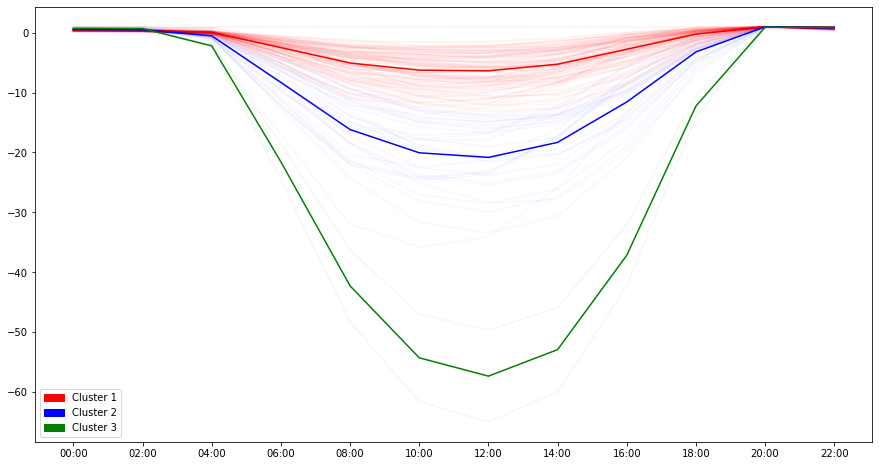

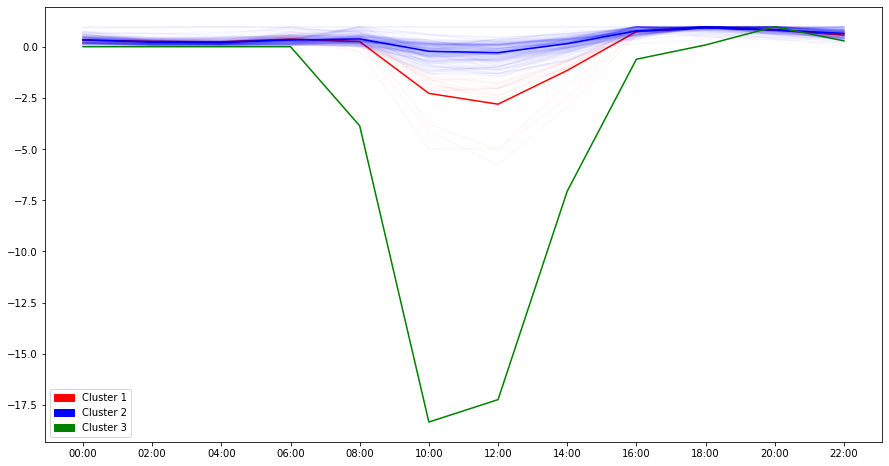

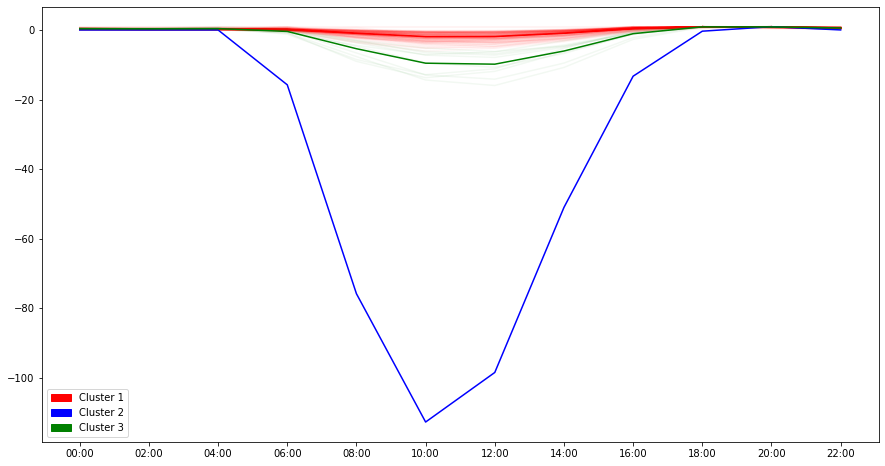

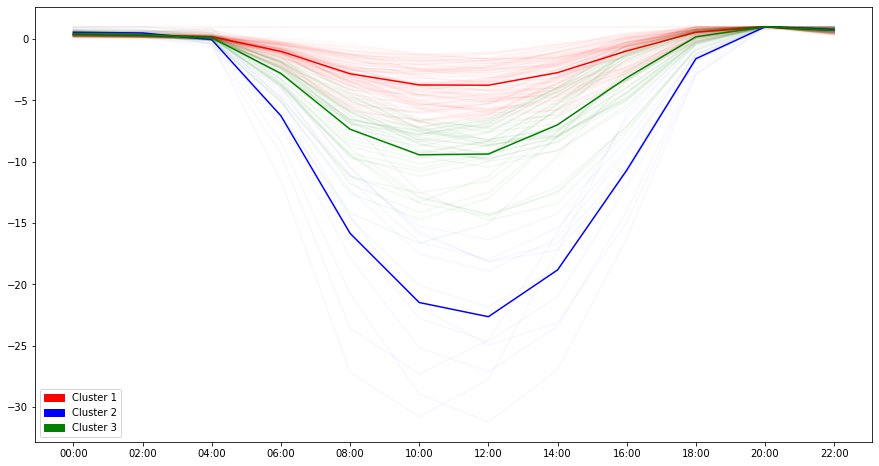

In [121]:
cluster_visualization(Nscl2)
cluster_visualization(Nwcl2)
cluster_visualization(Nfcl2)
cluster_visualization(Nspcl2)

FOR 3HRS RESOLUTIONS

In [122]:
def cluster(x):
    y =x.T
    cluster = KMeans(n_clusters = 3)
    y['cluster_number'] = cluster.fit_predict(y[y.columns[0:]])
    y.name = x.name
    return y

In [123]:
#FOR PV

scl3 = cluster(JJA3)
wcl3 = cluster(DJF3)
fcl3 = cluster(SON3)
spcl3 = cluster(MAM3)

In [124]:
#FOR NPV

Nscl3 = cluster(NJJA3)
Nwcl3 = cluster(NDJF3)
Nfcl3 = cluster(NSON3)
Nspcl3 = cluster(NMAM3)

In [125]:
#CLUSTERING RESULTS FOR PV

Assignment_df = pd.DataFrame(data = None, index = scl1.index, columns = None, dtype = None, copy = False)
Assignment_df['JJA3'] = scl3['cluster_number']
Assignment_df['DJF3'] = wcl3['cluster_number']
Assignment_df['SON3'] = fcl3['cluster_number']
Assignment_df['MAM3'] = spcl3['cluster_number']

Assignment_df

,JJA3,DJF3,SON3,MAM3
0,0,0,2,0
1,0,0,2,0
2,0,0,2,0
3,1,0,2,0
4,1,0,2,1
...,...,...,...,...
151,0,2,2,0
152,0,2,0,2
153,0,2,2,1
WEEKDAY,1,0,2,1


In [126]:
#CLUSTERING RESULTS FOR NPV

Assignment_df = pd.DataFrame(data = None, index = Nscl1.index, columns = None, dtype = None, copy = False)
Assignment_df['NJJA3'] = Nscl3['cluster_number']
Assignment_df['NDJF3'] = Nwcl3['cluster_number']
Assignment_df['NSON3'] = Nfcl3['cluster_number']
Assignment_df['NMAM3'] = Nspcl3['cluster_number']

Assignment_df

,NJJA3,NDJF3,NSON3,NMAM3
0,0.0,0.0,0.0,2.0
1,0.0,0.0,0.0,2.0
2,0.0,0.0,0.0,2.0
3,0.0,0.0,0.0,2.0
4,0.0,0.0,0.0,0.0
...,...,...,...,...
611,NaN,NaN,NaN,NaN
612,NaN,NaN,NaN,NaN
613,NaN,NaN,NaN,NaN
WEEKDAY,0.0,0.0,0.0,0.0


In [127]:
#CLUSTERING VISUALIZATION FOR PV

def cluster_visualization(x):
    x_0 = x[(x.cluster_number == 0)].reset_index(drop = True)
    x_0 = x_0.drop(['cluster_number'], axis = 1)
    x_1 = x[(x.cluster_number == 1)].reset_index(drop = True)
    x_1 = x_1.drop(['cluster_number'], axis = 1)
    x_2 = x[(x.cluster_number == 2)].reset_index(drop = True)
    x_2 = x_2.drop(['cluster_number'], axis = 1)
    
    plt.figure(figsize = (15, 8))
    plt.xlabel = ('TIME OF THE DAY')
    plt.ylabel = ('ELECTRICITY CONSUMPTION FOR PV HOUSEHOLD')
    plt.title = (x.name)
    plt.plot((x_0).mean(), color = 'r')
    plt.plot(x_0.T, color ='r', alpha = 0.03)
    plt.plot((x_1).mean(), color = 'b')
    plt.plot(x_1.T, color ='b', alpha = 0.03)
    plt.plot((x_2).mean(), color = 'g')
    plt.plot(x_2.T, color ='g', alpha = 0.05)
    
    c = mpatches.Patch(color= 'red', label = "Cluster 1")
    d = mpatches.Patch(color= 'blue', label = "Cluster 2")
    e = mpatches.Patch(color= 'green', label = "Cluster 3")
    
    plt.legend(handles = [c,d,e])
    plt.show()

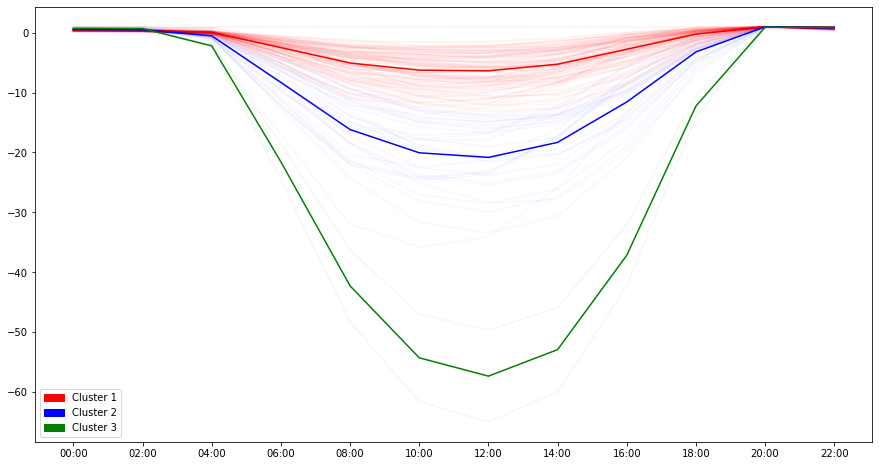

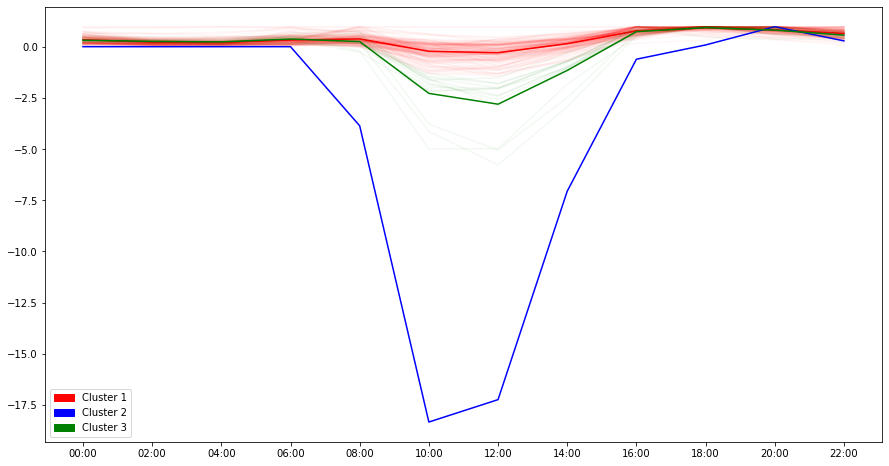

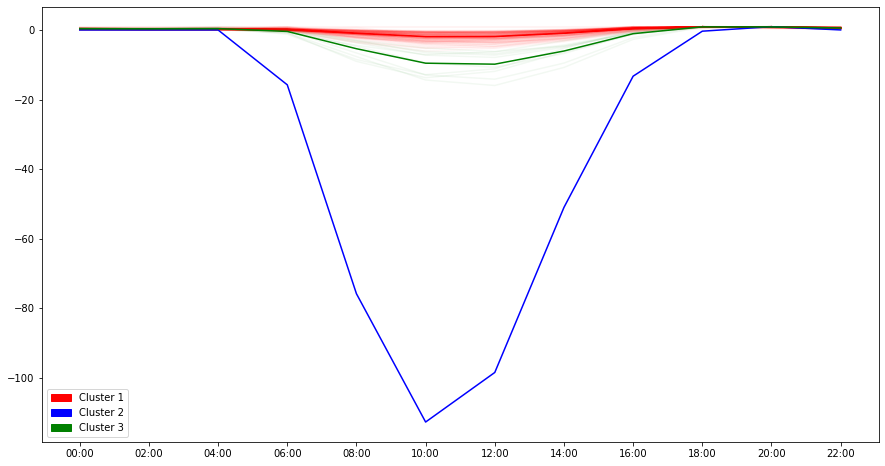

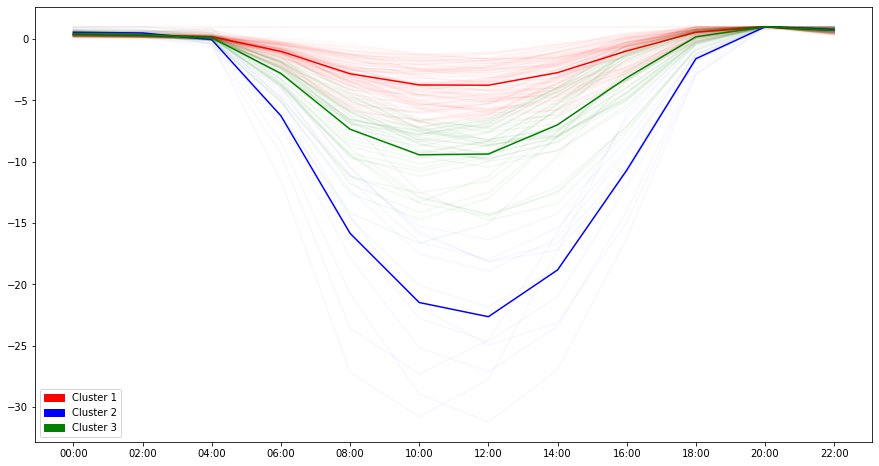

In [128]:
cluster_visualization(Nscl3)
cluster_visualization(Nwcl3)
cluster_visualization(Nfcl3)
cluster_visualization(Nspcl3)

# DENSITY BASED SPATIAL CLUSTERING ALGORITHM WITH NOISE

In [129]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import normalize
from sklearn.decomposition import PCA

FOR 30MINS

In [130]:
PV_30MINS

,0,1,2,3,4,5,6,7,8,9,...,145,146,147,148,149,150,151,152,153,Hour
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.04191,0.0742,0.0431,0.0771,0.1411,0.0911,0.0541,0.178,0.073,0.1742,...,0.0131,0.0621,0.0751,0.0576,0.05814,0.13116,0.07301,0.10114,0.0567,00:00
2008-07-01 00:30:00,0.04991,0.0742,0.0431,0.0661,0.0461,0.0991,0.0271,0.135,0.072,0.2832,...,0.0131,0.0891,0.0551,0.0516,0.05614,0.11516,0.07601,0.10214,0.0442,00:30
2008-07-01 01:00:00,0.07241,0.0657,0.0401,0.0811,0.0471,0.0591,0.0191,0.149,0.073,0.2442,...,0.0671,0.0661,0.0271,0.0611,0.03614,0.15616,0.07201,0.11914,0.0517,01:00
2008-07-01 01:30:00,0.04791,0.0617,0.0501,0.0751,0.0401,0.0871,0.0291,0.083,0.074,0.2042,...,0.0341,0.0661,0.0221,0.0421,0.02614,0.13016,0.10001,0.14114,0.0367,01:30
2008-07-01 02:00:00,0.04741,0.0762,0.0421,0.0881,0.0381,0.0551,0.0821,0.028,0.075,0.2382,...,0.0131,0.0741,0.0381,0.0546,0.07414,0.11016,0.10401,0.10414,0.0452,02:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 21:30:00,0.12991,0.0452,0.1021,0.1601,0.3311,0.1531,0.2061,0.073,0.068,0.3192,...,0.0901,0.2511,0.4351,0.2771,0.30314,0.29516,0.16501,0.05814,0.1572,21:30
2009-06-30 22:00:00,0.13091,0.0672,0.1001,0.1911,0.1681,0.1061,0.1591,0.110,0.074,0.3592,...,0.0591,0.2281,0.2701,0.1551,0.30814,0.29516,0.17201,0.05814,0.4342,22:00
2009-06-30 22:30:00,0.09091,0.0462,0.0831,0.1041,0.1351,0.0801,0.0701,0.109,0.085,0.4172,...,0.0111,0.1731,0.1911,0.1651,0.24114,0.28316,0.16801,0.05914,0.0982,22:30


In [131]:
NPV_30MINS

,0,1,2,3,4,5,6,7,8,9,...,605,606,607,608,609,610,611,612,613,Hour
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.0410,0.0740,0.039,0.073,0.137,0.091,0.050,0.171,0.066,0.174,...,0.162,0.1930,0.155,0.117,0.103,0.129,0.110,0.454,0.150,00:00
2008-07-01 00:30:00,0.0490,0.0740,0.039,0.062,0.042,0.099,0.023,0.128,0.065,0.283,...,0.185,0.1395,0.180,0.116,0.067,0.137,0.060,0.196,0.116,00:30
2008-07-01 01:00:00,0.0715,0.0655,0.036,0.077,0.043,0.059,0.015,0.142,0.066,0.244,...,0.206,0.1155,0.154,0.126,0.094,0.110,0.087,0.087,0.130,01:00
2008-07-01 01:30:00,0.0470,0.0615,0.046,0.071,0.036,0.087,0.025,0.076,0.067,0.204,...,0.147,0.1220,0.152,0.087,0.083,0.110,0.072,0.068,0.095,01:30
2008-07-01 02:00:00,0.0465,0.0760,0.038,0.084,0.034,0.055,0.078,0.021,0.068,0.238,...,0.205,0.1060,0.104,0.100,0.076,0.112,0.073,0.018,0.018,02:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 21:30:00,0.1290,0.0450,0.098,0.156,0.327,0.153,0.202,0.066,0.061,0.319,...,0.195,0.2020,0.175,0.314,0.101,0.640,0.770,0.213,0.286,21:30
2009-06-30 22:00:00,0.1300,0.0670,0.096,0.187,0.164,0.106,0.155,0.103,0.067,0.359,...,0.222,0.2520,0.112,0.256,0.123,0.251,0.294,0.258,0.145,22:00
2009-06-30 22:30:00,0.0900,0.0460,0.079,0.100,0.131,0.080,0.066,0.102,0.078,0.417,...,0.206,0.4170,0.127,0.247,0.048,0.184,0.085,0.266,0.305,22:30


In [132]:
X = Hourly_PV_30
X

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.196332,0.080018,0.078471,0.081326,0.143185,0.078156,0.047974,0.114926,0.070295,0.346351,...,0.123023,0.047751,0.091914,0.146047,0.094251,0.122236,0.215746,0.148284,0.099858,0.074779
00:30,0.186976,0.073759,0.055577,0.079186,0.113042,0.082029,0.047564,0.086127,0.069259,0.300056,...,0.100018,0.043404,0.080107,0.120405,0.075652,0.095484,0.194520,0.131781,0.089159,0.060879
01:00,0.180859,0.070399,0.050368,0.082963,0.088199,0.072342,0.047595,0.064559,0.069489,0.262884,...,0.090768,0.040993,0.073892,0.110326,0.060603,0.076267,0.173687,0.126070,0.080651,0.055181
01:30,0.177736,0.068542,0.048441,0.079674,0.077001,0.076344,0.047353,0.051173,0.069716,0.239052,...,0.086408,0.039730,0.071892,0.100732,0.054371,0.064896,0.156344,0.122537,0.078988,0.056925
02:00,0.172828,0.068330,0.047373,0.082334,0.071079,0.068458,0.047086,0.045196,0.069533,0.217460,...,0.087560,0.039571,0.070512,0.092760,0.047770,0.059530,0.143722,0.106847,0.078888,0.053512
02:30,0.171840,0.067979,0.047471,0.079567,0.069119,0.069221,0.046964,0.044534,0.069059,0.196647,...,0.084160,0.040360,0.070707,0.077766,0.047347,0.057325,0.131663,0.101905,0.078310,0.051037
03:00,0.168555,0.067703,0.049579,0.080705,0.067734,0.066045,0.048816,0.043934,0.068810,0.185126,...,0.087948,0.040403,0.069807,0.064751,0.046155,0.056708,0.119789,0.093380,0.079430,0.047885
03:30,0.169189,0.066144,0.049500,0.078226,0.067679,0.065301,0.048056,0.042129,0.068985,0.177582,...,0.084125,0.038725,0.070433,0.049237,0.047121,0.058402,0.114242,0.088142,0.078506,0.040705
04:00,0.168363,0.066879,0.048366,0.078604,0.067537,0.061232,0.048636,0.041433,0.068859,0.173519,...,0.081953,0.041221,0.071048,0.040563,0.045823,0.055137,0.114131,0.081965,0.077565,0.039773


In [133]:
NX = Hourly_NPV_30
NX

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.195422,0.079818,0.074371,0.077226,0.139085,0.078056,0.043874,0.107926,0.063295,0.346151,...,0.089166,0.159425,0.346356,0.096500,0.241630,0.084134,0.231767,0.146982,0.263004,0.216133
00:30,0.186066,0.073559,0.051477,0.075086,0.108942,0.081929,0.043464,0.079127,0.062259,0.299856,...,0.080930,0.158936,0.300833,0.088925,0.198911,0.075812,0.179955,0.123734,0.227786,0.147945
01:00,0.179949,0.070199,0.046268,0.078863,0.084099,0.072242,0.043495,0.057559,0.062489,0.262684,...,0.080549,0.154266,0.255071,0.088795,0.179086,0.074259,0.149247,0.116368,0.174595,0.111151
01:30,0.176826,0.068342,0.044341,0.075574,0.072901,0.076244,0.043253,0.044173,0.062716,0.238852,...,0.077927,0.154277,0.207711,0.086104,0.155940,0.068821,0.141210,0.110279,0.146145,0.084919
02:00,0.171918,0.068130,0.043273,0.078234,0.066979,0.068358,0.042986,0.038196,0.062533,0.217260,...,0.077067,0.165247,0.172678,0.089414,0.148982,0.069907,0.130733,0.109859,0.136305,0.060710
02:30,0.170930,0.067779,0.043371,0.075467,0.065019,0.069121,0.042864,0.037534,0.062059,0.196447,...,0.077229,0.162618,0.152204,0.088810,0.144974,0.070230,0.125521,0.106515,0.128337,0.043426
03:00,0.167645,0.067503,0.045479,0.076605,0.063634,0.065945,0.044716,0.036934,0.061810,0.184926,...,0.078886,0.141553,0.143768,0.086051,0.142803,0.069029,0.116404,0.106878,0.125303,0.035379
03:30,0.168279,0.065944,0.045400,0.074126,0.063579,0.065201,0.043956,0.035129,0.061985,0.177382,...,0.077690,0.140629,0.140590,0.086112,0.133177,0.070016,0.111312,0.102975,0.127573,0.035263
04:00,0.167453,0.066679,0.044266,0.074504,0.063437,0.061132,0.044536,0.034433,0.061859,0.173319,...,0.075544,0.138732,0.136434,0.084081,0.121322,0.069768,0.107401,0.100252,0.129179,0.033381


FOR 1HR

In [134]:
PV_1HR

,0,1,2,3,4,5,6,7,8,9,...,145,146,147,148,149,150,151,152,153,Hour
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.09182,0.148400,0.086200,0.143200,0.187200,0.190200,0.081200,0.313000,0.145000,0.457400,...,0.026200,0.151200,0.130200,0.109200,0.114280,0.246320,0.149020,0.203280,0.100900,00:00
2008-07-01 01:00:00,0.12032,0.127400,0.090200,0.156200,0.087200,0.146200,0.048200,0.232000,0.147000,0.448400,...,0.101200,0.132200,0.049200,0.103200,0.062280,0.286320,0.172020,0.260280,0.088400,01:00
2008-07-01 02:00:00,0.11282,0.138400,0.087200,0.146200,0.079200,0.110200,0.127200,0.095000,0.151000,0.382400,...,0.046200,0.151200,0.066200,0.099200,0.128280,0.189320,0.205020,0.206280,0.093400,02:00
2008-07-01 03:00:00,0.09332,0.134900,0.087200,0.159200,0.091200,0.152200,0.098200,0.077000,0.151000,0.294400,...,0.084200,0.122200,0.045200,0.096200,0.059280,0.185320,0.192020,0.206280,0.085400,03:00
2008-07-01 04:00:00,0.10132,0.130900,0.094200,0.149200,0.092200,0.110200,0.119200,0.072000,0.153000,0.317400,...,0.062200,0.159200,0.060200,0.096700,0.118280,0.193320,0.146020,0.238280,0.093400,04:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 19:00:00,-0.11079,-0.082012,-0.011686,0.042314,-0.482338,-0.085009,-0.317192,-1.156680,-1.163827,1.326931,...,-0.955158,-0.791951,-1.074357,-0.959995,-1.330052,-1.459439,-1.665836,-0.633032,-0.767899,19:00
2009-06-30 20:00:00,0.22490,0.090159,0.226200,0.314200,-0.111480,0.091103,0.108437,-0.402695,-0.404551,0.481444,...,-0.292810,-0.137671,0.478418,-0.228642,-0.376947,-0.518028,-0.632861,-0.075734,-0.350298,20:00
2009-06-30 21:00:00,0.29082,0.134400,0.308200,0.432200,0.503200,0.307200,0.324200,0.127000,0.150000,0.657400,...,0.260200,0.520200,1.496200,0.397200,0.537280,0.576320,0.371020,0.117280,0.225400,21:00


In [135]:
NPV_1HR

,0,1,2,3,4,5,6,7,8,9,...,605,606,607,608,609,610,611,612,613,Hour
Timestamp,,,,,,,,,,,,,,,,,,,,,
2008-07-01 00:00:00,0.0900,0.1480,0.078,0.135,0.179,0.190,0.073,0.299,0.131,0.457,...,0.347,0.3325,0.335,0.233,0.170,0.266,0.170,0.650,0.266,00:00
2008-07-01 01:00:00,0.1185,0.1270,0.082,0.148,0.079,0.146,0.040,0.218,0.133,0.448,...,0.353,0.2375,0.306,0.213,0.177,0.220,0.159,0.155,0.225,01:00
2008-07-01 02:00:00,0.1110,0.1380,0.079,0.138,0.071,0.110,0.119,0.081,0.137,0.382,...,0.403,0.2010,0.228,0.229,0.169,0.223,0.146,0.096,0.068,02:00
2008-07-01 03:00:00,0.0915,0.1345,0.079,0.151,0.083,0.152,0.090,0.063,0.137,0.294,...,0.344,0.2305,0.225,0.206,0.166,0.212,0.155,0.151,0.044,03:00
2008-07-01 04:00:00,0.0995,0.1305,0.086,0.141,0.084,0.110,0.111,0.058,0.139,0.317,...,0.332,0.2200,0.228,0.148,0.153,0.252,0.156,0.107,0.079,04:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-30 19:00:00,0.1650,0.3280,0.196,0.250,0.120,0.455,0.298,0.133,0.120,2.226,...,0.821,0.8680,0.238,0.222,0.293,0.687,0.147,0.746,0.408,19:00
2009-06-30 20:00:00,0.2560,0.1680,0.218,0.306,0.105,0.343,0.334,0.179,0.173,0.904,...,0.524,0.4140,0.249,0.471,0.167,1.633,3.235,0.680,0.716,20:00
2009-06-30 21:00:00,0.2890,0.1340,0.300,0.424,0.495,0.307,0.316,0.113,0.136,0.657,...,0.454,0.3850,0.299,0.631,0.221,1.491,1.415,0.446,0.593,21:00


In [136]:
X1 = Hourly_PV_1
X1

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.383308,0.153777,0.134048,0.160512,0.256227,0.160185,0.095538,0.201053,0.139553,0.646407,...,0.223041,0.091155,0.172021,0.266452,0.169903,0.217720,0.410267,0.280065,0.189017,0.135659
01:00,0.358595,0.138941,0.098810,0.162637,0.165200,0.148686,0.094948,0.115732,0.139205,0.501936,...,0.177177,0.080723,0.145784,0.211058,0.114974,0.141164,0.330031,0.248608,0.159639,0.112105
02:00,0.344668,0.136310,0.094844,0.161901,0.140199,0.137678,0.094051,0.089730,0.138592,0.414107,...,0.171721,0.079932,0.141219,0.170526,0.095116,0.116855,0.275384,0.208752,0.157198,0.104549
03:00,0.337745,0.133847,0.099079,0.158932,0.135414,0.131347,0.096873,0.086063,0.137795,0.362708,...,0.172073,0.079127,0.140240,0.113988,0.093275,0.115110,0.234031,0.181521,0.157936,0.088590
04:00,0.335684,0.133959,0.096366,0.156415,0.134578,0.124608,0.097632,0.083989,0.138336,0.342114,...,0.165604,0.089088,0.141475,0.074838,0.092144,0.113421,0.292820,0.163616,0.155094,0.077838
05:00,0.233650,-0.052960,-0.045278,0.012275,0.049653,0.440909,0.046574,-0.087890,-0.053553,0.200070,...,0.114237,0.025841,0.064272,-0.047278,-0.007808,-0.131569,0.095304,-0.125354,-0.170445,-0.019827
06:00,0.417777,-0.501120,-0.449711,-0.376461,-0.158194,0.282783,-0.039797,-0.408898,-0.485950,-0.052249,...,-0.162047,-0.111810,0.153306,-0.321976,-0.162808,-0.620820,-0.595083,-0.729718,-1.098444,0.172361
07:00,-0.267969,-1.137193,-1.030027,-0.867843,-0.380895,-0.134118,-0.201592,-0.769048,-1.058583,-0.292980,...,-0.538760,-0.375467,-0.037374,-0.725107,-0.423431,-1.237653,-1.543734,-1.485960,-2.499985,-0.069465
08:00,-1.160225,-1.811921,-1.521686,-1.314164,-0.588797,-0.221316,-0.377846,-1.403185,-1.604611,-0.634998,...,-0.882966,-0.885851,-0.709054,-1.163635,-0.894892,-1.923342,-2.527378,-2.323989,-3.795935,-0.772124


In [137]:
NX1 = Hourly_NPV_1
NX1

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.381488,0.153377,0.125848,0.152312,0.248027,0.159985,0.087338,0.187053,0.125553,0.646007,...,0.170096,0.318360,0.647189,0.185425,0.440541,0.159947,0.411722,0.270716,0.490790,0.364078
01:00,0.356775,0.138541,0.090610,0.154437,0.157000,0.148486,0.086748,0.101732,0.125205,0.501536,...,0.158477,0.308542,0.462782,0.174899,0.335026,0.143079,0.290456,0.226648,0.320740,0.196070
02:00,0.342848,0.135910,0.086644,0.153701,0.131999,0.137478,0.085851,0.075730,0.124592,0.413707,...,0.154296,0.327864,0.324882,0.178223,0.293956,0.140137,0.256253,0.216374,0.264642,0.104136
03:00,0.335925,0.133447,0.090879,0.150732,0.127214,0.131147,0.088673,0.072063,0.123795,0.362308,...,0.156577,0.282182,0.284359,0.172163,0.275979,0.139045,0.227716,0.209853,0.252875,0.070642
04:00,0.333864,0.133559,0.088166,0.148215,0.126378,0.124408,0.089432,0.069989,0.124336,0.341714,...,0.152732,0.278314,0.269373,0.172864,0.234486,0.143385,0.227588,0.200304,0.257314,0.065859
05:00,0.374882,0.150547,0.085684,0.143807,0.126140,0.518914,0.120679,0.088385,0.123792,0.334066,...,0.197593,0.277823,0.260225,0.229384,0.400905,0.139834,0.278796,0.203208,0.256562,0.070493
06:00,0.940173,0.226336,0.085289,0.159177,0.138115,0.535496,0.249558,0.197937,0.124044,0.377715,...,0.369827,0.333597,0.312599,0.426323,1.012186,0.144992,0.379225,0.228533,0.269330,0.098463
07:00,0.804544,0.338236,0.098429,0.259727,0.220241,0.354838,0.389432,0.418726,0.133815,0.533478,...,0.360216,0.637697,0.566501,0.463407,0.745912,0.250988,0.859768,0.332130,0.480651,0.220107
08:00,0.441493,0.378859,0.177759,0.381596,0.340948,0.522232,0.540697,0.408762,0.212458,0.616288,...,0.274945,0.989429,0.806319,0.321478,0.596911,0.685952,0.884277,0.364412,0.890655,0.350911


FOR 2HRS RESOLUTION

In [138]:
X2 = Hourly_PV_2
X2

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.741903,0.292718,0.232858,0.323149,0.421427,0.308871,0.190486,0.316785,0.278759,1.148342,...,0.400218,0.171878,0.317804,0.477510,0.284877,0.358883,0.740298,0.528673,0.348656,0.247764
02:00,0.682413,0.270156,0.193923,0.320833,0.275612,0.269025,0.190923,0.175793,0.276386,0.776815,...,0.343793,0.159059,0.281459,0.284514,0.188392,0.231965,0.509415,0.390273,0.315134,0.193140
04:00,0.569335,0.080999,0.051088,0.168690,0.184231,0.565517,0.144206,-0.003901,0.084782,0.542184,...,0.279842,0.114929,0.205748,0.027560,0.084336,-0.018148,0.388124,0.038262,-0.015351,0.058012
06:00,0.149808,-1.638313,-1.479738,-1.244304,-0.539090,0.148665,-0.241389,-1.177945,-1.544532,-0.345230,...,-0.700807,-0.487277,0.115931,-1.047083,-0.586238,-1.858473,-2.138817,-2.215679,-3.598429,0.102895
08:00,-2.671189,-4.129015,-3.388010,-3.040459,-1.351888,-0.635115,-1.167594,-3.415121,-3.654766,-1.763930,...,-2.131828,-2.236235,-2.004652,-2.714140,-2.298684,-4.447851,-5.780700,-5.473526,-8.548812,-1.941986
10:00,-3.554326,-5.420809,-4.215876,-4.019535,-2.268795,-1.748609,-2.321938,-5.439568,-5.524884,-3.105608,...,-2.874069,-3.954764,-4.039066,-4.173986,-4.012811,-6.364590,-8.487080,-8.412311,-10.814381,-3.279408
12:00,-3.233365,-4.910337,-3.842549,-3.440533,-2.709084,-2.175455,-2.749229,-5.895637,-6.125007,-2.914041,...,-2.649864,-4.610051,-4.558479,-4.843872,-4.491118,-6.818297,-9.479877,-9.000913,-9.933226,-3.720947
14:00,-1.796289,-2.910473,-2.281592,-2.031707,-2.064497,-1.808732,-1.879802,-4.930471,-4.970966,-2.050128,...,-1.491074,-3.984752,-3.665407,-4.104502,-3.819561,-5.737770,-7.780570,-7.411363,-6.171945,-3.418759
16:00,-0.173653,-0.496725,-0.338399,0.288074,-0.833902,-0.496908,-0.930671,-2.198816,-2.633944,-0.097745,...,0.032332,-1.846812,-1.406669,-2.639632,-1.339606,-2.279957,-4.091179,-3.232655,-1.793376,-1.859974


In [139]:
NX2 = Hourly_NPV_2
NX2

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,0.738263,0.291918,0.216458,0.306749,0.405027,0.308471,0.174086,0.288785,0.250759,1.147542,...,0.328573,0.626903,1.109971,0.360323,0.775567,0.303026,0.702178,0.497364,0.811530,0.560148
02:00,0.678773,0.269356,0.177523,0.304433,0.259212,0.268625,0.174523,0.147793,0.248386,0.776015,...,0.310873,0.610047,0.609241,0.350386,0.569936,0.279182,0.483970,0.426227,0.517518,0.174778
04:00,0.708747,0.284105,0.173849,0.292022,0.252518,0.643322,0.210111,0.158374,0.248127,0.675779,...,0.350325,0.556137,0.529597,0.402248,0.635392,0.283219,0.506384,0.403512,0.513875,0.136352
06:00,1.744716,0.564571,0.183718,0.418904,0.358356,0.890334,0.638989,0.616663,0.257859,0.911193,...,0.730044,0.971295,0.879100,0.889730,1.758099,0.395979,1.238993,0.560663,0.749981,0.318570
08:00,0.917262,0.770097,0.422105,0.758942,0.801514,1.082485,0.964704,0.771486,0.541490,1.121308,...,0.543937,1.912311,1.631292,0.591914,1.065999,1.661825,1.435411,0.736264,2.176049,0.730870
10:00,0.940255,0.689011,0.544508,0.719264,0.867382,0.746673,0.803097,0.640558,0.560353,1.065864,...,0.531077,1.623704,1.863855,0.530947,0.912832,1.401899,1.116319,0.895799,3.459981,1.367441
12:00,0.876095,0.669016,0.489764,0.868704,0.677867,0.515060,0.640103,0.653386,0.422990,1.569599,...,0.590910,1.686744,1.693582,0.447414,0.672145,1.119097,1.121559,0.732877,3.101674,1.112248
14:00,0.854136,0.720032,0.457556,0.695992,0.718647,0.429821,0.921158,0.499400,0.450881,1.671412,...,0.611027,1.871959,1.554147,0.392948,0.557621,0.833722,0.943616,1.017647,2.881004,1.059637
16:00,0.948093,1.072441,0.768999,1.394490,0.770605,0.823411,0.696830,0.981834,0.536296,2.091137,...,1.167682,2.645222,2.047307,0.513603,0.842299,0.940938,1.360704,1.842696,3.244638,1.681947


FOR 3HRS RESOLUTION

In [140]:
X3 = Hourly_PV_3
X3

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,1.086571,0.429027,0.327701,0.485051,0.561626,0.446549,0.284537,0.406515,0.417351,1.562449,...,0.571938,0.251810,0.459023,0.648036,0.379993,0.475739,1.015682,0.737424,0.505854,0.352314
03:00,0.907080,0.214846,0.150167,0.327621,0.319645,0.696863,0.241078,0.082162,0.222577,0.904892,...,0.451914,0.194056,0.345987,0.141548,0.177612,0.096962,0.622155,0.219783,0.142585,0.146602
06:00,-1.010418,-3.450234,-3.001424,-2.558469,-1.127886,-0.072651,-0.619235,-2.581131,-3.149144,-0.980227,...,-1.583772,-1.373128,-0.593123,-2.210719,-1.481130,-3.781816,-4.666195,-4.539667,-7.394364,-0.669229
09:00,-5.065290,-7.737902,-6.082199,-5.745829,-3.031886,-2.162407,-3.111686,-7.451504,-7.575038,-4.234540,...,-4.122931,-5.305148,-5.334664,-5.724491,-5.416604,-8.889099,-11.740402,-11.561849,-15.567258,-4.449269
12:00,-4.330936,-6.654237,-5.201891,-4.658480,-3.849182,-3.174321,-3.810608,-8.601529,-8.813739,-4.062099,...,-3.559437,-6.751580,-6.562614,-6.984132,-6.538061,-9.967019,-13.665410,-12.999297,-13.609045,-5.529726
15:00,-0.872371,-1.663298,-1.260649,-0.525686,-1.758302,-1.306774,-1.749094,-4.423395,-4.916178,-0.999815,...,-0.549169,-3.690035,-3.067940,-4.603874,-3.112225,-4.869005,-7.686216,-6.645634,-4.289503,-3.469955
18:00,1.624203,1.752474,1.020994,1.167546,0.916323,1.314838,0.847862,0.575429,-0.275921,3.371991,...,1.903594,0.598313,1.118275,0.333813,0.670343,1.048819,0.479315,0.543110,0.215669,0.515316
21:00,1.622637,1.100422,1.164029,1.133222,1.253571,0.864182,0.760847,1.316292,0.443975,3.017705,...,1.738249,0.740516,1.188201,1.573342,1.031284,1.462593,1.638782,1.337464,0.843578,0.929477


In [141]:
NX3 = Hourly_NPV_3
NX3

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
Hour,,,,,,,,,,,,,,,,,,,,,
00:00,1.081111,0.427827,0.303101,0.460451,0.537026,0.445949,0.259937,0.364515,0.375351,1.561249,...,0.482868,0.954767,1.434853,0.538547,1.069523,0.443163,0.958432,0.713738,1.076173,0.664284
03:00,1.044671,0.417552,0.264729,0.442753,0.379732,0.774468,0.298784,0.230437,0.371922,1.038088,...,0.506901,0.838319,0.813956,0.574411,0.911371,0.422264,0.734100,0.613366,0.766751,0.206995
06:00,2.186210,0.943430,0.361477,0.800500,0.699304,1.412566,1.179686,1.025425,0.470316,1.527481,...,1.004989,1.960723,1.685419,1.211208,2.355010,1.081932,2.123270,0.925075,1.640636,0.669481
09:00,1.416023,1.080249,0.788855,1.096611,1.327948,1.306926,1.227104,1.003282,0.889386,1.570885,...,0.800068,2.546586,2.688827,0.801382,1.381919,2.377771,1.667453,1.267651,4.745375,1.747400
12:00,1.306614,1.011964,0.716784,1.229684,1.032519,0.716514,1.080412,0.861836,0.645481,2.418636,...,0.890726,2.512342,2.426190,0.650481,0.940781,1.564234,1.611100,1.149726,4.563737,1.622163
15:00,1.371710,1.449525,0.999536,1.729503,1.134600,1.051778,1.177678,1.272785,0.764686,2.913512,...,1.478893,3.691582,2.868845,0.703484,1.131284,1.329523,1.814779,2.443493,4.663579,2.231668
18:00,1.850767,2.093656,1.189527,1.336079,1.301440,1.686341,1.242338,1.428085,0.572382,3.991640,...,1.632947,3.326237,3.264305,1.755503,1.927211,1.595659,4.322408,3.590729,3.777181,2.302704
21:00,1.617177,1.099222,1.139429,1.108622,1.228971,0.863582,0.736247,1.274292,0.401975,3.016505,...,1.024416,1.774422,2.669867,0.919115,2.021070,0.954664,3.094489,2.329941,2.768990,2.153651


# REDUCING THE DIMENSIONALITY OF THE DATASET

FOR 30MINS

In [142]:
#FOR PV

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_normalized = normalize(X_scaled)

X_normalized = pd.DataFrame(X_normalized)

In [143]:
#FOR NPV

scaler = StandardScaler()
NX_scaled = scaler.fit_transform(NX)

NX_normalized = normalize(NX_scaled)
NX_normalized = pd.DataFrame(NX_normalized)
NX_normalized

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
0,-0.032621,-0.050983,-0.033514,-0.054457,-0.015513,-0.047614,-0.066700,-0.028292,-0.042877,-0.008573,...,-0.045938,-0.056239,-0.008560,-0.035662,-0.001383,-0.048116,-0.025927,-0.033321,-0.041041,-0.008468
1,-0.033454,-0.047143,-0.043716,-0.048407,-0.033684,-0.039674,-0.058189,-0.039492,-0.038536,-0.019086,...,-0.044378,-0.048990,-0.020684,-0.035460,-0.018811,-0.044730,-0.033305,-0.034363,-0.040965,-0.027037
2,-0.033417,-0.044204,-0.042722,-0.042235,-0.045720,-0.039909,-0.052838,-0.046011,-0.034745,-0.025823,...,-0.040496,-0.045497,-0.030882,-0.032278,-0.024509,-0.041123,-0.036051,-0.032767,-0.044478,-0.034203
3,-0.032681,-0.042030,-0.040973,-0.040886,-0.049104,-0.035806,-0.049497,-0.048886,-0.032238,-0.029221,...,-0.039054,-0.042522,-0.040563,-0.031516,-0.031008,-0.040053,-0.035114,-0.031828,-0.045206,-0.038395
4,-0.033347,-0.040175,-0.039641,-0.037918,-0.050061,-0.036972,-0.047340,-0.049144,-0.030938,-0.032273,...,-0.037635,-0.038473,-0.046954,-0.028486,-0.031905,-0.037903,-0.035264,-0.030444,-0.044327,-0.042289
5,-0.032824,-0.039159,-0.038465,-0.037941,-0.049673,-0.035657,-0.046047,-0.048018,-0.030519,-0.035473,...,-0.036497,-0.037868,-0.050307,-0.027957,-0.032299,-0.036737,-0.035115,-0.030191,-0.044011,-0.045012
6,-0.033561,-0.038486,-0.036673,-0.036751,-0.049412,-0.036034,-0.044362,-0.047313,-0.030155,-0.037010,...,-0.035088,-0.040954,-0.051212,-0.028663,-0.032354,-0.036339,-0.035887,-0.029532,-0.043498,-0.045919
7,-0.032935,-0.038610,-0.036316,-0.037311,-0.048908,-0.035896,-0.044201,-0.047516,-0.029666,-0.038058,...,-0.035204,-0.040679,-0.051366,-0.028327,-0.035034,-0.035684,-0.036308,-0.029906,-0.042769,-0.045450
8,-0.033215,-0.038282,-0.036797,-0.037094,-0.048887,-0.037192,-0.043875,-0.047699,-0.029727,-0.038762,...,-0.036020,-0.040941,-0.052188,-0.029185,-0.038689,-0.035681,-0.036858,-0.030331,-0.042502,-0.045776
9,-0.034019,-0.038634,-0.037381,-0.037810,-0.049680,-0.036874,-0.044206,-0.047776,-0.029468,-0.040142,...,-0.035732,-0.041237,-0.053545,-0.027370,-0.041704,-0.035036,-0.035216,-0.030701,-0.043091,-0.046480


In [144]:
#FOR PV

pca = PCA(n_components = 2)
X_principal = pca.fit_transform(X)
X_principal = pd.DataFrame(X_principal)
X_principal.columns = [1, 2]
X_principal

,1,2
0,-5.334738,-0.392009
1,-5.085776,-0.463595
2,-4.922581,-0.492041
3,-4.800332,-0.526968
4,-4.717149,-0.545159
5,-4.670936,-0.562730
6,-4.634584,-0.575217
7,-4.615061,-0.578635
8,-4.607975,-0.583534
9,-4.639078,-0.594736


In [145]:
#FOR NPV

pca = PCA(n_components = 2)
NX_principal = pca.fit_transform(NX)
NX_principal = pd.DataFrame(NX_principal)
NX_principal.columns = [1, 2]
NX_principal

,1,2
0,-1.731497,1.372869
1,-2.475200,1.104019
2,-3.007930,0.853943
3,-3.351964,0.678839
4,-3.571749,0.566304
5,-3.706311,0.471351
6,-3.799494,0.417051
7,-3.851021,0.366257
8,-3.879803,0.320049
9,-3.817544,0.265983


FOR 1HR

In [146]:
#FOR PV1

scaler = StandardScaler()
X1_scaled = scaler.fit_transform(X1)

X1_normalized = normalize(X1_scaled)
X1_normalized = pd.DataFrame(X1_normalized)
X1_normalized

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
0,0.076969,0.074329,0.077169,0.071365,0.091963,0.059745,0.071731,0.090108,0.097747,0.079446,...,0.062792,0.080811,0.073734,0.096497,0.084861,0.088695,0.097382,0.093331,0.089469,0.081784
1,0.080833,0.079754,0.079896,0.078262,0.083428,0.062797,0.078266,0.090558,0.106779,0.069037,...,0.061423,0.087043,0.077511,0.099409,0.086075,0.090914,0.101740,0.100043,0.096188,0.086094
2,0.082116,0.082642,0.082541,0.081261,0.081859,0.062806,0.081180,0.091639,0.110947,0.060537,...,0.062966,0.090391,0.080027,0.098753,0.086982,0.092532,0.102460,0.101446,0.099861,0.088412
3,0.082395,0.083640,0.084357,0.082083,0.082156,0.062314,0.083006,0.092673,0.112553,0.054782,...,0.063981,0.091661,0.081122,0.093751,0.088068,0.093793,0.101474,0.101212,0.101420,0.087414
4,0.081991,0.083533,0.083878,0.081618,0.081874,0.060688,0.083047,0.092339,0.112447,0.052034,...,0.062822,0.092801,0.081159,0.089121,0.087798,0.093520,0.104939,0.099903,0.101115,0.085715
5,0.081682,0.077214,0.078509,0.074313,0.078487,0.160177,0.087215,0.091096,0.112424,0.040529,...,0.065511,0.102171,0.086410,0.090543,0.090469,0.088334,0.111908,0.097775,0.099700,0.086097
6,0.197155,0.036504,0.024341,0.016330,0.050701,0.204164,0.114373,0.093259,0.105421,0.001888,...,0.018310,0.141759,0.174290,0.091867,0.116540,0.069218,0.106407,0.088090,0.063636,0.210045
7,-0.004185,-0.089823,-0.119700,-0.110622,-0.036576,0.003046,0.037126,0.016549,-0.013444,-0.055548,...,-0.098141,0.061530,0.108397,-0.005051,0.040224,-0.033330,-0.014278,-0.013685,-0.090070,0.117494
8,-0.109374,-0.102946,-0.112496,-0.105417,-0.052630,-0.015719,-0.014412,-0.045607,-0.053444,-0.064384,...,-0.095233,-0.027133,-0.020188,-0.045805,-0.032981,-0.064572,-0.058780,-0.053474,-0.105639,-0.033454
9,-0.099574,-0.097457,-0.099749,-0.101603,-0.054072,-0.035195,-0.058413,-0.063626,-0.060358,-0.078565,...,-0.096796,-0.051357,-0.054104,-0.055252,-0.058470,-0.070566,-0.063847,-0.065558,-0.100064,-0.054973


In [147]:
#FOR NPV1

scaler = StandardScaler()
NX1_scaled = scaler.fit_transform(NX1)

NX1_normalized = normalize(NX1_scaled)
NX1_normalized = pd.DataFrame(NX1_normalized)
NX1_normalized

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
0,-0.033613,-0.048865,-0.039321,-0.051557,-0.025170,-0.048969,-0.063096,-0.034996,-0.041010,-0.014138,...,-0.045545,-0.052233,-0.015024,-0.035891,-0.010869,-0.046467,-0.029928,-0.033696,-0.040795,-0.018519
1,-0.033405,-0.042796,-0.041968,-0.041589,-0.047096,-0.042444,-0.051618,-0.048225,-0.033646,-0.027316,...,-0.039927,-0.043620,-0.035642,-0.032016,-0.028138,-0.040496,-0.035441,-0.031937,-0.044393,-0.036405
2,-0.033421,-0.039364,-0.039150,-0.037942,-0.049429,-0.040742,-0.047105,-0.049274,-0.030879,-0.033543,...,-0.037190,-0.037838,-0.048281,-0.028309,-0.032387,-0.037211,-0.035033,-0.029966,-0.043674,-0.043673
3,-0.033586,-0.038259,-0.036591,-0.037044,-0.048727,-0.040359,-0.044678,-0.048097,-0.030057,-0.037144,...,-0.035269,-0.040463,-0.050893,-0.028585,-0.033996,-0.035912,-0.035938,-0.029376,-0.042648,-0.045684
4,-0.034082,-0.038308,-0.037322,-0.037598,-0.049027,-0.041710,-0.044597,-0.048601,-0.029853,-0.039179,...,-0.036134,-0.040882,-0.052647,-0.028476,-0.040687,-0.035393,-0.036012,-0.030271,-0.042470,-0.046296
5,-0.027102,-0.037750,-0.040484,-0.041041,-0.052391,0.035427,-0.040537,-0.047910,-0.032137,-0.042595,...,-0.028575,-0.043679,-0.057272,-0.016675,-0.015041,-0.038283,-0.034087,-0.032034,-0.045374,-0.048862
6,0.122828,-0.028990,-0.049508,-0.046176,-0.059925,0.047312,-0.013927,-0.029663,-0.039045,-0.046525,...,0.011930,-0.046759,-0.062294,0.037963,0.108827,-0.045796,-0.031177,-0.036164,-0.054396,-0.055563
7,0.104353,-0.004648,-0.055345,-0.025357,-0.039855,0.003246,0.030078,0.034611,-0.040310,-0.033155,...,0.011384,-0.013688,-0.031293,0.059784,0.065268,-0.033315,0.022712,-0.029626,-0.047233,-0.046417
8,-0.018973,0.006894,-0.025760,0.012980,0.009681,0.056872,0.085647,0.033215,0.020228,-0.021746,...,-0.017880,0.038640,0.011656,0.008943,0.028972,0.062950,0.027292,-0.026530,-0.010522,-0.024683
9,-0.007560,0.011726,0.001940,0.012955,0.068212,0.077126,0.049296,0.019665,0.126726,-0.044289,...,-0.022317,0.031953,0.016916,-0.011817,-0.006007,0.143484,-0.019303,-0.028415,0.030653,-0.021531


In [148]:
#FOR PV1

pca = PCA(n_components = 2)
X1_principal = pca.fit_transform(X1)
X1_principal = pd.DataFrame(X1_principal)
X1_principal.columns = [1, 2]
X1_principal

,1,2
0,-10.420740,-0.857378
1,-9.723187,-1.023346
2,-9.388396,-1.113658
3,-9.249968,-1.160172
4,-9.247374,-1.184841
5,-7.492652,-1.366845
6,-3.352435,-2.117217
7,2.560182,-3.147287
8,9.129067,-3.738574
9,14.880978,-3.711129


In [149]:
#FOR NPV1

pca = PCA(n_components = 2)
NX1_principal = pca.fit_transform(NX1)
NX1_principal = pd.DataFrame(NX1_principal)
NX1_principal.columns = [1, 2]
NX1_principal

,1,2
0,-4.204911,2.476509
1,-6.358455,1.535998
2,-7.277061,1.042412
3,-7.649849,0.788166
4,-7.697209,0.590940
5,-7.063697,0.294033
6,-4.788035,-0.499405
7,-1.606278,-1.670683
8,0.125706,-2.561287
9,-0.065431,-2.584763


FOR 2HR RESOLUTION

In [150]:
#FOR PV2

scaler = StandardScaler()
X2_scaled = scaler.fit_transform(X2)

X2_normalized = normalize(X2_scaled)
X2_normalized = pd.DataFrame(X2_normalized)
X2_normalized

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
0,0.079079,0.077005,0.078627,0.074728,0.087919,0.062026,0.075272,0.090426,0.102016,0.074395,...,0.062265,0.083837,0.075693,0.097801,0.085416,0.089910,0.099432,0.096523,0.092803,0.083898
1,0.082437,0.083133,0.083514,0.081650,0.081946,0.063331,0.082452,0.092154,0.111566,0.057557,...,0.063528,0.090971,0.080644,0.096077,0.087397,0.093213,0.101823,0.101200,0.100655,0.087875
2,0.082249,0.080877,0.081728,0.078495,0.080491,0.107376,0.085540,0.092019,0.112554,0.046840,...,0.064268,0.097251,0.083836,0.089821,0.089117,0.091464,0.108227,0.099072,0.100759,0.086073
3,0.122059,-0.042383,-0.071935,-0.070310,0.005429,0.133117,0.099938,0.071121,0.056860,-0.039225,...,-0.060026,0.134557,0.189580,0.054378,0.102980,0.019536,0.056884,0.045741,-0.025390,0.218578
4,-0.104148,-0.100069,-0.105356,-0.103548,-0.053697,-0.027935,-0.041334,-0.056733,-0.057780,-0.073108,...,-0.096690,-0.041915,-0.040875,-0.051631,-0.048510,-0.068532,-0.062022,-0.060958,-0.102747,-0.046625
5,-0.089999,-0.089844,-0.087831,-0.092190,-0.071133,-0.071366,-0.076667,-0.076515,-0.074872,-0.081489,...,-0.085251,-0.071891,-0.077879,-0.066979,-0.075869,-0.075512,-0.073054,-0.077705,-0.090129,-0.069914
6,-0.079079,-0.077203,-0.076000,-0.073913,-0.087843,-0.090485,-0.093926,-0.084355,-0.085935,-0.074887,...,-0.076036,-0.087875,-0.089706,-0.081666,-0.087127,-0.081920,-0.084333,-0.084224,-0.078176,-0.082036
7,-0.057938,-0.052642,-0.051289,-0.051804,-0.095135,-0.112850,-0.086618,-0.100305,-0.096006,-0.080047,...,-0.056245,-0.110425,-0.103572,-0.099191,-0.107353,-0.098095,-0.097102,-0.097196,-0.052742,-0.112733
8,0.039224,0.074279,0.082920,0.135906,-0.046053,-0.042060,-0.059934,-0.039520,-0.056390,0.002263,...,0.064926,-0.061648,-0.038673,-0.120655,-0.016150,-0.017223,-0.065574,-0.027111,0.070759,-0.105304
9,0.073787,0.089352,0.080571,0.081080,0.071697,0.089981,0.074659,0.064444,0.054556,0.103885,...,0.090086,0.066215,0.070497,0.042606,0.063347,0.073681,0.058848,0.064776,0.064151,0.055775


In [151]:
#FOR NPV2

scaler = StandardScaler()
NX2_scaled = scaler.fit_transform(NX2)

NX2_normalized = normalize(NX2_scaled)
NX2_normalized = pd.DataFrame(NX2_normalized)
NX2_normalized

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
0,-0.033465,-0.045540,-0.041512,-0.046156,-0.037495,-0.049808,-0.057568,-0.044475,-0.038640,-0.021228,...,-0.043693,-0.047410,-0.026348,-0.034683,-0.021070,-0.043744,-0.033705,-0.032504,-0.042446,-0.028549
1,-0.033090,-0.038372,-0.038086,-0.037128,-0.048836,-0.044000,-0.045978,-0.050616,-0.031485,-0.034702,...,-0.036845,-0.038664,-0.048990,-0.028897,-0.033941,-0.036605,-0.035878,-0.029126,-0.042329,-0.044469
2,-0.030588,-0.037944,-0.039437,-0.039227,-0.050848,-0.004813,-0.043105,-0.050627,-0.032278,-0.040396,...,-0.033333,-0.042044,-0.054665,-0.023325,-0.029157,-0.037166,-0.035767,-0.030824,-0.043412,-0.047703
3,0.123767,-0.019517,-0.057419,-0.039896,-0.055428,0.032631,0.006452,-0.000831,-0.044814,-0.043481,...,0.013011,-0.034425,-0.052238,0.053117,0.099799,-0.044037,-0.007655,-0.035696,-0.054934,-0.056013
4,-0.014414,0.009750,-0.013710,0.013801,0.039907,0.077461,0.073755,0.029962,0.078321,-0.034136,...,-0.021838,0.037625,0.015002,-0.000939,0.013676,0.108663,0.005743,-0.028927,0.009404,-0.024793
5,-0.012595,-0.004445,0.019395,0.008362,0.071599,0.014728,0.052619,0.004830,0.111703,-0.050102,...,-0.031325,0.016963,0.050364,-0.018411,-0.013043,0.096564,-0.023995,-0.020169,0.100050,0.054058
6,-0.034565,-0.010278,0.003412,0.051835,0.015202,-0.051956,0.012340,0.009678,0.034851,0.009073,...,-0.018836,0.028359,0.032860,-0.050051,-0.072814,0.059727,-0.027989,-0.044620,0.089990,0.023422
7,-0.041088,0.002417,-0.008149,0.003434,0.030173,-0.077222,0.098813,-0.037233,0.054587,0.022884,...,-0.012563,0.052058,0.010563,-0.068097,-0.099654,0.003827,-0.048634,-0.008616,0.071668,0.014904
8,-0.004758,0.033989,0.039167,0.075045,0.018665,0.015295,0.011258,0.041477,0.043691,0.030261,...,0.060121,0.057319,0.033658,-0.010470,-0.012183,0.009360,0.000009,0.036011,0.038314,0.043334
9,0.022278,0.058673,0.040029,0.025700,0.026469,0.049055,0.020452,0.036923,0.008916,0.056740,...,0.054485,0.038365,0.039107,0.065371,0.019566,0.024295,0.059961,0.052097,0.015341,0.036801


In [152]:
#FOR PV2

pca = PCA(n_components = 2)
X2_principal = pca.fit_transform(X2)
X2_principal = pd.DataFrame(X2_principal)
X2_principal.columns = [1, 2]
X2_principal

,1,2
0,-20.146044,-1.907357
1,-18.640292,-2.323398
2,-16.741423,-2.604566
3,-0.793009,-5.284543
4,24.008857,-7.423487
5,41.186795,-3.667617
6,42.095129,2.259013
7,26.276874,7.925201
8,-1.186475,9.023531
9,-22.382326,3.835002


In [153]:
#FOR NPV2

pca = PCA(n_components = 2)
NX2_principal = pca.fit_transform(NX2)
NX2_principal = pd.DataFrame(NX2_principal)
NX2_principal.columns = [1, 2]
NX2_principal

,1,2
0,-10.549446,3.990905
1,-14.923015,1.848831
2,-14.763662,0.904033
3,-6.446092,-2.066257
4,0.021771,-5.077774
5,0.508296,-3.992053
6,0.252472,-2.532335
7,0.126703,-2.237588
8,11.820184,-2.919322
9,16.142895,1.655170


FOR 3HRS RESOLUTION

In [154]:
#FOR PV3

scaler = StandardScaler()
X3_scaled = scaler.fit_transform(X3)

X3_normalized = normalize(X3_scaled)
X3_normalized = pd.DataFrame(X3_normalized)
X3_normalized

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
0,0.081678,0.078898,0.080038,0.077351,0.085970,0.063343,0.076803,0.090758,0.104770,0.069754,...,0.062558,0.086253,0.077578,0.098382,0.086655,0.090817,0.100306,0.098224,0.095137,0.086087
1,0.083924,0.081906,0.082773,0.080282,0.080971,0.092845,0.084215,0.092121,0.112390,0.049400,...,0.064189,0.095581,0.083365,0.091386,0.089436,0.092293,0.105661,0.099892,0.101024,0.087250
2,-0.022851,-0.094822,-0.115776,-0.110374,-0.035661,0.051544,0.036143,0.000215,-0.012106,-0.064864,...,-0.097502,0.043587,0.074708,-0.007741,0.024589,-0.037813,-0.015967,-0.017388,-0.088782,0.078931
3,-0.094652,-0.092203,-0.091419,-0.095604,-0.066593,-0.062595,-0.071495,-0.073103,-0.071027,-0.080519,...,-0.088635,-0.066710,-0.072026,-0.064101,-0.071899,-0.074360,-0.070628,-0.074659,-0.093089,-0.066569
4,-0.076477,-0.072834,-0.071507,-0.070353,-0.089032,-0.096451,-0.091578,-0.088019,-0.087723,-0.075084,...,-0.072341,-0.092704,-0.092940,-0.084144,-0.091653,-0.085795,-0.086463,-0.086743,-0.074026,-0.088760
5,-0.008941,0.018805,0.024766,0.057399,-0.096661,-0.110081,-0.095444,-0.095662,-0.104406,-0.056529,...,0.008341,-0.120915,-0.099824,-0.153313,-0.090964,-0.080147,-0.112217,-0.087907,0.018263,-0.153437
6,0.074444,0.085971,0.076661,0.075468,0.076001,0.089245,0.080067,0.067642,0.058720,0.100386,...,0.092476,0.070569,0.072635,0.061478,0.069325,0.074473,0.063554,0.066517,0.063508,0.066013
7,0.073286,0.069977,0.079622,0.073307,0.089248,0.065132,0.074934,0.082255,0.073383,0.089018,...,0.085184,0.073447,0.073422,0.091363,0.078326,0.080763,0.077954,0.076702,0.070249,0.078249


In [155]:
#FOR NPV3

scaler = StandardScaler()
NX3_scaled = scaler.fit_transform(NX3)

NX3_normalized = normalize(NX3_scaled)
NX3_normalized = pd.DataFrame(NX3_normalized)
NX3_normalized

,0,1,2,3,4,5,6,7,8,9,...,604,605,606,607,608,609,610,611,612,613
0,-0.037553,-0.042489,-0.040043,-0.046315,-0.041078,-0.051356,-0.055543,-0.047314,-0.034800,-0.024982,...,-0.043300,-0.043835,-0.034501,-0.031297,-0.025758,-0.043283,-0.033371,-0.031422,-0.041626,-0.034488
1,-0.035535,-0.037466,-0.037945,-0.041451,-0.049057,-0.019596,-0.045277,-0.050751,-0.030756,-0.038035,...,-0.035752,-0.041596,-0.053275,-0.024422,-0.031241,-0.038571,-0.034962,-0.030258,-0.041932,-0.047352
2,0.105243,-0.013087,-0.055441,-0.029689,-0.040463,0.053621,0.039014,0.012448,-0.027431,-0.042172,...,0.003840,-0.013587,-0.038070,0.044888,0.092541,-0.012468,0.004095,-0.038904,-0.047349,-0.055148
3,-0.012963,0.002014,0.013386,0.011879,0.074655,0.049049,0.057799,0.012006,0.125040,-0.050226,...,-0.031694,0.024818,0.040376,-0.016662,-0.011269,0.131194,-0.023466,-0.025301,0.076970,0.026640
4,-0.043866,-0.009444,-0.000927,0.044354,0.020135,-0.073309,0.041417,-0.015619,0.041660,0.015649,...,-0.020178,0.029072,0.022345,-0.056854,-0.090374,0.050594,-0.035114,-0.043623,0.089652,0.020060
5,-0.012871,0.031419,0.032873,0.070826,0.021633,0.002098,0.029537,0.034782,0.046657,0.029130,...,0.053829,0.064394,0.033879,-0.020604,-0.026708,0.007401,-0.008552,0.034307,0.044169,0.042138
6,0.028990,0.058191,0.038226,0.021617,0.028886,0.048655,0.025198,0.035050,0.001738,0.053137,...,0.048690,0.033635,0.037984,0.064352,0.025295,0.017695,0.059745,0.057176,0.014273,0.031802
7,0.018595,0.003383,0.060395,0.010231,0.040402,-0.022196,-0.021374,0.042755,-0.044799,0.041223,...,0.006137,-0.022527,0.028517,0.003284,0.053876,-0.022272,0.048807,0.036130,-0.007517,0.046424


In [156]:
#FOR PV3

pca = PCA(n_components = 2)
X3_principal = pca.fit_transform(X2)
X3_principal = pd.DataFrame(X3_principal)
X3_principal.columns = [1, 2]
X3_principal

,1,2
0,-20.146044,-1.907357
1,-18.640292,-2.323398
2,-16.741423,-2.604566
3,-0.793009,-5.284543
4,24.008857,-7.423487
5,41.186795,-3.667617
6,42.095129,2.259013
7,26.276874,7.925201
8,-1.186475,9.023531
9,-22.382326,3.835002


In [157]:
#FOR NPV3

pca = PCA(n_components = 2)
NX3_principal = pca.fit_transform(NX3)
NX3_principal = pd.DataFrame(NX3_principal)
NX3_principal.columns = [1, 2]
NX3_principal

,1,2
0,-17.769172,5.155351
1,-22.404108,1.955794
2,-6.456858,-4.208825
3,0.361880,-6.524594
4,-0.169948,-3.730443
5,12.381805,-4.517559
6,23.730119,3.233045
7,10.326283,8.637231


# BUILDING DBSCAN CLUSTERING MODEL

FOR 30MINS

In [274]:
#FOR PV

db = DBSCAN(eps = 0.3, min_samples = 2).fit(X_principal)
core_samples_mask = np.zeros_like(db.labels_, dtype = bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

In [275]:
#FOR NPV

Ndb = DBSCAN(eps = 0.3, min_samples = 2).fit(NX_principal)
Ncore_samples_mask = np.zeros_like(Ndb.labels_, dtype = bool)
Ncore_samples_mask[db.core_sample_indices_] = True
Nlabels = Ndb.labels_

In [276]:
#FOR PV

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

Estimated number of clusters: 2
Estimated number of noise points: 34


In [277]:
#FOR NPV

Nn_clusters_ = len(set(Nlabels)) - (1 if -1 in Nlabels else 0)
Nn_noise_ = list(Nlabels).count(-1)

print('Estimated number of clusters: %d' % Nn_clusters_)
print('Estimated number of noise points: %d' % Nn_noise_)


Estimated number of clusters: 3
Estimated number of noise points: 18


FOR 1HR

In [278]:
#FOR PV1

db1 = DBSCAN(eps = 0.8, min_samples = 2).fit(X1_principal)
core_samples_mask1 = np.zeros_like(db1.labels_, dtype = bool)
core_samples_mask1[db1.core_sample_indices_] = True
labels1 = db1.labels_

In [279]:
#FOR NPV1

Ndb1 = DBSCAN(eps = 0.3, min_samples = 2).fit(NX1_principal)
Ncore_samples_mask1 = np.zeros_like(Ndb1.labels_, dtype = bool)
Ncore_samples_mask1[Ndb1.core_sample_indices_] = True
Nlabels1 = Ndb1.labels_

In [280]:
#FOR PV1

n_clusters1_ = len(set(labels1)) - (1 if -1 in labels else 0)
n_noise1_ = list(labels1).count(-1)

print('Estimated number of clusters: %d' % n_clusters1_)
print('Estimated number of noise points: %d' % n_noise1_)


Estimated number of clusters: 2
Estimated number of noise points: 17


In [281]:
#FOR NPV1

Nn_clusters1_ = len(set(Nlabels1)) - (1 if -1 in Nlabels1 else 0)
Nn_noise1_ = list(Nlabels1).count(-1)

print('Estimated number of clusters: %d' % Nn_clusters1_)
print('Estimated number of noise points: %d' % Nn_noise1_)


Estimated number of clusters: 3
Estimated number of noise points: 18


FOR 2HRS

In [285]:
#FOR PV2

db2 = DBSCAN(eps = 0.3, min_samples = 3).fit(X2_principal)
core_samples_mask2 = np.zeros_like(db2.labels_, dtype = bool)
core_samples_mask2[db2.core_sample_indices_] = True
labels2 = db2.labels_

In [287]:
#FOR NPV2

Ndb2 = DBSCAN(eps = 0.3, min_samples = 2).fit(NX2_principal)
Ncore_samples_mask2 = np.zeros_like(Ndb2.labels_, dtype = bool)
Ncore_samples_mask2[Ndb2.core_sample_indices_] = True
Nlabels2 = Ndb2.labels_

In [288]:
#FOR PV2

n_clusters2_ = len(set(labels2)) - (1 if -1 in labels2 else 0)
n_noise2_ = list(labels2).count(-1)

print('Estimated number of clusters: %d' % n_clusters2_)
print('Estimated number of noise points: %d' % n_noise2_)


Estimated number of clusters: 0
Estimated number of noise points: 12


In [289]:
#FOR NPV2

Nn_clusters2_ = len(set(Nlabels2)) - (1 if -1 in Nlabels2 else 0)
Nn_noise2_ = list(Nlabels2).count(-1)

print('Estimated number of clusters: %d' % Nn_clusters2_)
print('Estimated number of noise points: %d' % Nn_noise2_)


Estimated number of clusters: 0
Estimated number of noise points: 12


FOR 3HRS

In [293]:
#FOR PV3

db3 = DBSCAN(eps = 0.3, min_samples = 10).fit(X3_principal)
core_samples_mask3 = np.zeros_like(db3.labels_, dtype = bool)
core_samples_mask3[db3.core_sample_indices_] = True
labels3 = db3.labels_

In [294]:
#FOR PV3

n_clusters3_ = len(set(labels3)) - (1 if -1 in labels3 else 0)
n_noise3_ = list(labels3).count(-1)

print('Estimated number of clusters: %d' % n_clusters3_)
print('Estimated number of noise points: %d' % n_noise3_)


Estimated number of clusters: 0
Estimated number of noise points: 12


In [177]:
Ndb3 = DBSCAN(eps = 0.3, min_samples = 3).fit(NX3_principal)
Ncore_samples_mask3 = np.zeros_like(Ndb3.labels_, dtype = bool)
Ncore_samples_mask3[Ndb3.core_sample_indices_] = True
Nlabels3 = Ndb3.labels_

In [178]:
Ndb3 = DBSCAN(eps = 0.3, min_samples = 3).fit(NX3_principal)
Ncore_samples_mask3 = np.zeros_like(Ndb3.labels_, dtype = bool)
Ncore_samples_mask3[Ndb2.core_sample_indices_] = True
Nlabels3 = Ndb3.labels_

# VISUALIZATION OF THE CLUSTERING

FOR 30MINS

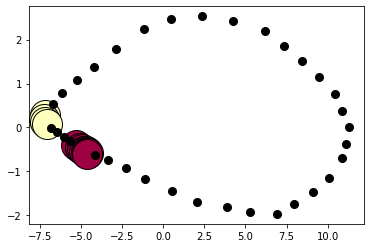

In [295]:
#FOR PV

unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
         for each in np.linspace(0,1, len(unique_labels))]
for k,col in zip(unique_labels, colors):
    if k == -1:
        col =[0,0,0,1]   #Black is used for noise
        
    class_member_mask = (labels == k)
    
    xy = X_principal[class_member_mask & core_samples_mask]
    plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], 'o', markerfacecolor = tuple(col), markeredgecolor = 'k', markersize = 30)
    
    xy = X_principal[class_member_mask & ~core_samples_mask]
    plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], 'o', markerfacecolor = tuple(col), markeredgecolor = 'k', markersize = 8)
    
   
    
plt.show()

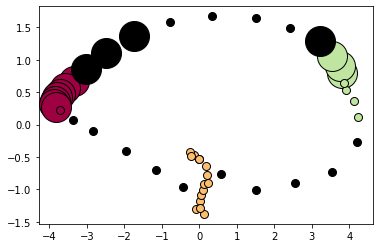

In [296]:
#FOR NPV

Nunique_labels = set(Nlabels)
Ncolors = [plt.cm.Spectral(each)
         for each in np.linspace(0,1, len(Nunique_labels))]
for k,col in zip(Nunique_labels, Ncolors):
    if k == -1:
        col =[0,0,0,1]   #Black is used for noise
        
    Nclass_member_mask = (Nlabels == k)
    
    Nxy = NX_principal[Nclass_member_mask & Ncore_samples_mask]
    plt.plot(Nxy.iloc[:, 0], Nxy.iloc[:, 1], 'o', markerfacecolor = tuple(col), markeredgecolor = 'k', markersize = 30)
    
    Nxy = NX_principal[Nclass_member_mask & ~Ncore_samples_mask]
    plt.plot(Nxy.iloc[:, 0], Nxy.iloc[:, 1], 'o', markerfacecolor = tuple(col), markeredgecolor = 'k', markersize = 8)
    

    
plt.show()

FOR 1HR

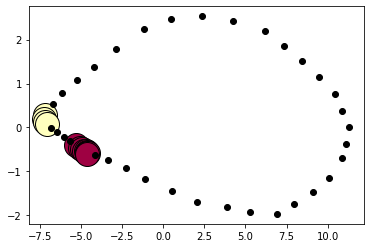

In [297]:
#FOR PV1

unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
         for each in np.linspace(0,1, len(unique_labels))]
for k,col in zip(unique_labels, colors):
    if k == -1:
        col =[0,0,0,1]   #Black is used for noise
        
    class_member_mask = (labels == k)
    
    xy1 = X_principal[class_member_mask & core_samples_mask]
    plt.plot(xy1.iloc[:, 0], xy1.iloc[:, 1], 'o', markerfacecolor = tuple(col), markeredgecolor = 'k', markersize = 24)
    
    xy1 = X_principal[class_member_mask & ~core_samples_mask]
    plt.plot(xy1.iloc[:, 0], xy1.iloc[:, 1], 'o', markerfacecolor = tuple(col), markeredgecolor = 'k', markersize = 6)
    

    
plt.show()

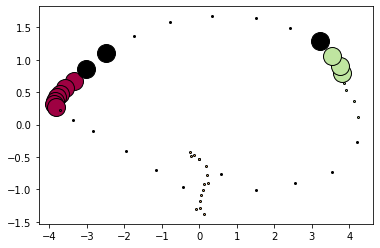

In [200]:
#FOR NPV1

Nunique_labels = set(Nlabels)
Ncolors = [plt.cm.Spectral(each)
         for each in np.linspace(0,1, len(Nunique_labels))]
for k,col in zip(Nunique_labels, Ncolors):
    if k == -1:
        col =[0,0,0,1]   #Black is used for noise
        
    Nclass_member_mask = (Nlabels == k)
    
    Nxy1 = NX_principal[Nclass_member_mask & Ncore_samples_mask]
    plt.plot(Nxy1.iloc[:, 0], Nxy1.iloc[:, 1], 'o', markerfacecolor = tuple(col), markeredgecolor = 'k', markersize = 18)
    
    Nxy1 = NX_principal[Nclass_member_mask & ~Ncore_samples_mask]
    plt.plot(Nxy1.iloc[:, 0], Nxy1.iloc[:, 1], 'o', markerfacecolor = tuple(col), markeredgecolor = 'k', markersize = 2)
    

    
plt.show()

# FAST SEARCH AND FIND BY DENSITY PEAK CLUSTERING

In [536]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import cluster, datasets
from sklearn.preprocessing import StandardScaler

FOR 30MINS 

In [537]:
#FOR PV

X_principal

,x,y
0,-4.869950,0.336024
1,-4.799576,0.355346
2,-4.665778,0.310958
3,-4.663355,0.239851
4,-4.612402,0.283541
...,...,...
17515,-6.265768,0.430287
17516,-6.351371,0.091132
17517,-5.896306,0.092121
17518,-5.540580,0.177566


In [538]:
G = X_principal

In [539]:
G

,x,y
0,-4.869950,0.336024
1,-4.799576,0.355346
2,-4.665778,0.310958
3,-4.663355,0.239851
4,-4.612402,0.283541
...,...,...
17515,-6.265768,0.430287
17516,-6.351371,0.091132
17517,-5.896306,0.092121
17518,-5.540580,0.177566


In [540]:
dict = {1: 'x', 2: 'y'}



In [541]:
G.rename(columns=dict, inplace=True)

In [542]:
G

,x,y
0,-4.869950,0.336024
1,-4.799576,0.355346
2,-4.665778,0.310958
3,-4.663355,0.239851
4,-4.612402,0.283541
...,...,...
17515,-6.265768,0.430287
17516,-6.351371,0.091132
17517,-5.896306,0.092121
17518,-5.540580,0.177566


In [543]:
A = G.to_numpy()
A


array([[-4.86994953,  0.33602406],
       [-4.79957622,  0.3553462 ],
       [-4.66577799,  0.31095821],
       ...,
       [-5.89630621,  0.09212126],
       [-5.5405805 ,  0.17756577],
       [-5.26843638,  0.26380011]])

In [544]:
rand = np.random.RandomState(0)
n_samples = 17520
random_state = 0


In [545]:

noisy_moons = datasets.make_moons(n_samples = n_samples, noise = .05, random_state = 0)
no_structure = rand.rand(n_samples , 2), None
varied = datasets.make_blobs(n_samples = n_samples, cluster_std = [1.0, 2.5,0.5], random_state = 0)

In [546]:
X,y = datasets.make_blobs(n_samples = 17520, random_state = 0)
X,y

(array([[-0.23770457,  2.58024377],
        [-0.38727393,  3.44525638],
        [ 0.63589267,  6.02498136],
        ...,
        [ 3.19799222,  0.90841117],
        [ 2.64615442,  2.69293691],
        [ 0.61018549,  3.72652883]]),
 array([0, 0, 0, ..., 1, 0, 0]))

In [547]:
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
aniso = (X_aniso, y)

In [548]:
datasets = [A]
datasets

[array([[-4.86994953,  0.33602406],
        [-4.79957622,  0.3553462 ],
        [-4.66577799,  0.31095821],
        ...,
        [-5.89630621,  0.09212126],
        [-5.5405805 ,  0.17756577],
        [-5.26843638,  0.26380011]])]

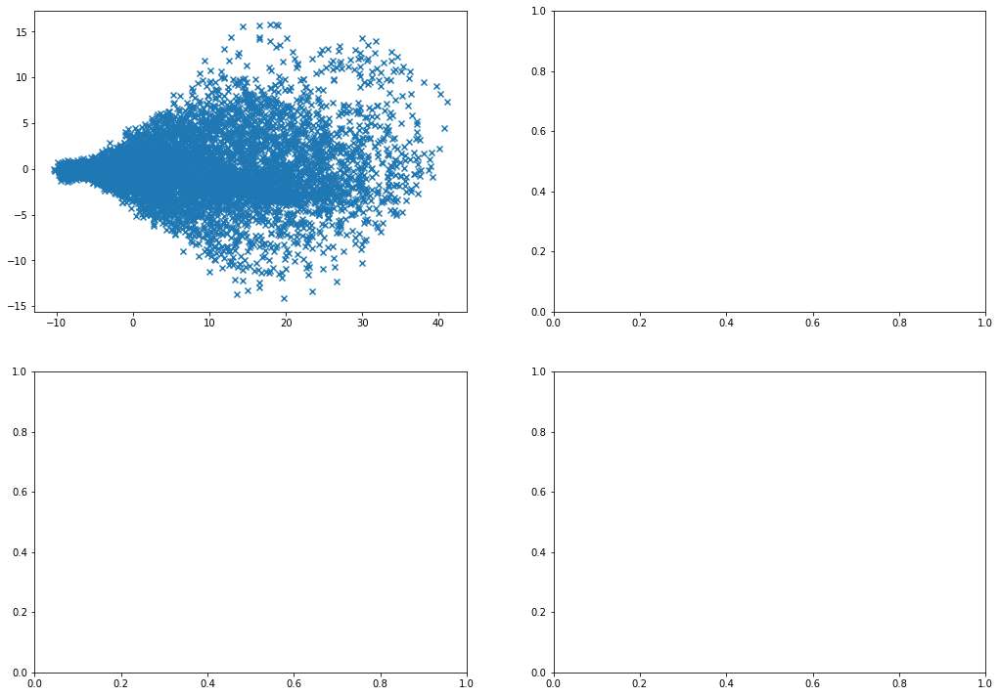

In [549]:
fig, axes = plt.subplots(2,2, figsize = (15, 10))
fig.subplots_adjust(left = 0.05, right = 0.95, top = 0.97, bottom = 0.03, hspace= 0.2, wspace = 0.2)

i = 0
for X in datasets:
    axes[i // 3][i % 3].scatter(X[:, 0], X[:, 1], marker = 'x')
    i += 1

In [550]:
class DPC(object):
    def __init__(self, X, n=0, dc_method=0, dc_percent=1, rho_method=1, delta_method=1, use_halo=False, plot=None):
        
        self.X = X
        
        def get_dc(self):
            pass
        
        def get_rho(self):
            pass
        
        def get_delta(self):
            pass
        
        def get_center(self):
            pass
        
        def get_halo(self):
            pass
        
        def assign(self):
            pass

In [551]:
X = datasets[0]
X

array([[-4.86994953,  0.33602406],
       [-4.79957622,  0.3553462 ],
       [-4.66577799,  0.31095821],
       ...,
       [-5.89630621,  0.09212126],
       [-5.5405805 ,  0.17756577],
       [-5.26843638,  0.26380011]])

In [552]:
from sklearn.metrics import euclidean_distances

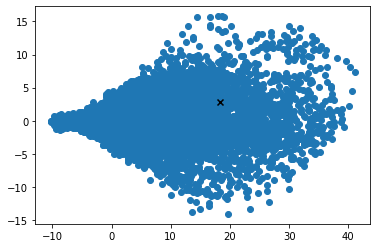

In [553]:
plt.scatter(X[:, 0], X[:, 1])
plt.scatter(X[449][0], X[449, 1], marker = 'x', c = 'k')

In [554]:
#FOR NPV
NX_principal

,x,y
0,-2.634014,-0.483359
1,-3.346024,-0.633966
2,-3.762134,-0.431280
3,-3.863517,-0.425225
4,-3.963040,-0.307174
...,...,...
17515,0.743825,-0.455417
17516,0.524021,-1.244552
17517,-0.151786,-1.352768
17518,-0.886395,-1.574287


In [555]:
NG = NX_principal
NG

,x,y
0,-2.634014,-0.483359
1,-3.346024,-0.633966
2,-3.762134,-0.431280
3,-3.863517,-0.425225
4,-3.963040,-0.307174
...,...,...
17515,0.743825,-0.455417
17516,0.524021,-1.244552
17517,-0.151786,-1.352768
17518,-0.886395,-1.574287


In [556]:
dict = {1: 'x', 2: 'y'}

NG.rename(columns=dict, inplace=True)
NG

,x,y
0,-2.634014,-0.483359
1,-3.346024,-0.633966
2,-3.762134,-0.431280
3,-3.863517,-0.425225
4,-3.963040,-0.307174
...,...,...
17515,0.743825,-0.455417
17516,0.524021,-1.244552
17517,-0.151786,-1.352768
17518,-0.886395,-1.574287


In [557]:
NA = NG.to_numpy()
NA

array([[-2.63401368, -0.48335851],
       [-3.34602437, -0.63396628],
       [-3.76213363, -0.43127995],
       ...,
       [-0.15178641, -1.35276828],
       [-0.88639529, -1.57428673],
       [-2.09408829, -1.27202891]])

In [558]:
rand = np.random.RandomState(0)
n_samples = 17520
random_state = 0

In [569]:
Ndatasets = [NA]
Ndatasets

[array([[-2.63401368, -0.48335851],
        [-3.34602437, -0.63396628],
        [-3.76213363, -0.43127995],
        ...,
        [-0.15178641, -1.35276828],
        [-0.88639529, -1.57428673],
        [-2.09408829, -1.27202891]])]

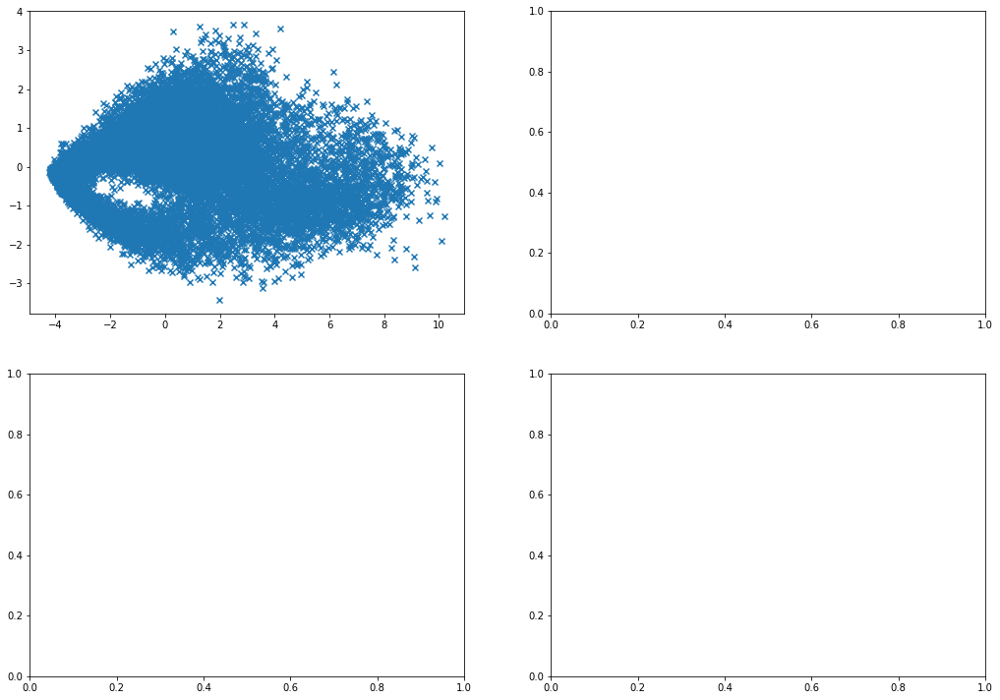

In [570]:
fig, axes = plt.subplots(2,2, figsize = (15, 10))
fig.subplots_adjust(left = 0.05, right = 0.95, top = 0.97, bottom = 0.03, hspace= 0.2, wspace = 0.2)

i = 0
for NX in datasets:
    axes[i // 3][i % 3].scatter(NX[:, 0], NX[:, 1], marker = 'x')
    i += 1

In [571]:
class DPC(object):
    def __init__(self, X, n=0, dc_method=0, dc_percent=1, rho_method=1, delta_method=1, use_halo=False, plot=None):
        
        self.X = X
        
        def get_dc(self):
            pass
        
        def get_rho(self):
            pass
        
        def get_delta(self):
            pass
        
        def get_center(self):
            pass
        
        def get_halo(self):
            pass
        
        def assign(self):
            pass

In [572]:
NX = Ndatasets[0]
NX

array([[-2.63401368, -0.48335851],
       [-3.34602437, -0.63396628],
       [-3.76213363, -0.43127995],
       ...,
       [-0.15178641, -1.35276828],
       [-0.88639529, -1.57428673],
       [-2.09408829, -1.27202891]])

In [573]:
from sklearn.metrics import euclidean_distances

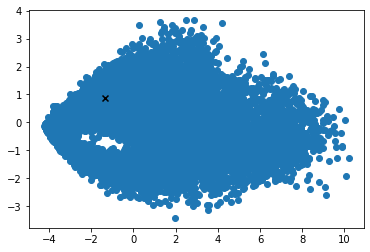

In [574]:
plt.scatter(NX[:, 0], NX[:, 1])
plt.scatter(NX[449][0], NX[449, 1], marker = 'x', c = 'k')

FOR 1HR

In [575]:
#FOR PV1

X1_principal

,1,2
0,-9.669625,0.689574
1,-9.329253,0.550609
2,-9.175447,0.585661
3,-9.118984,0.649212
4,-9.240926,0.751459
...,...,...
8755,-2.110483,-4.794854
8756,-8.088706,-2.944062
8757,-12.486906,0.771345
8758,-12.247632,0.177521


In [576]:
G1 = X1_principal
G1

,1,2
0,-9.669625,0.689574
1,-9.329253,0.550609
2,-9.175447,0.585661
3,-9.118984,0.649212
4,-9.240926,0.751459
...,...,...
8755,-2.110483,-4.794854
8756,-8.088706,-2.944062
8757,-12.486906,0.771345
8758,-12.247632,0.177521


In [577]:
dict = {1: 'x', 2: 'y'}

G1.rename(columns=dict, inplace=True)
G1

,x,y
0,-9.669625,0.689574
1,-9.329253,0.550609
2,-9.175447,0.585661
3,-9.118984,0.649212
4,-9.240926,0.751459
...,...,...
8755,-2.110483,-4.794854
8756,-8.088706,-2.944062
8757,-12.486906,0.771345
8758,-12.247632,0.177521


In [578]:
A1 = G1.to_numpy()
A1

array([[ -9.66962542,   0.68957391],
       [ -9.32925256,   0.55060911],
       [ -9.17544679,   0.58566073],
       ...,
       [-12.48690594,   0.77134504],
       [-12.24763197,   0.17752111],
       [-10.80913905,   0.43555065]])

In [579]:
rand = np.random.RandomState(0)
n_samples = 17520
random_state = 0

In [580]:
datasets1 = [A1]
datasets1

[array([[ -9.66962542,   0.68957391],
        [ -9.32925256,   0.55060911],
        [ -9.17544679,   0.58566073],
        ...,
        [-12.48690594,   0.77134504],
        [-12.24763197,   0.17752111],
        [-10.80913905,   0.43555065]])]

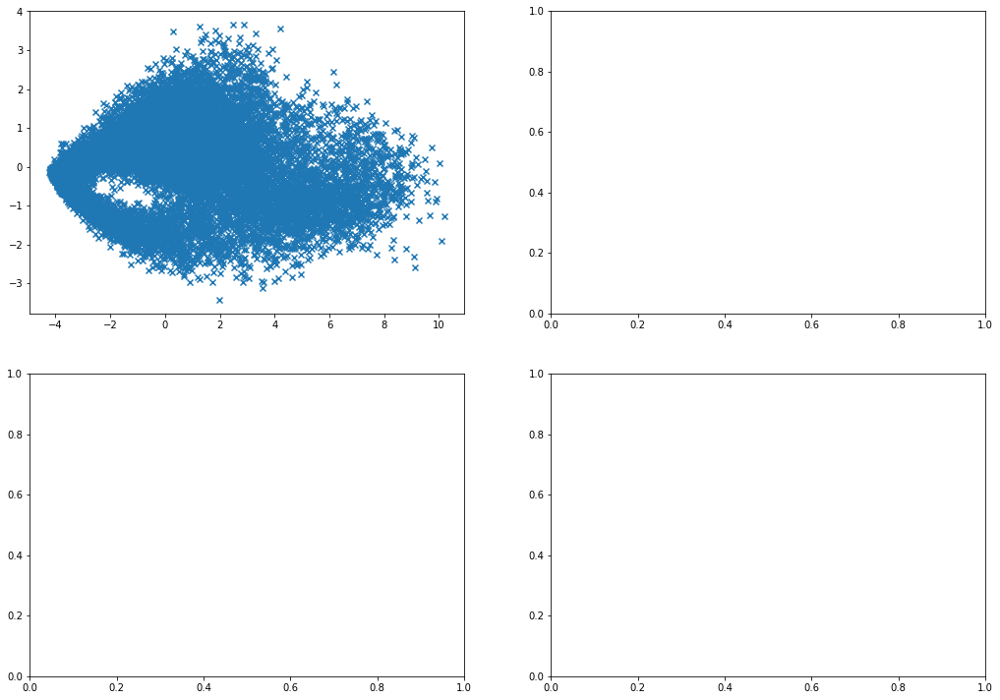

In [581]:
fig, axes = plt.subplots(2,2, figsize = (15, 10))
fig.subplots_adjust(left = 0.05, right = 0.95, top = 0.97, bottom = 0.03, hspace= 0.2, wspace = 0.2)

i = 0
for X1 in datasets:
    axes[i // 3][i % 3].scatter(X1[:, 0], X1[:, 1], marker = 'x')
    i += 1

In [582]:
class DPC(object):
    def __init__(self, X, n=0, dc_method=0, dc_percent=1, rho_method=1, delta_method=1, use_halo=False, plot=None):
        
        self.X = X
        
        def get_dc(self):
            pass
        
        def get_rho(self):
            pass
        
        def get_delta(self):
            pass
        
        def get_center(self):
            pass
        
        def get_halo(self):
            pass
        
        def assign(self):
            pass

In [583]:
X1 = datasets1[0]
X1

array([[ -9.66962542,   0.68957391],
       [ -9.32925256,   0.55060911],
       [ -9.17544679,   0.58566073],
       ...,
       [-12.48690594,   0.77134504],
       [-12.24763197,   0.17752111],
       [-10.80913905,   0.43555065]])

In [584]:
from sklearn.metrics import euclidean_distances

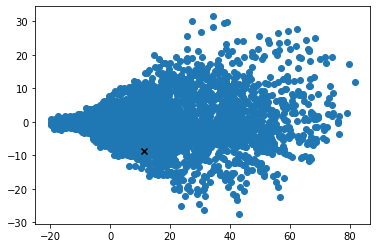

In [585]:
plt.scatter(X1[:, 0], X1[:, 1])
plt.scatter(X1[449][0], X1[449, 1], marker = 'x', c = 'k')

In [586]:
#FOR NPV1

NX1_principal

,1,2
0,-5.980067,1.119581
1,-7.624985,0.884646
2,-7.995807,0.564660
3,-8.253504,0.290831
4,-8.098487,0.334132
...,...,...
8755,-0.130287,0.067332
8756,0.485853,0.008260
8757,1.637856,1.330782
8758,0.373714,2.599493


In [587]:
NG1 = NX1_principal
NG1

,1,2
0,-5.980067,1.119581
1,-7.624985,0.884646
2,-7.995807,0.564660
3,-8.253504,0.290831
4,-8.098487,0.334132
...,...,...
8755,-0.130287,0.067332
8756,0.485853,0.008260
8757,1.637856,1.330782
8758,0.373714,2.599493


In [588]:
dict = {1: 'x', 2: 'y'}

NG1.rename(columns=dict, inplace=True)
NG1

,x,y
0,-5.980067,1.119581
1,-7.624985,0.884646
2,-7.995807,0.564660
3,-8.253504,0.290831
4,-8.098487,0.334132
...,...,...
8755,-0.130287,0.067332
8756,0.485853,0.008260
8757,1.637856,1.330782
8758,0.373714,2.599493


In [589]:
NA1 = NG1.to_numpy()
NA1

array([[-5.98006749,  1.11958054],
       [-7.62498475,  0.88464572],
       [-7.99580721,  0.56466007],
       ...,
       [ 1.63785589,  1.3307822 ],
       [ 0.3737143 ,  2.59949258],
       [-2.98169796,  2.88976907]])

In [590]:
rand = np.random.RandomState(0)
n_samples = 17520
random_state = 0

In [591]:
Ndatasets1 = [NA1]
Ndatasets1

[array([[-5.98006749,  1.11958054],
        [-7.62498475,  0.88464572],
        [-7.99580721,  0.56466007],
        ...,
        [ 1.63785589,  1.3307822 ],
        [ 0.3737143 ,  2.59949258],
        [-2.98169796,  2.88976907]])]

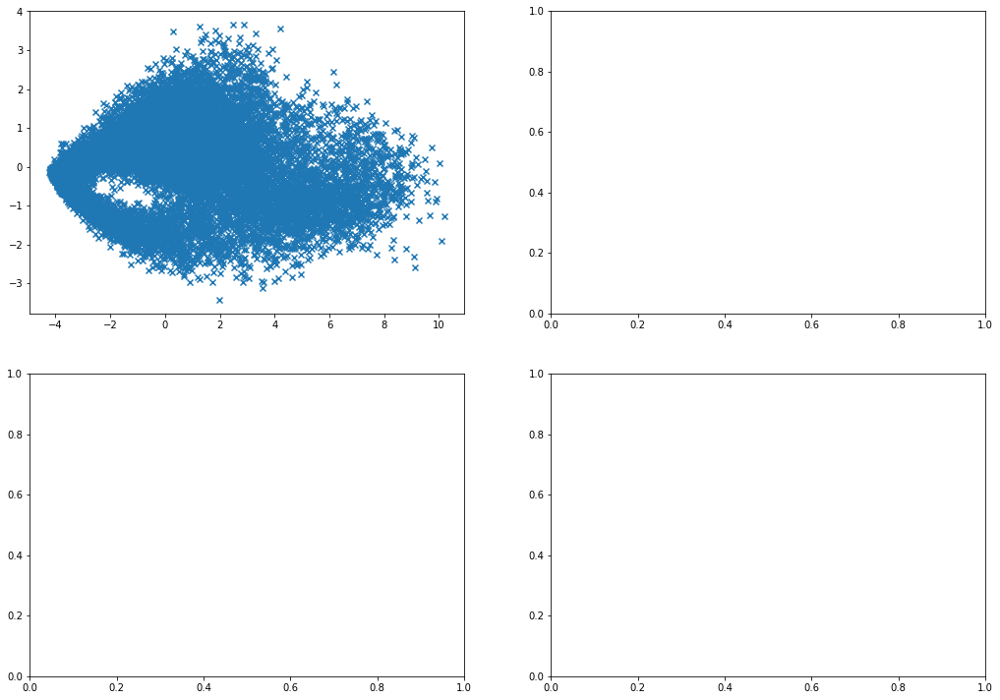

In [592]:
fig, axes = plt.subplots(2,2, figsize = (15, 10))
fig.subplots_adjust(left = 0.05, right = 0.95, top = 0.97, bottom = 0.03, hspace= 0.2, wspace = 0.2)

i = 0
for NX1 in datasets:
    axes[i // 3][i % 3].scatter(NX1[:, 0], NX1[:, 1], marker = 'x')
    i += 1

In [596]:
class DPC(object):
    def __init__(self, X, n=0, dc_method=0, dc_percent=1, rho_method=1, delta_method=1, use_halo=False, plot=None):
        
        self.X = X
        
        def get_dc(self):
            pass
        
        def get_rho(self):
            pass
        
        def get_delta(self):
            pass
        
        def get_center(self):
            pass
        
        def get_halo(self):
            pass
        
        def assign(self):
            pass

In [597]:
NX1 = Ndatasets1[0]
NX1

array([[-5.98006749,  1.11958054],
       [-7.62498475,  0.88464572],
       [-7.99580721,  0.56466007],
       ...,
       [ 1.63785589,  1.3307822 ],
       [ 0.3737143 ,  2.59949258],
       [-2.98169796,  2.88976907]])

In [598]:
from sklearn.metrics import euclidean_distances

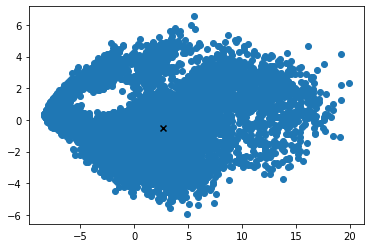

In [599]:
plt.scatter(NX1[:, 0], NX1[:, 1])
plt.scatter(NX1[449][0], NX1[449, 1], marker = 'x', c = 'k')

# THE END



# GOODLUCK ASAD !!!!!